This notebook begins with data preprocessing, followed by exploratory analyses, and then runs the traditional econometric models and machine learning models. The link for the Master file can be found here: https://drive.google.com/file/d/11Q0MmaFDvUx7NGaYRPHzIq85AFdUTZqm/view?usp=sharing

After merging all the 11 datasets (UK HPI data + 8 macro variables + Google Trend indices + GDELT news sentiment index), the dataset "Master file" was created. I will begin by loading all the required libraries and then loading the dataset into the dataframe df1.The pre-processing will be conducted on this data frame.

In [ ]:
# Importing all the required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.stattools import adfuller
from sklearn.preprocessing import StandardScaler

# Loading the Merged dataset called Master File into the data frame d1
df1=pd.read_csv('/content/Master file.csv')

In [ ]:
# Displaying the first five rows from the Master dataset
display(df1.head())

,Date,RegionName,AreaCode,AveragePrice,Index,SalesVolume,AWE_Total,AWE_Regular,UnemploymentRate,CPI,...,ConsumerConfidence,BM_New Housing,gt_trend_buying_demand,gt_trend_economic_policy,gt_trend_market_awareness,gt_trend_mortgage_financing,gt_trend_renting_affordability,AvgTone_Stitched,Docs_Stitched,Source
0,2005-01-01,Aberdeenshire,S12000034,105489,51.3,400,379.071339,353.799926,4.8,1.7,...,0.043352,70.1,-0.852310,-0.148716,-0.980873,-0.918624,-1.761248,5.659953,3443.0,Events_v1_0_ECON
1,2005-02-01,Aberdeenshire,S12000034,101145,49.2,289,370.950899,354.111354,4.7,1.7,...,0.119166,71.1,-0.874908,-0.337225,-0.818553,-1.022530,-1.822962,5.849820,4481.0,Events_v1_0_ECON
2,2005-03-01,Aberdeenshire,S12000034,98196,47.7,435,375.885979,356.510999,4.7,2.0,...,0.097383,71.4,-0.863609,-0.108321,-1.068276,-1.087471,-1.761248,6.084276,3601.0,Events_v1_0_ECON
3,2005-04-01,Aberdeenshire,S12000034,99302,48.3,499,378.563489,357.421050,4.8,1.9,...,-0.108099,71.8,-0.920102,-0.539199,-1.055790,-1.152412,-1.736563,6.143649,2613.0,Events_v1_0_ECON
4,2005-05-01,Aberdeenshire,S12000034,105412,51.2,515,379.516459,358.281707,4.8,1.9,...,-0.129858,72.2,-0.897505,-0.512269,-1.030817,-1.295282,-1.921704,5.747168,2777.0,Events_v1_0_ECON


In [ ]:
# Inspecting the structure of the Master dataset
print("Shape:", df1.shape)
print("\nColumns:\n", df1.columns.tolist())
print("\nData types:\n", df1.dtypes)


Shape: (99630, 23)

Columns:
 ['Date', 'RegionName', 'AreaCode', 'AveragePrice', 'Index', 'SalesVolume', 'AWE_Total', 'AWE_Regular', 'UnemploymentRate', 'CPI', 'MortgageApprovals', 'MortgageRate_2YFix', 'BankRate', 'ConsumerConfidence', 'BM_New Housing', 'gt_trend_buying_demand', 'gt_trend_economic_policy', 'gt_trend_market_awareness', 'gt_trend_mortgage_financing', 'gt_trend_renting_affordability', 'AvgTone_Stitched', 'Docs_Stitched', 'Source']

Data types:
 Date                               object
RegionName                         object
AreaCode                           object
AveragePrice                        int64
Index                             float64
SalesVolume                         int64
AWE_Total                         float64
AWE_Regular                       float64
UnemploymentRate                  float64
CPI                               float64
MortgageApprovals                   int64
MortgageRate_2YFix                float64
BankRate                        

In [ ]:
# Identifiying any missing values
print("\nMissing values per column:\n", df1.isnull().sum())


Missing values per column:
 Date                                 0
RegionName                           0
AreaCode                             0
AveragePrice                         0
Index                                0
SalesVolume                          0
AWE_Total                            0
AWE_Regular                          0
UnemploymentRate                     0
CPI                                  0
MortgageApprovals                    0
MortgageRate_2YFix                   0
BankRate                             0
ConsumerConfidence                   0
BM_New Housing                    2025
gt_trend_buying_demand               0
gt_trend_economic_policy             0
gt_trend_market_awareness            0
gt_trend_mortgage_financing          0
gt_trend_renting_affordability       0
AvgTone_Stitched                     0
Docs_Stitched                        0
Source                               0
dtype: int64


Cleaning dates

In [ ]:
# Identifying and converting the date column to datetime
date_col = "Date"
df1[date_col] = pd.to_datetime(df1[date_col], errors="coerce")

# Sorting by date and dropping null values
df1 = df1.sort_values(by=date_col).dropna(subset=[date_col])
df1 = df1.reset_index(drop=True)

# Setting the date as index for time-series analysis
df1 = df1.set_index(date_col)
print(df1.index.min(), "→", df1.index.max())


2005-01-01 00:00:00 → 2025-06-01 00:00:00


In [ ]:
df1

,RegionName,AreaCode,AveragePrice,Index,SalesVolume,AWE_Total,AWE_Regular,UnemploymentRate,CPI,MortgageApprovals,...,ConsumerConfidence,BM_New Housing,gt_trend_buying_demand,gt_trend_economic_policy,gt_trend_market_awareness,gt_trend_mortgage_financing,gt_trend_renting_affordability,AvgTone_Stitched,Docs_Stitched,Source
Date,,,,,,,,,,,,,,,,,,,,,
2005-01-01,Aberdeenshire,S12000034,105489,51.3,400,379.071339,353.799926,4.8,1.7,81665,...,0.043352,70.1,-0.852310,-0.148716,-0.980873,-0.918624,-1.761248,5.659953,3443.0,Events_v1_0_ECON
2005-01-01,Tameside,E08000008,100052,51.4,210,379.071339,353.799926,4.8,1.7,81665,...,0.043352,70.1,-0.852310,-0.148716,-0.980873,-0.918624,-1.761248,5.659953,3443.0,Events_v1_0_ECON
2005-01-01,Chesterfield,E07000034,112275,58.1,94,379.071339,353.799926,4.8,1.7,81665,...,0.043352,70.1,-0.852310,-0.148716,-0.980873,-0.918624,-1.761248,5.659953,3443.0,Events_v1_0_ECON
2005-01-01,Swindon,E06000030,146091,56.3,246,379.071339,353.799926,4.8,1.7,81665,...,0.043352,70.1,-0.852310,-0.148716,-0.980873,-0.918624,-1.761248,5.659953,3443.0,Events_v1_0_ECON
2005-01-01,Chichester,E07000225,250822,56.2,129,379.071339,353.799926,4.8,1.7,81665,...,0.043352,70.1,-0.852310,-0.148716,-0.980873,-0.918624,-1.761248,5.659953,3443.0,Events_v1_0_ECON
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-06-01,West Lancashire,E07000127,229754,110.2,46,724.501564,678.812393,4.7,4.1,64571,...,0.136764,NaN,0.390537,0.713039,0.504978,-0.295191,0.509815,-0.826562,8278.0,GKG_v2_0_Housing
2025-06-01,Southwark,E09000028,599772,100.8,49,724.501564,678.812393,4.7,4.1,64571,...,0.136764,NaN,0.390537,0.713039,0.504978,-0.295191,0.509815,-0.826562,8278.0,GKG_v2_0_Housing
2025-06-01,Cotswold,E07000079,418802,90.9,25,724.501564,678.812393,4.7,4.1,64571,...,0.136764,NaN,0.390537,0.713039,0.504978,-0.295191,0.509815,-0.826562,8278.0,GKG_v2_0_Housing


Checking for missing values

In [ ]:
# Missing value analysis
# Checking the total number of missing values for each variable
missing_summary = df1.isnull().sum().sort_values(ascending=False)
print("Missing values per column:\n")
print(missing_summary[missing_summary > 0])

# Percentage of missing values
missing_percent = (df1.isnull().sum() / len(df1)) * 100
print("\nPercentage missing per column:\n")
print(missing_percent[missing_percent > 0].round(2))



Missing values per column:

BM_New Housing    2025
dtype: int64

Percentage missing per column:

BM_New Housing    2.03
dtype: float64


It can be seen that only the variable BM_New Housing contains 2025 missing values., which is only 2% of the overall data. I will now investigate if there is any pattern to the missingness.  

In [ ]:
# Investigating the missingness pattern for variable BM_New Housing
missing_bm = df1[df1['BM_New Housing'].isnull()]

# Finding when missingness occurs
print("First 10 missing entries:")
print(missing_bm.index.to_series().head(10))

# Counting the missing values per year
missing_by_year = missing_bm.groupby(missing_bm.index.year).size()
print("\nMissing count by year for BM_New Housing:")
print(missing_by_year)


First 10 missing entries:
Date
2025-02-01   2025-02-01
2025-02-01   2025-02-01
2025-02-01   2025-02-01
2025-02-01   2025-02-01
2025-02-01   2025-02-01
2025-02-01   2025-02-01
2025-02-01   2025-02-01
2025-02-01   2025-02-01
2025-02-01   2025-02-01
2025-02-01   2025-02-01
Name: Date, dtype: datetime64[ns]

Missing count by year for BM_New Housing:
Date
2025    2025
dtype: int64


In [ ]:
# Finding the specific months for which BM_New Housing was missing
missing_bm = df1[df1['BM_New Housing'].isnull()]

print("Months with missing BM_New Housing values:")
print(sorted(missing_bm.index.unique()))


Months with missing BM_New Housing values:
[Timestamp('2025-02-01 00:00:00'), Timestamp('2025-03-01 00:00:00'), Timestamp('2025-04-01 00:00:00'), Timestamp('2025-05-01 00:00:00'), Timestamp('2025-06-01 00:00:00')]


This confirms that there is a pattern to the missingness. The variable only has missing values for the time period February 2025 to June 2025. This is because when I collected the data for BM_New Housing, it was only available until January 2025.

Solving the Missgness Issue

In order to correct for missigness, I will use forward filling because BM_New Housing is a very slow moving macroeconomic variable. In order to avoid creating artificial shocks close to the end of the sample period, I will be using January 2025's value to forward fill for months February 2025 to June 2025.

In [ ]:
#Correcting for Missingness
# Forward-filling the BM_New Housing variable using January 2025's value
df1['BM_New Housing'] = df1['BM_New Housing'].fillna(method='ffill')

# Checking if any missing values still remain for the affected period February 2025 to June 2025
print("Remaining missing:", df1['BM_New Housing'].isnull().sum())
print(df1.loc['2025-01-01':'2025-06-01', ['BM_New Housing']])


Remaining missing: 0
            BM_New Housing
Date                      
2025-01-01           152.4
2025-01-01           152.4
2025-01-01           152.4
2025-01-01           152.4
2025-01-01           152.4
...                    ...
2025-06-01           152.4
2025-06-01           152.4
2025-06-01           152.4
2025-06-01           152.4
2025-06-01           152.4

[2430 rows x 1 columns]


/tmp/ipython-input-1342973661.py:3: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df1['BM_New Housing'] = df1['BM_New Housing'].fillna(method='ffill')


Renaming Variables

In [ ]:
# Renaming the variables
df1.rename(columns={
    'Index': 'HPI',
    'AWE_Regular': 'AW_Regular_Earnings',
    'MortgageRate_2YFix': 'MortgageRate',
    'AvgTone_Stitched': 'GDELT_average_news_tone',
    'gt_trend_buying_demand': 'GT_demand',
    'gt_trend_economic_policy': 'GT_economicpolicy',
    'gt_trend_market_awareness': 'GT_marketawareness',
    'gt_trend_mortgage_financing': 'GT_mortgage_financing',
    'gt_trend_renting_affordability': 'GT_renting_affordability',
    'BM_New Housing': 'ConstructionCost_Index'
}, inplace=True)

# Inspecting the renamed column names
df1.columns


Index(['RegionName', 'AreaCode', 'AveragePrice', 'HPI', 'SalesVolume',
       'AWE_Total', 'AW_Regular_Earnings', 'UnemploymentRate', 'CPI',
       'MortgageApprovals', 'MortgageRate', 'BankRate', 'ConsumerConfidence',
       'ConstructionCost_Index', 'GT_demand', 'GT_economicpolicy',
       'GT_marketawareness', 'GT_mortgage_financing',
       'GT_renting_affordability', 'GDELT_average_news_tone', 'Docs_Stitched',
       'Source'],
      dtype='object')

GDELT Average News Tone

In [ ]:
# Creating a new categorical variable for GDELT version to account for the transition from GDELT 1.0 to GDELT 2.0
df1['GDELT_Version'] = np.where(df1.index < '2015-02-01', 'GDELT 1.0', 'GDELT 2.0')



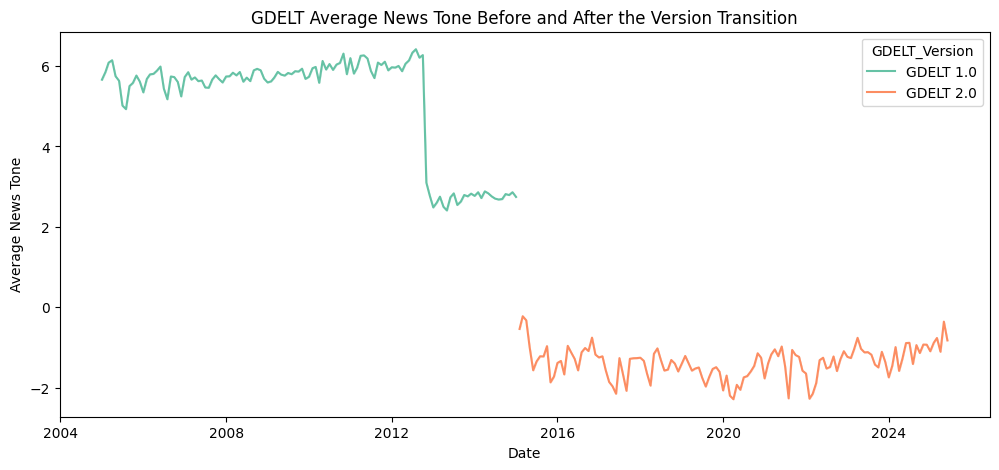

In [ ]:
# Plot of the raw GDELT tone levels
plt.figure(figsize=(12, 5))
sns.lineplot(data=df1, x=df1.index, y='GDELT_average_news_tone',
             hue='GDELT_Version', palette='Set2')

plt.title("GDELT Average News Tone Before and After the Version Transition")
plt.xlabel("Date")
plt.ylabel("Average News Tone")
plt.show()


In [ ]:
# Normalisation of GDELT average news tone for version 1.0 and 2.0

df1['GDELT_average_news_tone_normalized'] = (
    df1.groupby('GDELT_Version')['GDELT_average_news_tone']
      .transform(lambda x: (x - x.mean()) / x.std())
)


For GDELT news tone, the z-score standardisation was applied to the two versions to eliminate the differences in scale and variance as a result of the different data structures of the two versions.

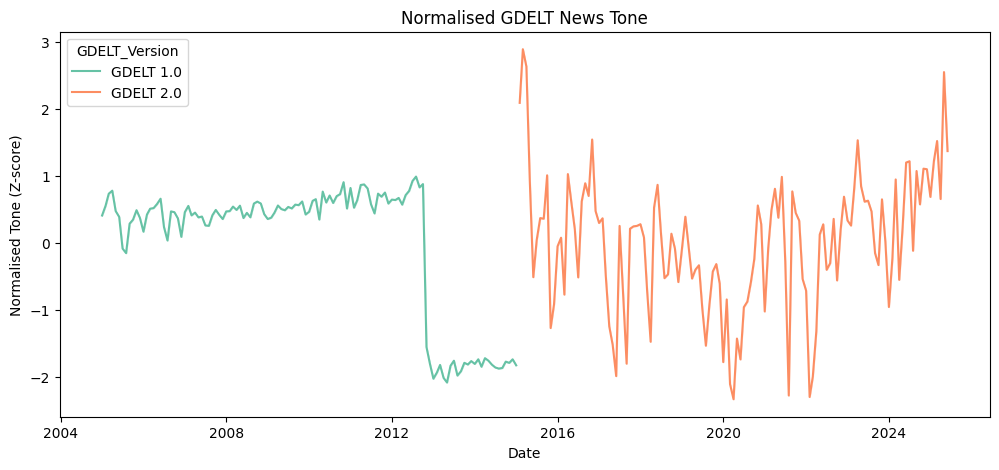

In [ ]:
#Plotting normalised tone level
plt.figure(figsize=(12, 5))
sns.lineplot(data=df1, x=df1.index, y='GDELT_average_news_tone_normalized',
             hue='GDELT_Version', palette='Set2')

plt.title("Normalised GDELT News Tone")
plt.xlabel("Date")
plt.ylabel("Normalised Tone (Z-score)")
plt.show()


Standardisation of macro variables

In [ ]:
# Standardising the macroeconomic predictors before modelling
macro_features = [
    'AW_Regular_Earnings','UnemploymentRate', 'CPI', 'MortgageApprovals', 'MortgageRate','BankRate', 'ConsumerConfidence', 'ConstructionCost_Index'
]

scaler = StandardScaler()
df1_scaled = df1.copy()
df1_scaled[macro_features] = scaler.fit_transform(df1_scaled[macro_features])

df1_scaled.head()


,RegionName,AreaCode,AveragePrice,HPI,SalesVolume,AWE_Total,AW_Regular_Earnings,UnemploymentRate,CPI,MortgageApprovals,...,GT_demand,GT_economicpolicy,GT_marketawareness,GT_mortgage_financing,GT_renting_affordability,GDELT_average_news_tone,Docs_Stitched,Source,GDELT_Version,GDELT_average_news_tone_normalized
Date,,,,,,,,,,,,,,,,,,,,,
2005-01-01,Aberdeenshire,S12000034,105489,51.3,400,379.071339,-1.476188,-0.476411,-0.566424,0.678453,...,-0.85231,-0.148716,-0.980873,-0.918624,-1.761248,5.659953,3443.0,Events_v1_0_ECON,GDELT 1.0,0.409326
2005-01-01,Tameside,E08000008,100052,51.4,210,379.071339,-1.476188,-0.476411,-0.566424,0.678453,...,-0.85231,-0.148716,-0.980873,-0.918624,-1.761248,5.659953,3443.0,Events_v1_0_ECON,GDELT 1.0,0.409326
2005-01-01,Chesterfield,E07000034,112275,58.1,94,379.071339,-1.476188,-0.476411,-0.566424,0.678453,...,-0.85231,-0.148716,-0.980873,-0.918624,-1.761248,5.659953,3443.0,Events_v1_0_ECON,GDELT 1.0,0.409326
2005-01-01,Swindon,E06000030,146091,56.3,246,379.071339,-1.476188,-0.476411,-0.566424,0.678453,...,-0.85231,-0.148716,-0.980873,-0.918624,-1.761248,5.659953,3443.0,Events_v1_0_ECON,GDELT 1.0,0.409326
2005-01-01,Chichester,E07000225,250822,56.2,129,379.071339,-1.476188,-0.476411,-0.566424,0.678453,...,-0.85231,-0.148716,-0.980873,-0.918624,-1.761248,5.659953,3443.0,Events_v1_0_ECON,GDELT 1.0,0.409326


Checking for any missing month in this regional panel dataset

In [ ]:
# Investigating if there are any missing months for each region
full_range = pd.date_range(start=df1.index.min(), end=df1.index.max(), freq='MS')
region_missing = {}

for region, subset in df1.groupby('RegionName'):
    region_months = subset.index.unique()
    missing = full_range.difference(region_months)
    if len(missing) > 0:
        region_missing[region] = len(missing)

print("Regions with missing months:", len(region_missing))
print(region_missing)


Regions with missing months: 0
{}


Checking for duplicates in the dataset to ensure that the regional panel is balanced

In [ ]:
# Checking for duplicates in the Date and RegionName
df_dupi = df1.reset_index()
duplicates = df_dupi.duplicated(subset=['Date', 'RegionName'])

print("Number of duplicate rows:", duplicates.sum())

# Inspect a sample of duplicates, if any
if duplicates.sum() > 0:
    display(df_dupi[duplicates].head())

Number of duplicate rows: 0


Checking the number of regions in the dataset

In [ ]:
# Counting the number of unique regions present in the panel dataset
unique_regions = df1['RegionName'].unique()
print(f"Total unique regions: {len(unique_regions)}")

# Displaying the first 10 region names
print("\nSample region names:")
print(unique_regions[:10])


Total unique regions: 405

Sample region names:
['Aberdeenshire' 'Tameside' 'Chesterfield' 'Swindon' 'Chichester'
 'Swansea' 'Chorley' 'Swale' 'City of Aberdeen' 'Sutton']


As mentioned in the report, there are indeed 405 unique regions in the dataset.

In [ ]:
# Counting the number of observations for each region
region_counts = df1['RegionName'].value_counts().sort_index()
print("\nFrequency of rows per region:")
print(region_counts.head())

print("\nMinimum months available for any region:", region_counts.min())
print("Maximum months available for any region:", region_counts.max())



Frequency of rows per region:
RegionName
Aberdeenshire              246
Adur                       246
Amber Valley               246
Angus                      246
Antrim and Newtownabbey    246
Name: count, dtype: int64

Minimum months available for any region: 246
Maximum months available for any region: 246


In [ ]:
# Displaing all the region names to check naming consistency
region_list = sorted(df1_scaled['RegionName'].unique())
print(f"Total unique regions: {len(region_list)}\n")
for r in region_list:
    print(r)


Total unique regions: 405

Aberdeenshire
Adur
Amber Valley
Angus
Antrim and Newtownabbey
Ards and North Down
Argyll and Bute
Armagh City Banbridge and Craigavon
Arun
Ashfield
Ashford
Babergh
Barking and Dagenham
Barnet
Barnsley
Basildon
Basingstoke and Deane
Bassetlaw
Bath and North East Somerset
Bedford
Belfast
Bexley
Birmingham
Blaby
Blackburn with Darwen
Blackpool
Blaenau Gwent
Bolsover
Bolton
Boston
Bournemouth Christchurch and Poole
Bracknell Forest
Bradford
Braintree
Breckland
Brent
Brentwood
Bridgend
Brighton and Hove
Broadland
Bromley
Bromsgrove
Broxbourne
Broxtowe
Buckinghamshire
Burnley
Bury
Caerphilly
Calderdale
Cambridge
Cambridgeshire
Camden
Cannock Chase
Canterbury
Cardiff
Carmarthenshire
Castle Point
Causeway Coast and Glens
Central Bedfordshire
Ceredigion
Charnwood
Chelmsford
Cheltenham
Cherwell
Cheshire East
Cheshire West and Chester
Chesterfield
Chichester
Chorley
City of Aberdeen
City of Bristol
City of Derby
City of Dundee
City of Edinburgh
City of Glasgow
City of K

In [ ]:
# Checking for inconsistent spacing or casing in RegionName
region_names = df1['RegionName'].unique()
inconsistent = [r for r in region_names if r.strip() != r or r != r.title()]

print("Potential inconsistencies found:" if inconsistent else "No inconsistencies detected.")
print(inconsistent)

Potential inconsistencies found:
['City of Aberdeen', 'City of Bristol', 'City of Derby', 'City of Dundee', 'City of Edinburgh', 'City of Glasgow', 'City of Kingston upon Hull', 'Stratford-on-Avon', 'Cheshire West and Chester', 'City of London', 'Tonbridge and Malling', 'Causeway Coast and Glens', 'Telford and Wrekin', 'Stoke-on-Trent', 'Stockton-on-Tees', 'Derry City and Strabane', 'City of Nottingham', 'Southend-on-Sea', 'City of Peterborough', 'City of Plymouth', 'City of Westminster', 'Basingstoke and Deane', 'Westmorland and Furness', 'Bath and North East Somerset', 'Blackburn with Darwen', 'Antrim and Newtownabbey', 'Ards and North Down', 'Argyll and Bute', 'Armagh City Banbridge and Craigavon', 'Barking and Dagenham', 'Windsor and Maidenhead', 'Vale of White Horse', 'Vale of Glamorgan', 'Tyne and Wear', 'Bournemouth Christchurch and Poole', 'Brighton and Hove', 'Hinckley and Bosworth', 'Newry Mourne and Down', 'Newcastle-under-Lyme', 'Newcastle upon Tyne', 'Hammersmith and Fulha

In [ ]:
# Cleaning the formatting issues in the region names
df1['RegionName'] = (
    df1['RegionName']
    .str.strip()
    .str.title()
)

# Correcting specific cases where title-casing produces incorrect results
df1['RegionName'] = df1['RegionName'].replace({
    "King'S Lynn And West Norfolk": "King's Lynn and West Norfolk",
    "Na H-Eileanan Siar": "Na h-Eileanan Siar"
})

Dropping variables that are not required for modelling

In [ ]:
# Dropping unnecessary variables
vars_to_drop = [
    'AWE_Total',
    'Docs_Stitched'
]

df1 = df1.drop(columns=vars_to_drop, errors='ignore')


## Descriptive Statistics

In [ ]:
# Summary statistics for all the numeric variables
df1.describe().T.round(2)


,count,mean,std,min,25%,50%,75%,max
AveragePrice,99630.0,225181.14,131377.70,55316.00,138833.00,188266.00,270702.25,1656986.00
HPI,99630.0,73.88,16.36,27.60,60.00,71.50,86.70,153.10
SalesVolume,99630.0,1256.13,7837.20,2.00,128.00,196.00,337.00,183609.00
AW_Regular_Earnings,99630.0,473.86,81.33,353.80,416.65,451.69,511.90,678.81
UnemploymentRate,99630.0,5.50,1.47,3.60,4.30,5.10,6.70,8.50
CPI,99630.0,2.76,1.87,0.20,1.80,2.40,3.10,9.60
MortgageApprovals,99630.0,67054.83,21534.65,9373.00,52168.00,65164.50,70982.00,126184.00
MortgageRate,99630.0,3.35,1.57,1.20,1.75,3.36,4.72,6.60
BankRate,99630.0,1.90,2.06,0.10,0.50,0.50,4.50,5.75
ConsumerConfidence,99630.0,0.00,0.32,-1.58,-0.15,0.02,0.16,0.90


# Exploratory Data Analysis

Plots of Trends overtime for all the variables

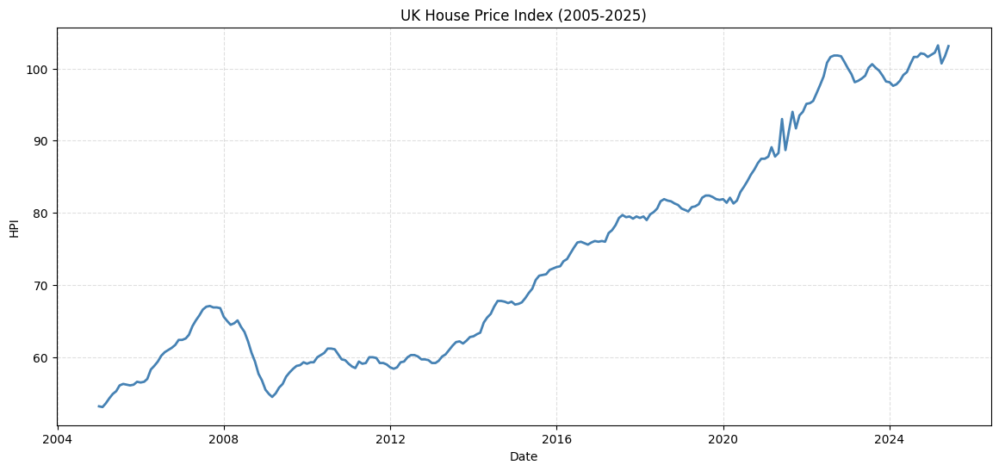

In [ ]:
# Plotting the UK-Level HPI
df_uk = df1[df1['RegionName'] == 'United Kingdom']

plt.figure(figsize=(14, 6))
plt.plot(df_uk.index, df_uk['HPI'], linewidth=2, color='steelblue')
plt.title("UK House Price Index (2005-2025)")
plt.xlabel("Date")
plt.ylabel("HPI")
plt.grid(alpha=0.4, linestyle='--')
plt.show()


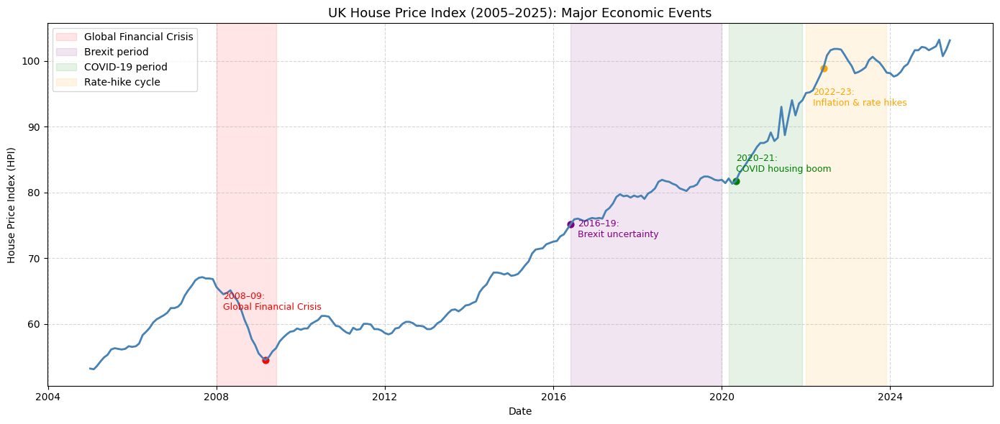

In [ ]:
#Plot of UK-Level HPI with annotations indicating key economic phases from 2005 to 2025

df_uk = df1[df1['RegionName'] == 'United Kingdom'].sort_index()

def ts(d):
    """Small helper for cleaner date handling."""
    return pd.Timestamp(d)

fig, ax = plt.subplots(figsize=(14, 6))
ax.plot(df_uk.index, df_uk['HPI'], color='steelblue', linewidth=2)

ax.set_title("UK House Price Index (2005–2025): Major Economic Events", fontsize=13)
ax.set_xlabel("Date")
ax.set_ylabel("House Price Index (HPI)")
ax.grid(True, linestyle='--', alpha=0.5)

# Reference points for annotation placement
y_min, y_max = df_uk['HPI'].min(), df_uk['HPI'].max()

# Highlighting key periods relevant to the housing market
ax.axvspan(ts('2008-01-01'), ts('2009-06-01'), color='red',    alpha=0.1, label='Global Financial Crisis')
ax.axvspan(ts('2016-06-01'), ts('2020-01-01'), color='purple', alpha=0.1, label='Brexit period')
ax.axvspan(ts('2020-03-01'), ts('2021-12-01'), color='green',  alpha=0.1, label='COVID-19 period')
ax.axvspan(ts('2022-01-01'), ts('2023-12-01'), color='orange', alpha=0.1, label='Rate-hike cycle')


ax.text(ts('2008-03-01'), y_min + 0.18*(y_max-y_min),
        "2008–09:\nGlobal Financial Crisis", color='red', fontsize=9)

ax.text(ts('2016-08-01'), y_min + 0.40*(y_max-y_min),
        "2016–19:\nBrexit uncertainty", color='purple', fontsize=9)

ax.text(ts('2020-05-01'), y_min + 0.60*(y_max-y_min),
        "2020–21:\nCOVID housing boom", color='green', fontsize=9)

ax.text(ts('2022-03-01'), y_min + 0.80*(y_max-y_min),
        "2022–23:\nInflation & rate hikes", color='orange', fontsize=9)

# Reference points
important_dates = [
    ('2009-03-01', 'red'),
    ('2016-06-01', 'purple'),
    ('2020-05-01', 'green'),
    ('2022-06-01', 'orange')
]

for date, colour in important_dates:
    dt = ts(date)
    if dt in df_uk.index:
        ax.scatter(dt, df_uk.loc[dt, 'HPI'], color=colour, s=40)

ax.legend()
plt.tight_layout()
plt.show()


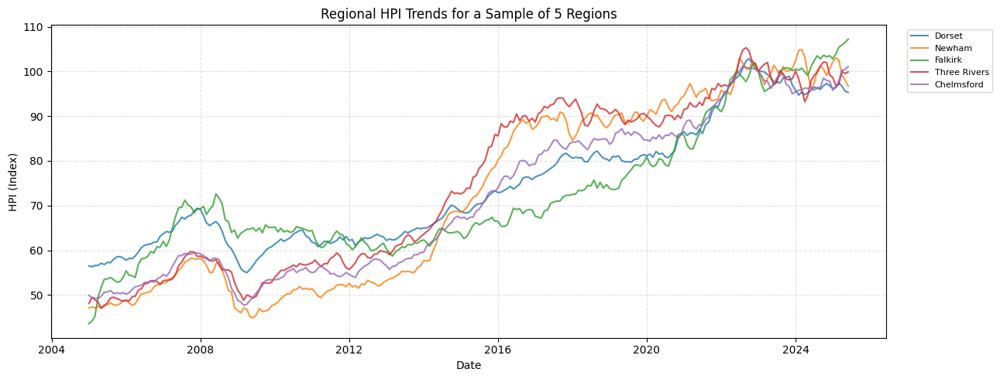

In [ ]:
# Plot of HPI overtime for sample of 5 regions randomly
sample_regions = df1['RegionName'].drop_duplicates().sample(5, random_state=42)

plt.figure(figsize=(13,5))
for region in sample_regions:
    subset = df1[df1['RegionName'] == region]
    plt.plot(subset.index, subset['HPI'], label=region, alpha=0.8)

plt.title("Regional HPI Trends for a Sample of 5 Regions")
plt.xlabel("Date")
plt.ylabel("HPI (Index)")
plt.grid(ls='--', alpha=0.4)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=8)
plt.tight_layout()
plt.show()


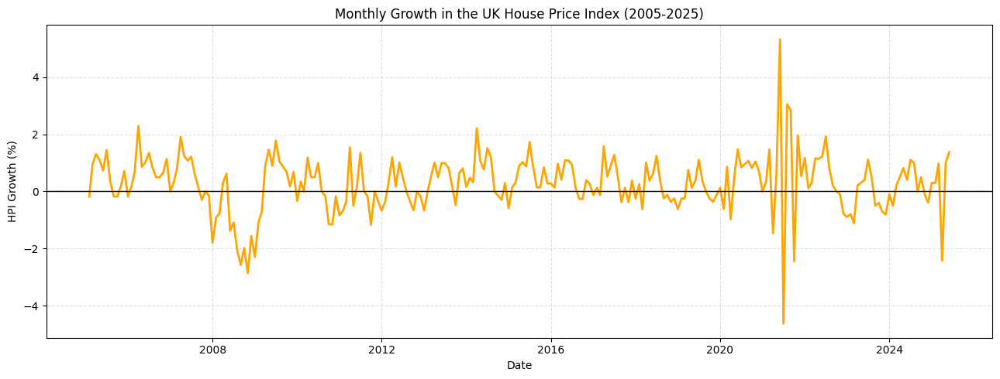

In [ ]:
#Plotting UK HPI growth from 2005 to 2025
df_uk = df1[df1['RegionName'] == 'United Kingdom'].copy()

# Month-on-month percentage change
df_uk['HPI_growth'] = df_uk['HPI'].pct_change() * 100

plt.figure(figsize=(13,5))
plt.plot(df_uk.index, df_uk['HPI_growth'], color='orange', linewidth=2)
plt.axhline(0, color='black', linewidth=1)

plt.title("Monthly Growth in the UK House Price Index (2005-2025)")
plt.xlabel("Date")
plt.ylabel("HPI Growth (%)")
plt.grid(ls='--', alpha=0.4)

plt.tight_layout()
plt.show()


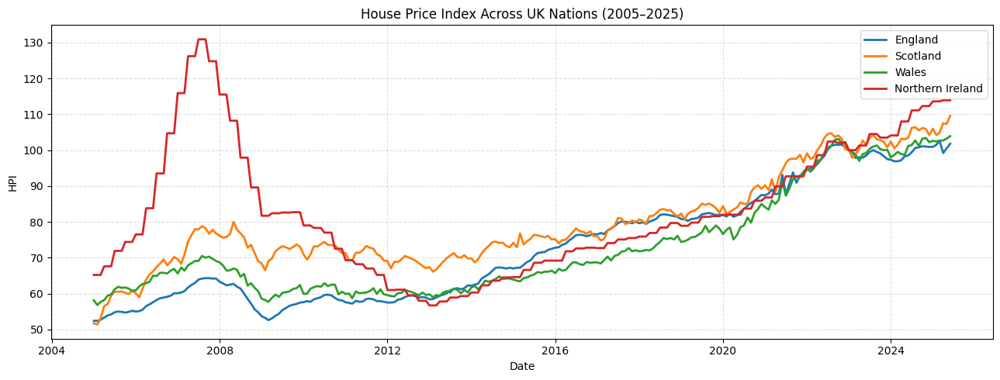

In [ ]:
#Plotting HPI overtime for the nations: England, Scotland, Wales, and Northern Ireland
nations = ['England', 'Scotland', 'Wales', 'Northern Ireland']
df_nations = df1[df1['RegionName'].isin(nations)]

plt.figure(figsize=(13,5))
for nation in nations:
    series = df_nations[df_nations['RegionName'] == nation]
    plt.plot(series.index, series['HPI'], label=nation, linewidth=2)

plt.title("House Price Index Across UK Nations (2005–2025)")
plt.xlabel("Date")
plt.ylabel("HPI")
plt.grid(alpha=0.4, ls='--')
plt.legend()
plt.tight_layout()
plt.show()


HPI and GDELT news tone

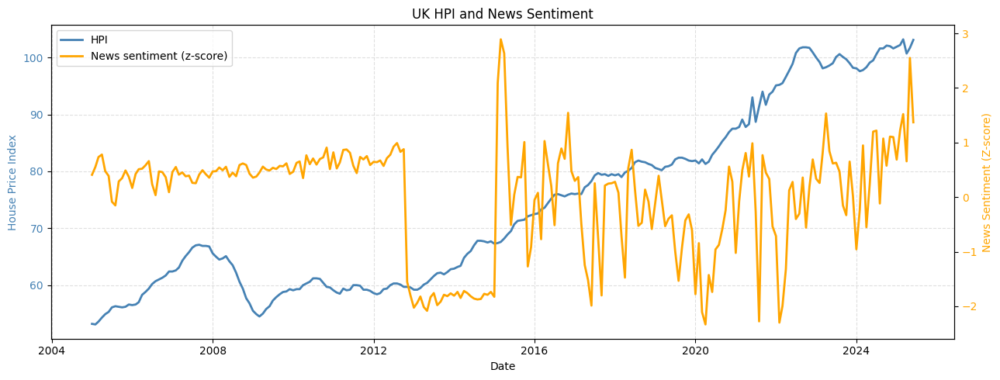

In [ ]:
#Plotting UK HPI against normalised GDELT average news tone
df_uk = df1[df1['RegionName'] == 'United Kingdom'].sort_index()

fig, ax1 = plt.subplots(figsize=(13,5))

# HPI on the left axis
ax1.plot(df_uk.index, df_uk['HPI'], color='steelblue', linewidth=2, label='HPI')
ax1.set_xlabel("Date")
ax1.set_ylabel("House Price Index", color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

# Normalised GDELT average news tone on the right axis
ax2 = ax1.twinx()
ax2.plot(df_uk.index, df_uk['GDELT_average_news_tone_normalized'],
         color='orange', linewidth=2, label='News sentiment (z-score)')
ax2.set_ylabel("News Sentiment (Z-score)", color='orange')
ax2.tick_params(axis='y', labelcolor='orange')

ax1.grid(ls='--', alpha=0.4)
plt.title("UK HPI and News Sentiment")

lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper left')

plt.tight_layout()
plt.show()


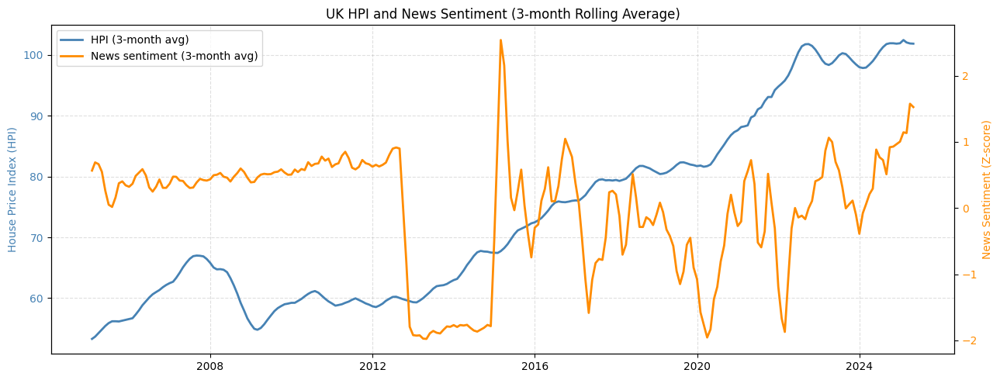

In [ ]:
# Plotting UK HPI against normalised GDELT average news tone using three month rolling average
df_uk = df1[df1['RegionName'] == 'United Kingdom'].sort_index().copy()

# Calculating three month moving average for both HPI and normalised GDELT tone
df_uk['HPI_smooth'] = df_uk['HPI'].rolling(window=3, center=True).mean()
df_uk['GDELT_smooth'] = df_uk['GDELT_average_news_tone_normalized'].rolling(window=3, center=True).mean()

fig, ax1 = plt.subplots(figsize=(13,5))

# HPI on the left axis
ax1.plot(df_uk.index, df_uk['HPI_smooth'], color='steelblue', linewidth=2,
         label='HPI (3-month avg)')
ax1.set_ylabel("House Price Index (HPI)", color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

# Normalised GDELT average news tone on the right axis
ax2 = ax1.twinx()
ax2.plot(df_uk.index, df_uk['GDELT_smooth'], color='darkorange', linewidth=2,
         label='News sentiment (3-month avg)')
ax2.set_ylabel("News Sentiment (Z-score)", color='darkorange')
ax2.tick_params(axis='y', labelcolor='darkorange')

ax1.grid(ls='--', alpha=0.4)
plt.title("UK HPI and News Sentiment (3-month Rolling Average)")

# Combined legend
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper left')

plt.tight_layout()
plt.show()

HPI vs Google Trends

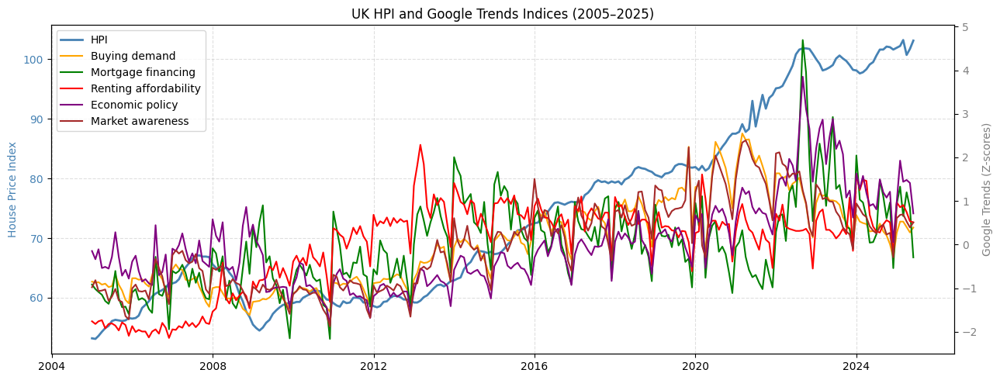

In [ ]:
# Plot of UK HPI and the 5 Google Trend indices

df_uk = df1[df1['RegionName'] == 'United Kingdom'].sort_index()

fig, ax1 = plt.subplots(figsize=(13,5))

# HPI on left axis
ax1.plot(df_uk.index, df_uk['HPI'], color='steelblue', lw=2, label='HPI')
ax1.set_ylabel("House Price Index", color='steelblue')
ax1.tick_params(axis='y', labelcolor='steelblue')

# Standardised Google Trends indices on right axis
ax2 = ax1.twinx()
ax2.plot(df_uk.index, df_uk['GT_demand'], color='orange', lw=1.5, label='Buying demand')
ax2.plot(df_uk.index, df_uk['GT_mortgage_financing'], color='green', lw=1.5, label='Mortgage financing')
ax2.plot(df_uk.index, df_uk['GT_renting_affordability'], color='red', lw=1.5, label='Renting affordability')
ax2.plot(df_uk.index, df_uk['GT_economicpolicy'], color='purple', lw=1.5, label='Economic policy')
ax2.plot(df_uk.index, df_uk['GT_marketawareness'], color='brown', lw=1.5, label='Market awareness')

ax2.set_ylabel("Google Trends (Z-scores)", color='grey')
ax2.tick_params(axis='y', labelcolor='grey')

plt.title("UK HPI and Google Trends Indices (2005–2025)")
ax1.grid(ls='--', alpha=0.4)

# Combined legend
h1, l1 = ax1.get_legend_handles_labels()
h2, l2 = ax2.get_legend_handles_labels()
ax1.legend(h1 + h2, l1 + l2, loc='upper left')

plt.tight_layout()
plt.show()


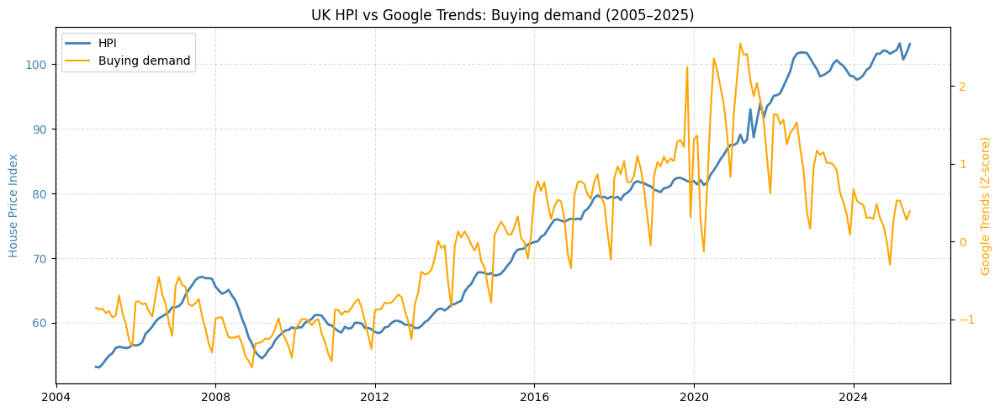

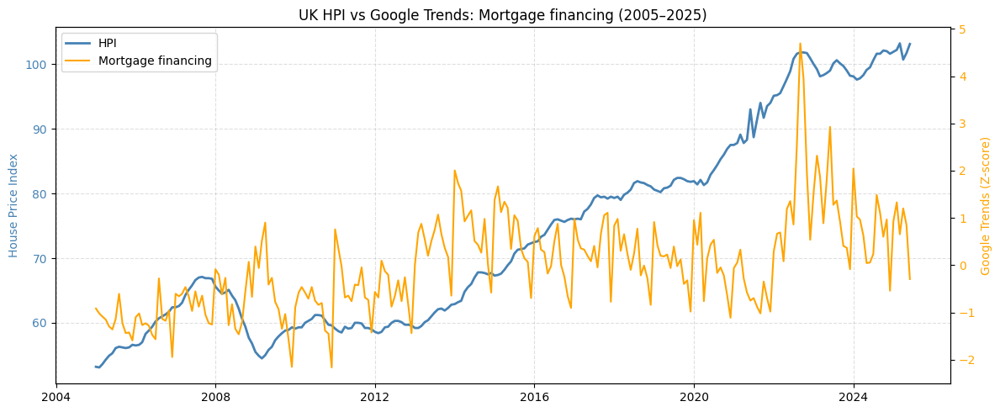

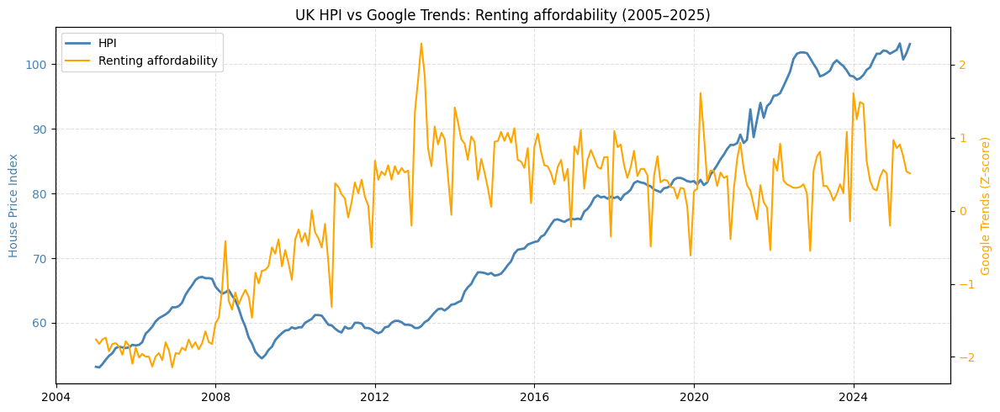

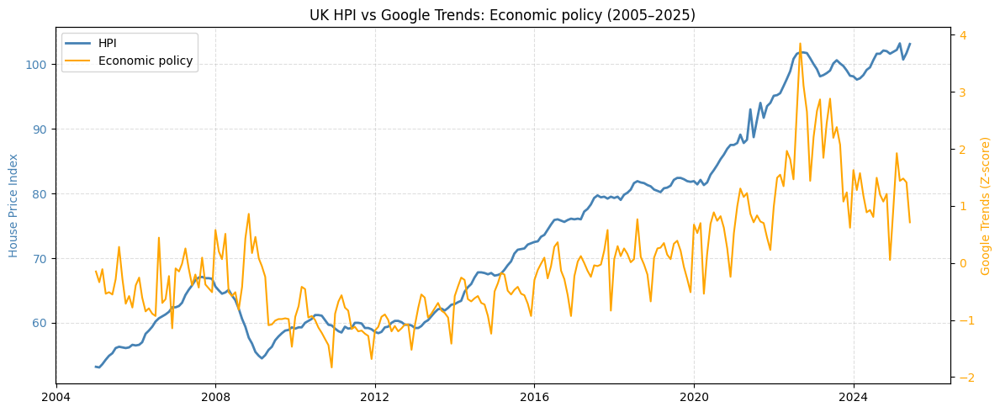

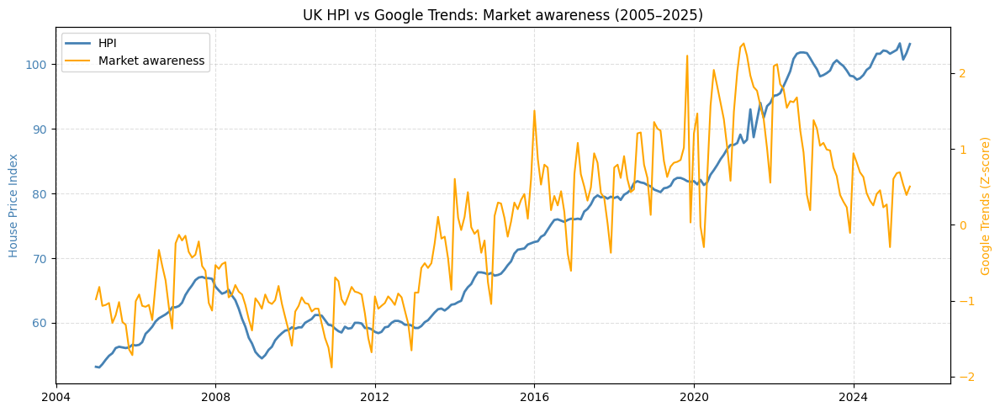

In [ ]:
# Individual plots of UK HPI and the 5 Google Trend indices

df_uk = df1[df1['RegionName'] == 'United Kingdom'].sort_index()

gt_vars = {
    'GT_demand': 'Buying demand',
    'GT_mortgage_financing': 'Mortgage financing',
    'GT_renting_affordability': 'Renting affordability',
    'GT_economicpolicy': 'Economic policy',
    'GT_marketawareness': 'Market awareness'
}

for col, title in gt_vars.items():
    fig, ax1 = plt.subplots(figsize=(12,5))

    # HPI on left axis
    ax1.plot(df_uk.index, df_uk['HPI'], color='steelblue', lw=2, label='HPI')
    ax1.set_ylabel("House Price Index", color='steelblue')
    ax1.tick_params(axis='y', labelcolor='steelblue')

    # Google Trends indices on right axis
    ax2 = ax1.twinx()
    ax2.plot(df_uk.index, df_uk[col], color='orange', lw=1.5, label=title)
    ax2.set_ylabel("Google Trends (Z-score)", color='orange')
    ax2.tick_params(axis='y', labelcolor='orange')

    plt.title(f"UK HPI vs Google Trends: {title} (2005–2025)")
    ax1.grid(ls='--', alpha=0.4)

    # combined legend
    h1, l1 = ax1.get_legend_handles_labels()
    h2, l2 = ax2.get_legend_handles_labels()
    ax1.legend(h1 + h2, l1 + l2, loc='upper left')

    plt.tight_layout()
    plt.show()

HPI vs Macroeconomic indicators

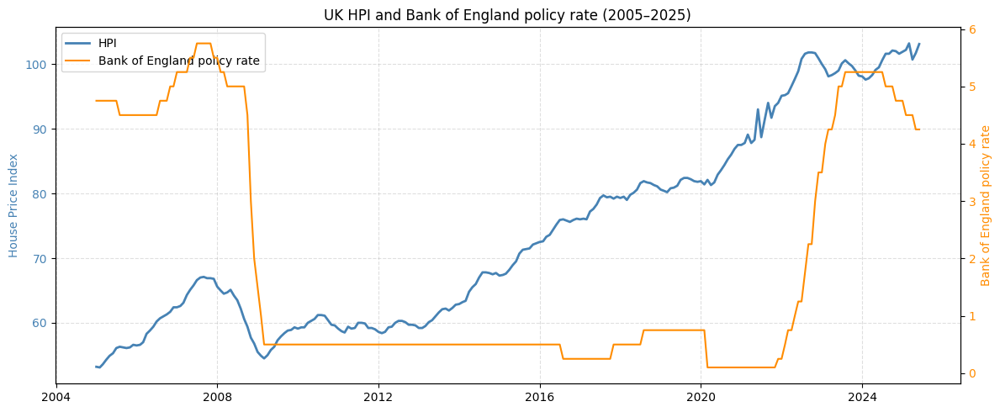

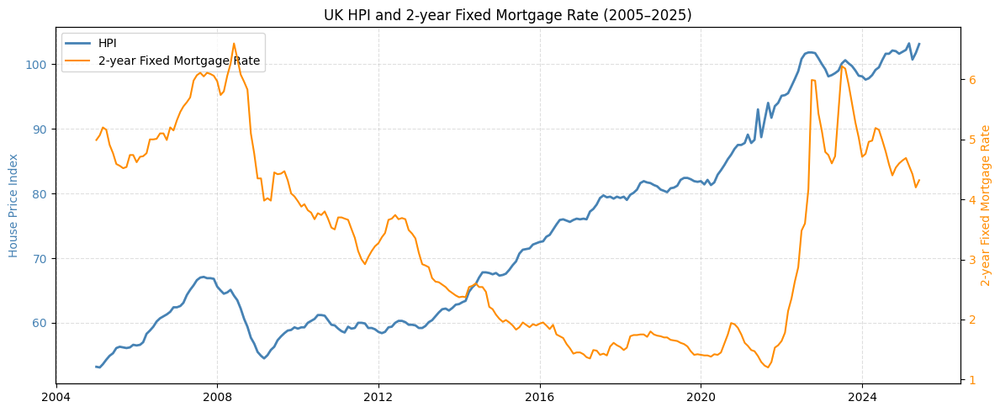

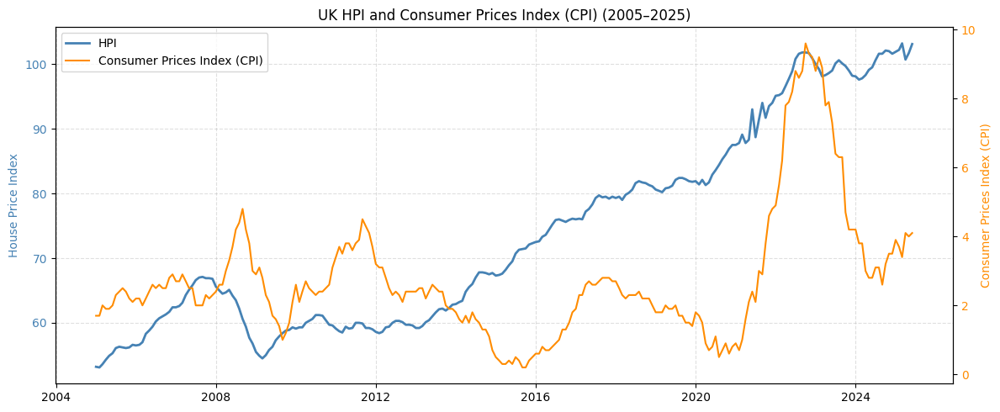

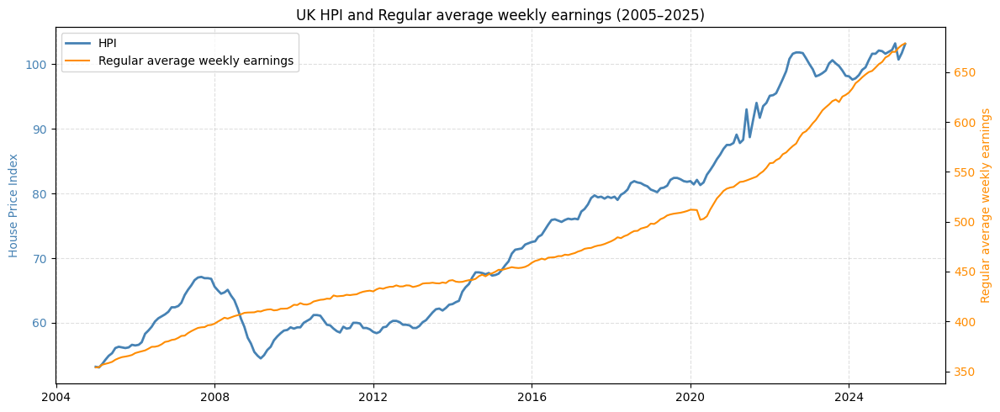

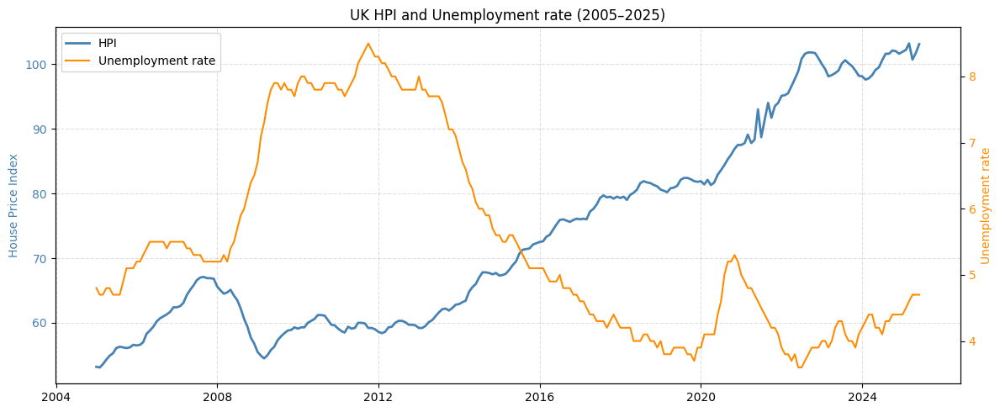

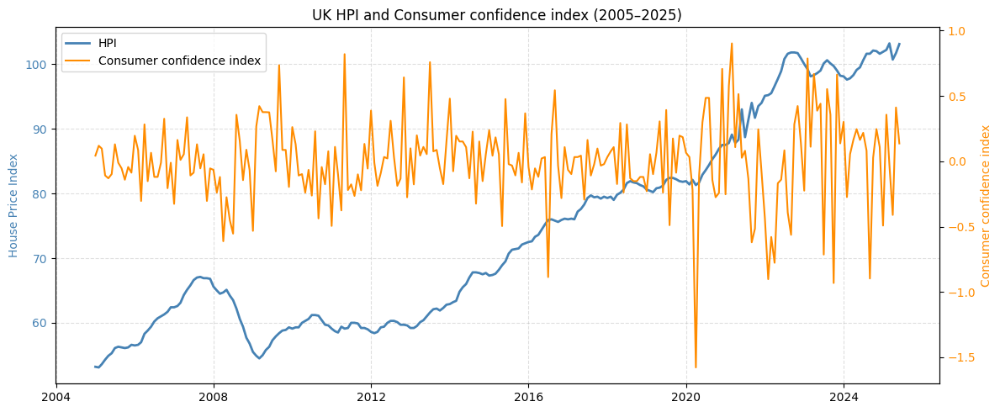

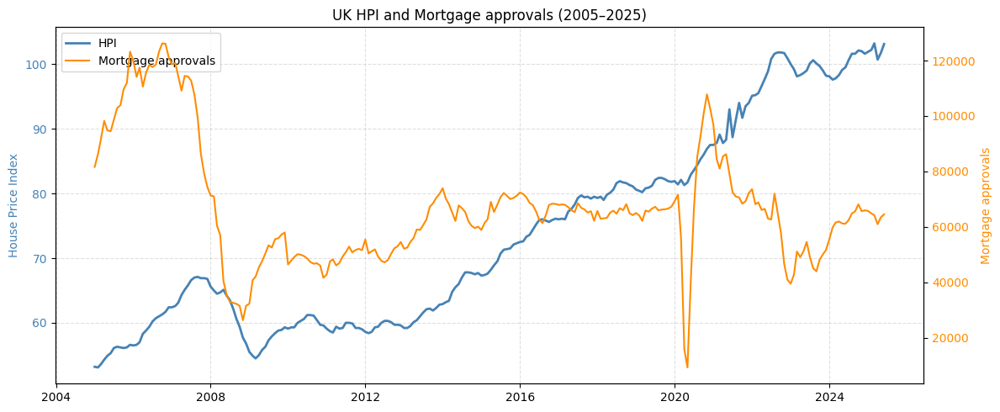

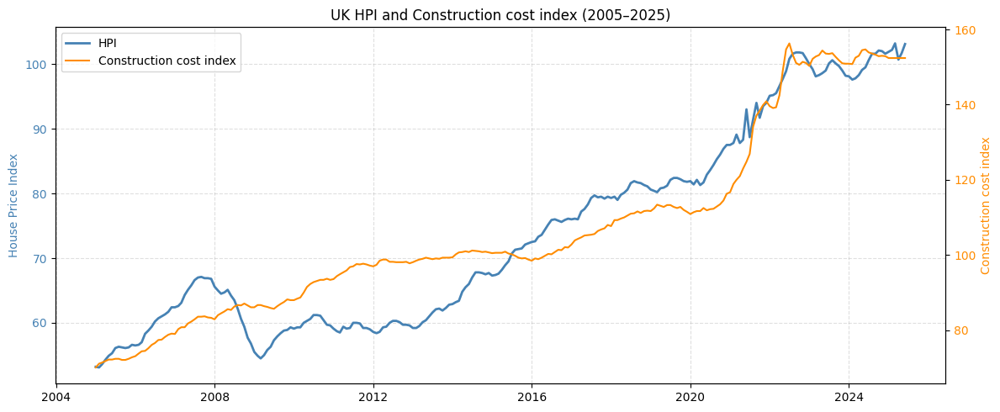

In [ ]:
# Plot of UK HPI vs Macroeconomic Variables

df_uk = df1[df1['RegionName'] == 'United Kingdom'].sort_index()

macro_vars = {
    'BankRate': 'Bank of England policy rate',
    'MortgageRate': '2-year Fixed Mortgage Rate',
    'CPI': 'Consumer Prices Index (CPI)',
    'AW_Regular_Earnings': 'Regular average weekly earnings',
    'UnemploymentRate': 'Unemployment rate',
    'ConsumerConfidence': 'Consumer confidence index',
    'MortgageApprovals': 'Mortgage approvals',
    'ConstructionCost_Index': 'Construction cost index'
}

for col, title in macro_vars.items():
    fig, ax1 = plt.subplots(figsize=(12, 5))

    # HPI on the left axis
    ax1.plot(df_uk.index, df_uk['HPI'], color='steelblue', lw=2, label='HPI')
    ax1.set_ylabel("House Price Index", color='steelblue')
    ax1.tick_params(axis='y', labelcolor='steelblue')

    # Macro variable on the right axis
    ax2 = ax1.twinx()
    ax2.plot(df_uk.index, df_uk[col], color='darkorange', lw=1.5, label=title)
    ax2.set_ylabel(title, color='darkorange')
    ax2.tick_params(axis='y', labelcolor='darkorange')

    plt.title(f"UK HPI and {title} (2005–2025)")
    ax1.grid(ls='--', alpha=0.4)

    # Combined legend
    h1, l1 = ax1.get_legend_handles_labels()
    h2, l2 = ax2.get_legend_handles_labels()
    ax1.legend(h1 + h2, l1 + l2, loc='upper left')

    plt.tight_layout()
    plt.show()


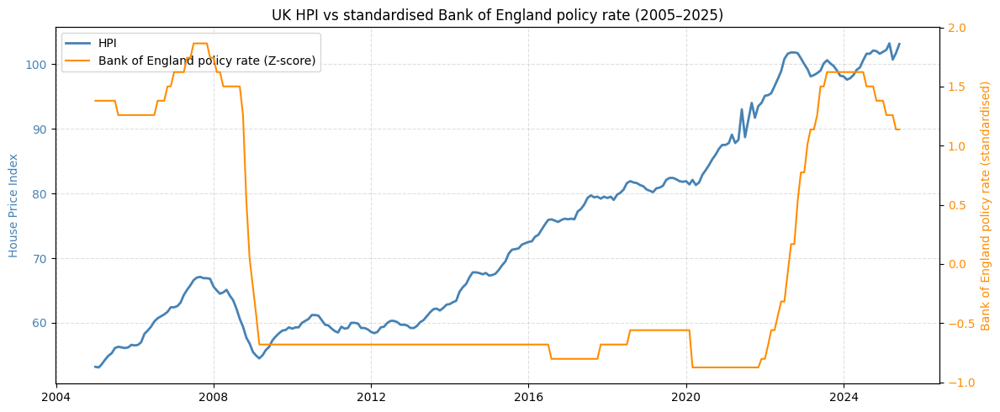

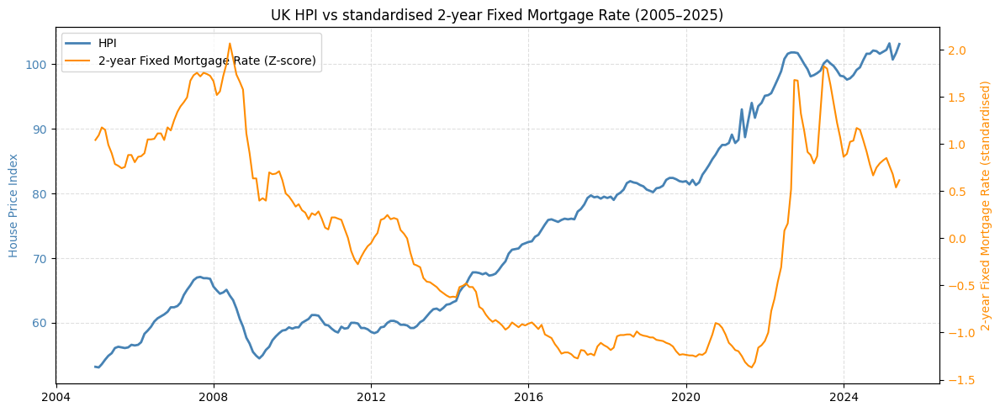

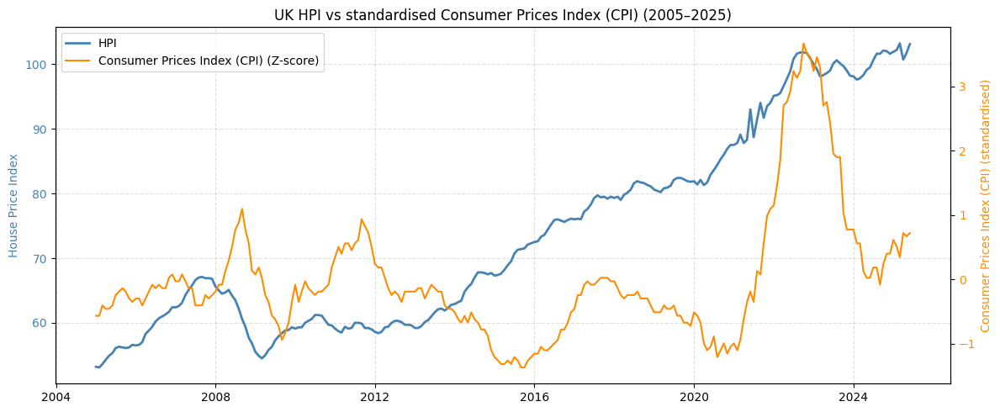

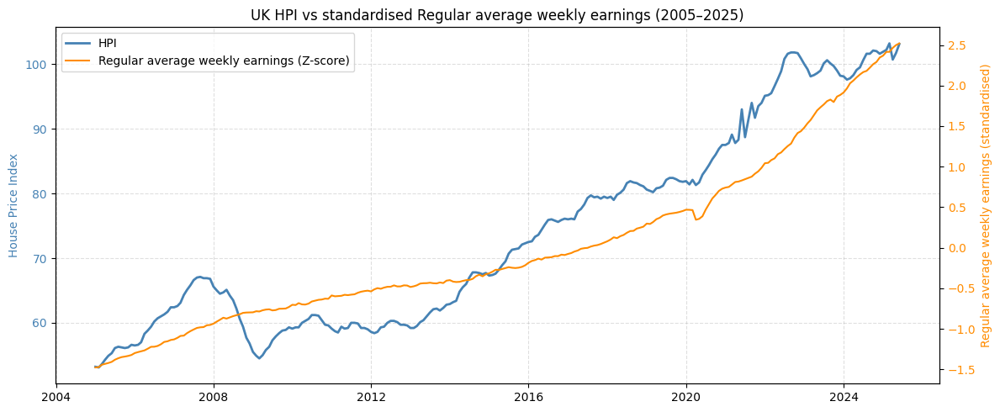

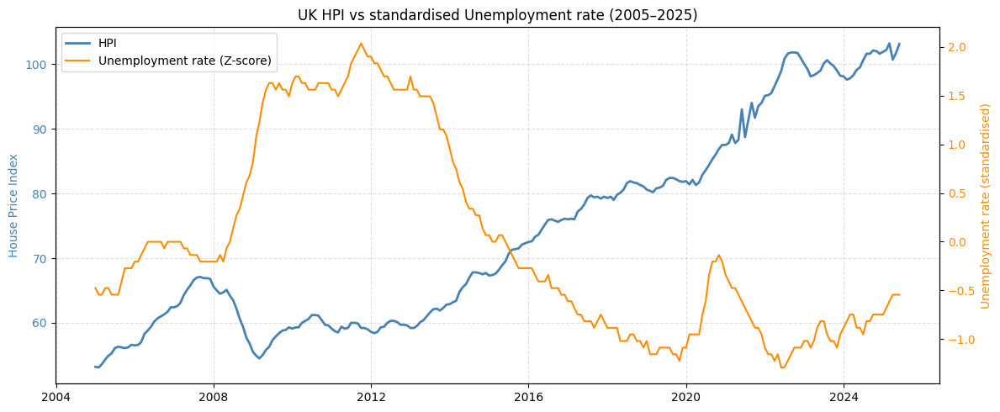

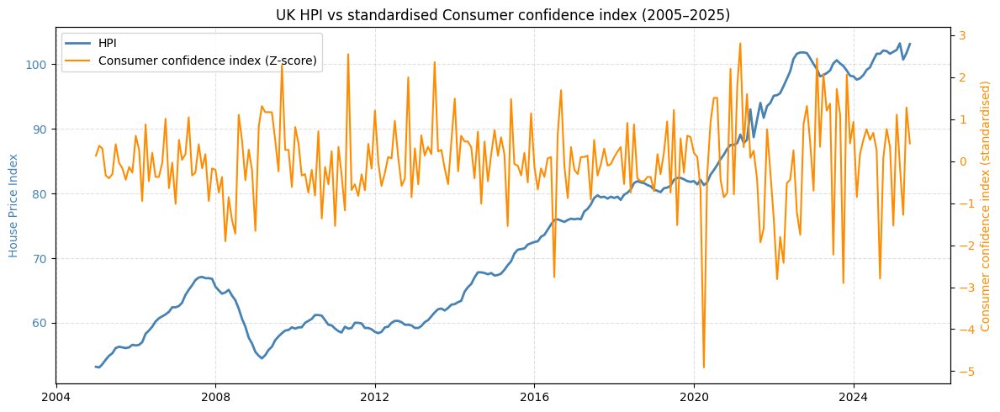

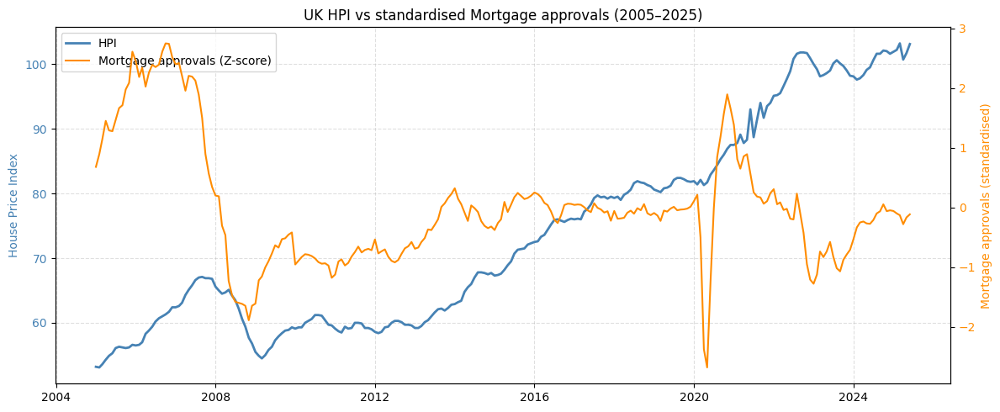

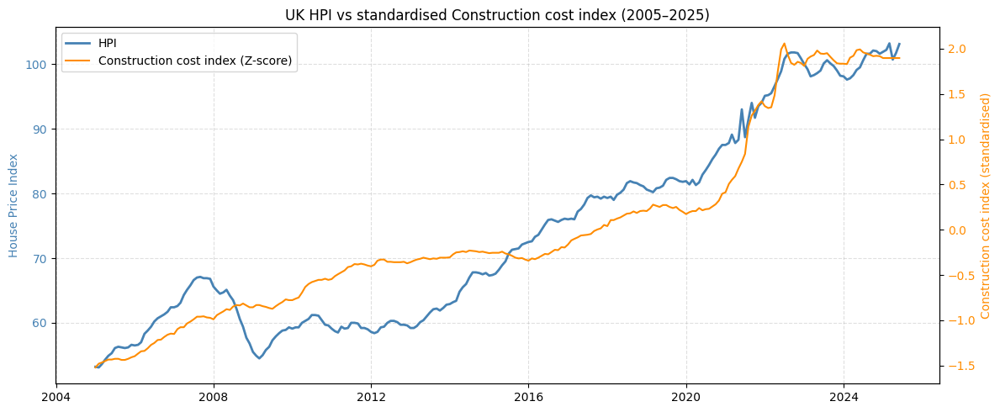

In [ ]:
# Plot of UK HPI vs Standardised Macro Variables
df_uk = df1_scaled[df1_scaled['RegionName'] == 'United Kingdom'].sort_index()

for col, title in macro_vars.items():
    fig, ax1 = plt.subplots(figsize=(12,5))

    # HPI (left axis)
    ax1.plot(df_uk.index, df_uk['HPI'], color='steelblue', lw=2, label='HPI')
    ax1.set_ylabel("House Price Index", color='steelblue')
    ax1.tick_params(axis='y', labelcolor='steelblue')

    # Standardised macro variable (right axis)
    ax2 = ax1.twinx()
    ax2.plot(df_uk.index, df_uk[col], color='darkorange', lw=1.5, label=f"{title} (Z-score)")
    ax2.set_ylabel(f"{title} (standardised)", color='darkorange')
    ax2.tick_params(axis='y', labelcolor='darkorange')

    plt.title(f"UK HPI vs standardised {title} (2005–2025)")
    ax1.grid(True, ls='--', alpha=0.4)

    # Combined legend
    h1, l1 = ax1.get_legend_handles_labels()
    h2, l2 = ax2.get_legend_handles_labels()
    ax1.legend(h1 + h2, l1 + l2, loc='upper left')

    plt.tight_layout()
    plt.show()


In [ ]:
# Inspecting the structure of the dataset
print("Shape:", df1.shape)
print("\nColumns:\n", df1.columns.tolist())
print("\nData types:\n", df1.dtypes)


Shape: (99630, 22)

Columns:
 ['RegionName', 'AreaCode', 'AveragePrice', 'HPI', 'SalesVolume', 'AW_Regular_Earnings', 'UnemploymentRate', 'CPI', 'MortgageApprovals', 'MortgageRate', 'BankRate', 'ConsumerConfidence', 'ConstructionCost_Index', 'GT_demand', 'GT_economicpolicy', 'GT_marketawareness', 'GT_mortgage_financing', 'GT_renting_affordability', 'GDELT_average_news_tone', 'Source', 'GDELT_Version', 'GDELT_average_news_tone_normalized']

Data types:
 RegionName                             object
AreaCode                               object
AveragePrice                            int64
HPI                                   float64
SalesVolume                             int64
AW_Regular_Earnings                   float64
UnemploymentRate                      float64
CPI                                   float64
MortgageApprovals                       int64
MortgageRate                          float64
BankRate                              float64
ConsumerConfidence                   

Correlation Analysis

Before proceeding to modelling, I will conduct correlation analysis to understand which variables share strong co-movements with UK HPI.

UK dataset shape: (246, 22)
Date range: 2005-01-01 00:00:00 → 2025-06-01 00:00:00


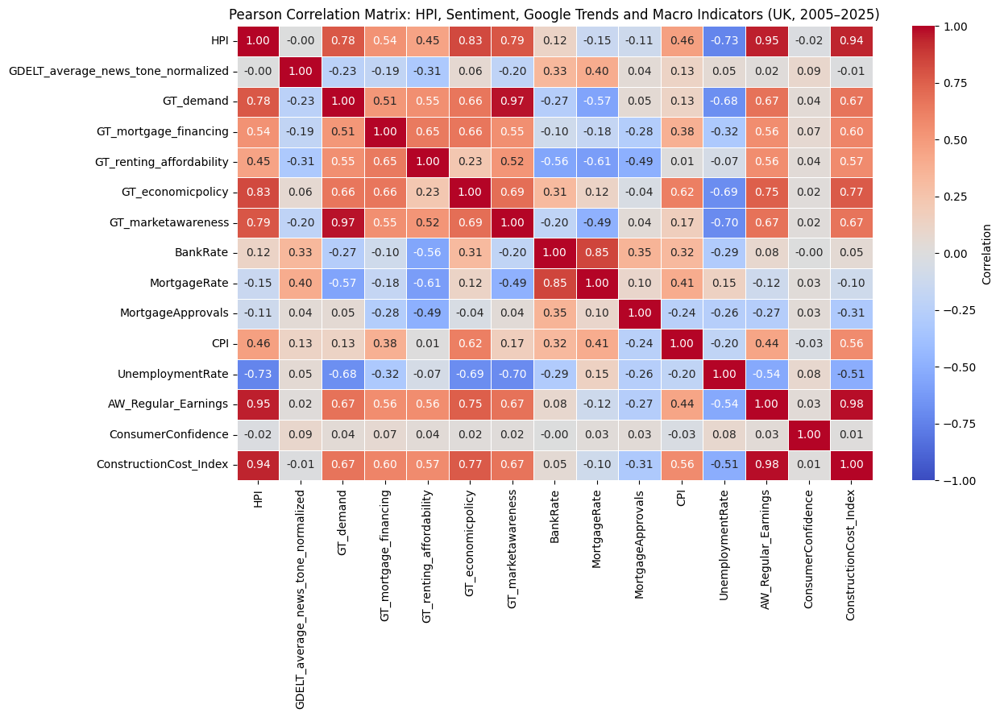


Correlations with HPI:
 HPI                                   1.000000
AW_Regular_Earnings                   0.950674
ConstructionCost_Index                0.941994
GT_economicpolicy                     0.829620
GT_marketawareness                    0.786238
GT_demand                             0.776145
GT_mortgage_financing                 0.536849
CPI                                   0.463033
GT_renting_affordability              0.449903
BankRate                              0.121341
GDELT_average_news_tone_normalized   -0.001833
ConsumerConfidence                   -0.016811
MortgageApprovals                    -0.112018
MortgageRate                         -0.147202
UnemploymentRate                     -0.732781
Name: HPI, dtype: float64


In [ ]:
# Pearson Correlation Analysis between UK HPI and all other variables
uk_df = df1[df1['RegionName'] == 'United Kingdom'].sort_index()

print("UK dataset shape:", uk_df.shape)
print("Date range:", uk_df.index.min(), "→", uk_df.index.max())

# Variables
corr_vars = [
    'HPI',
    'GDELT_average_news_tone_normalized',
    'GT_demand',
    'GT_mortgage_financing',
    'GT_renting_affordability',
    'GT_economicpolicy',
    'GT_marketawareness',
    'BankRate',
    'MortgageRate',
    'MortgageApprovals',
    'CPI',
    'UnemploymentRate',
    'AW_Regular_Earnings',
    'ConsumerConfidence',
    'ConstructionCost_Index'
]

# Pearson correlation to see which variables move together
corr_matrix = uk_df[corr_vars].corr()

# Heatmap for visualising the correlations
plt.figure(figsize=(13, 9))
sns.heatmap(
    corr_matrix,
    annot=True,
    cmap='coolwarm',
    vmin=-1, vmax=1,
    fmt=".2f",
    linewidths=0.4,
    cbar_kws={'label': 'Correlation'}
)
plt.title("Pearson Correlation Matrix: HPI, Sentiment, Google Trends and Macro Indicators (UK, 2005–2025)")
plt.tight_layout()
plt.show()

# Variables that correlate most strongly with HPI
corr_with_hpi = corr_matrix['HPI'].sort_values(ascending=False)
print("\nCorrelations with HPI:\n", corr_with_hpi)

I will also look at Spearman's correlation. This is because while Pearson's Correlation captures linear relationships between variables, Spearman also accounts for non-linear relationships.

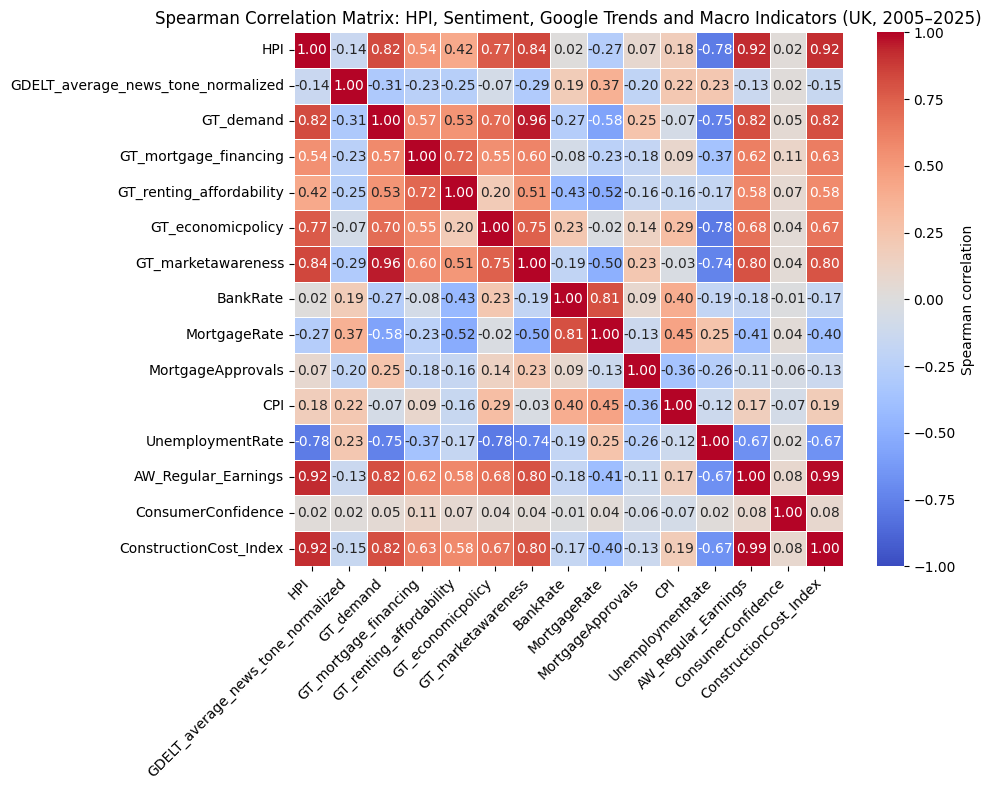


Top 10 strongly ranked-correlated variables with HPI (Spearman):

AW_Regular_Earnings         0.923327
ConstructionCost_Index      0.916079
GT_marketawareness          0.840176
GT_demand                   0.820356
UnemploymentRate            0.778738
GT_economicpolicy           0.769824
GT_mortgage_financing       0.540353
GT_renting_affordability    0.420979
MortgageRate                0.269129
CPI                         0.179464
Name: HPI, dtype: float64


In [ ]:
# Spearman's Correlation
uk_df = df1[df1['RegionName'] == 'United Kingdom'].copy()

# Variables
corr_vars = [
    'HPI',
    'GDELT_average_news_tone_normalized',
    'GT_demand', 'GT_mortgage_financing', 'GT_renting_affordability',
    'GT_economicpolicy', 'GT_marketawareness',
    'BankRate', 'MortgageRate', 'MortgageApprovals',
    'CPI', 'UnemploymentRate','AW_Regular_Earnings',
    'ConsumerConfidence', 'ConstructionCost_Index'
]

# Spearman correlations
spearman_corr = uk_df[corr_vars].corr(method='spearman')

# Heatmap for visualising Spearman's correlation
plt.figure(figsize=(10, 8))
sns.heatmap(
    spearman_corr,
    annot=True,
    cmap='coolwarm',
    vmin=-1, vmax=1,
    fmt=".2f",
    linewidths=0.4,
    cbar_kws={'label': 'Spearman correlation'}
)
plt.title("Spearman Correlation Matrix: HPI, Sentiment, Google Trends and Macro Indicators (UK, 2005–2025)")
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Variables with strongest correlation with HPI
top_corr = (
    spearman_corr['HPI']
    .drop('HPI')
    .abs()
    .sort_values(ascending=False)
    .head(10)
)

print("\nTop 10 strongly ranked-correlated variables with HPI (Spearman):\n")
print(top_corr)


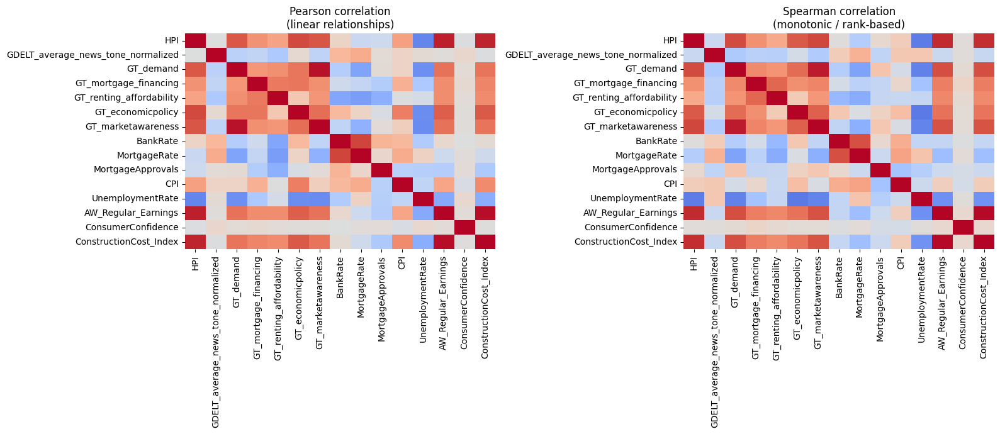

In [ ]:
# Comparison between Pearson VS Spearman Correlation

uk_df = df1[df1['RegionName'] == 'United Kingdom'].sort_index().copy()

# Variables
corr_vars = [
    'HPI',
    'GDELT_average_news_tone_normalized',
    'GT_demand', 'GT_mortgage_financing', 'GT_renting_affordability',
    'GT_economicpolicy', 'GT_marketawareness',
    'BankRate', 'MortgageRate', 'MortgageApprovals',
    'CPI', 'UnemploymentRate','AW_Regular_Earnings',
    'ConsumerConfidence', 'ConstructionCost_Index'
]

# Pearson and Spearman Correlation
pearson_corr  = uk_df[corr_vars].corr(method='pearson')
spearman_corr = uk_df[corr_vars].corr(method='spearman')

# Plot of both heatmaps
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

sns.heatmap(pearson_corr, cmap='coolwarm', vmin=-1, vmax=1,
            ax=axes[0], cbar=False)
axes[0].set_title("Pearson correlation\n(linear relationships)")

sns.heatmap(spearman_corr, cmap='coolwarm', vmin=-1, vmax=1,
            ax=axes[1], cbar=False)
axes[1].set_title("Spearman correlation\n(monotonic / rank-based)")

plt.tight_layout()
plt.show()



I will now conduct Cross Correlation Analysis to further analyse the potential leading or lagging effects of the predictors on HPI. This will give an idea about which predictors can offer early signals relevant for nowcasting HPI.

Cross-Correlation Analysis

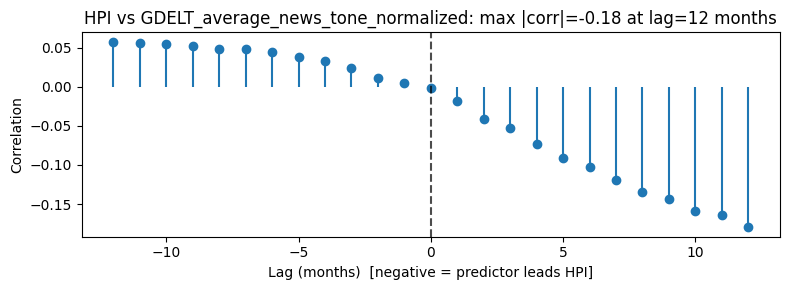

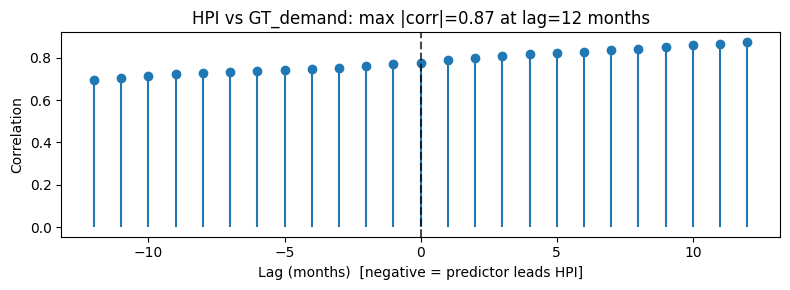

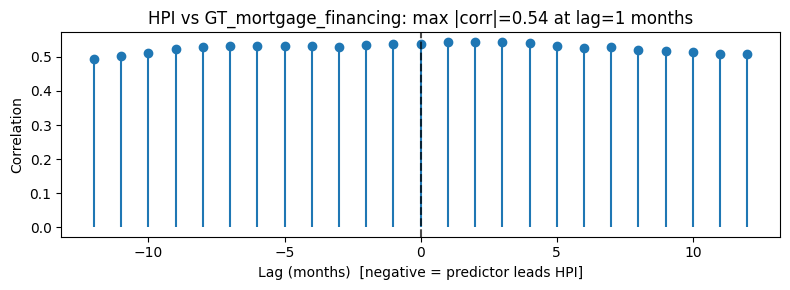

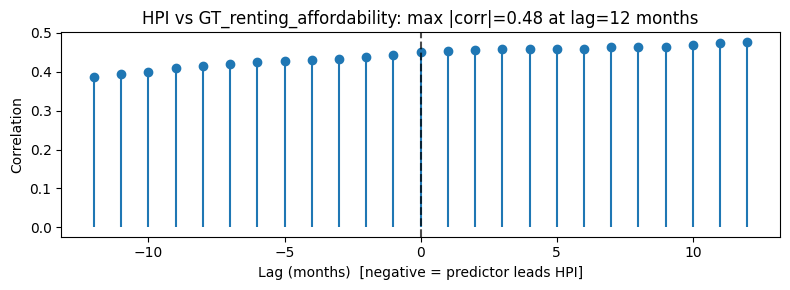

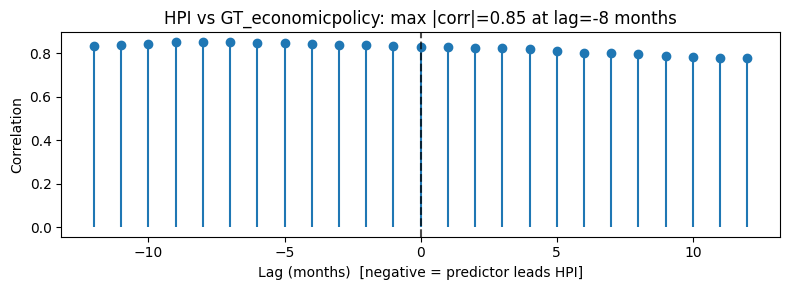

...

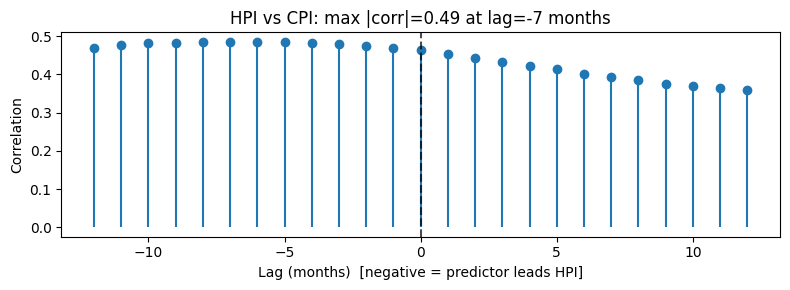

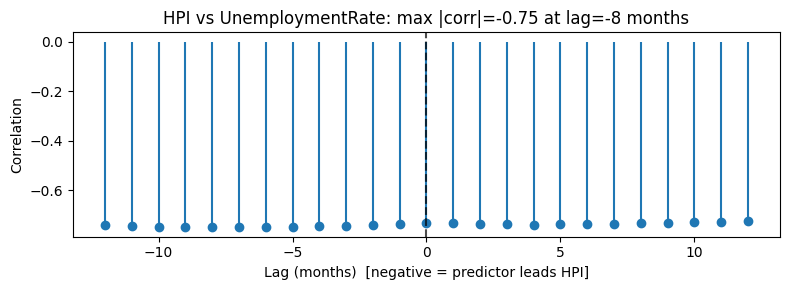

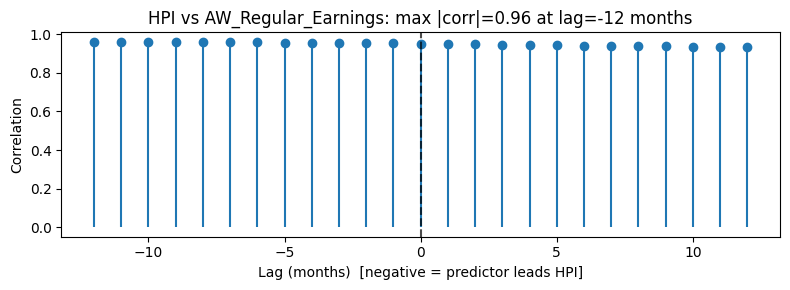

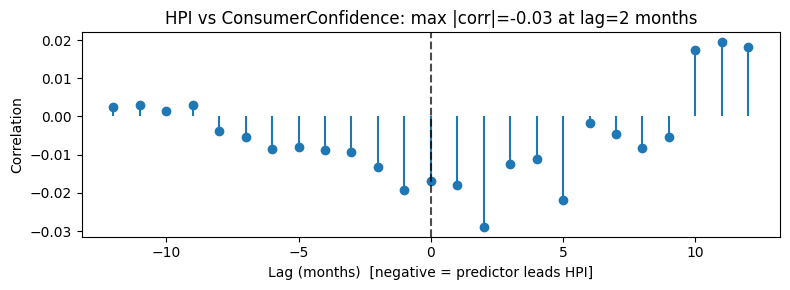

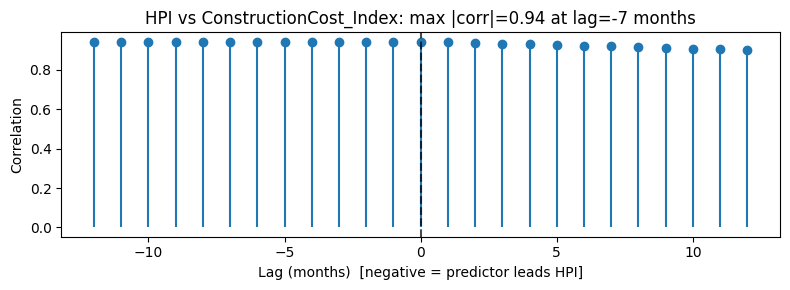


Cross-correlation summary (HPI vs predictors):

                              Variable  BestLagMonths  Correlation  \
11                 AW_Regular_Earnings            -12     0.960941   
13              ConstructionCost_Index             -7     0.943862   
1                            GT_demand             12     0.874887   
4                    GT_economicpolicy             -8     0.854031   
5                   GT_marketawareness             12     0.852315   
10                    UnemploymentRate             -8    -0.751188   
2                GT_mortgage_financing              1     0.544579   
9                                  CPI             -7     0.485766   
3             GT_renting_affordability             12     0.477017   
7                         MortgageRate             12    -0.359789   
6                             BankRate            -12     0.247013   
0   GDELT_average_news_tone_normalized             12    -0.179850   
8                    MortgageApprovals   

In [ ]:
# Cross Correlation Analysis between UK HPI and its potential predictors

uk_df = df1[df1['RegionName'] == 'United Kingdom'].copy().sort_index()

# Variables
vars_ccf = [
    'GDELT_average_news_tone_normalized',
    'GT_demand', 'GT_mortgage_financing', 'GT_renting_affordability',
    'GT_economicpolicy', 'GT_marketawareness',
    'BankRate', 'MortgageRate', 'MortgageApprovals',
    'CPI', 'UnemploymentRate','AW_Regular_Earnings',
    'ConsumerConfidence', 'ConstructionCost_Index'
]

# Standardising the HPI and predictors to ensure that they are on the same scale
Z = (uk_df[vars_ccf + ['HPI']] - uk_df[vars_ccf + ['HPI']].mean()) / uk_df[vars_ccf + ['HPI']].std()

max_lag = 12
results = []

def ccf_by_shift(y, x, max_lag=12):
    lags = list(range(-max_lag, max_lag + 1))
    corrs = [y.corr(x.shift(l)) for l in lags]
    return lags, corrs

for var in vars_ccf:
    # Alignment of the HPI and predictor series on common dates
    y = Z['HPI']
    x = Z[var]
    XY = pd.concat([y, x], axis=1).dropna()
    y, x = XY['HPI'], XY[var]

    lags, corrs = ccf_by_shift(y, x, max_lag)
    s = pd.Series(corrs, index=lags)
    best_lag = int(s.abs().idxmax())
    best_corr = float(s.loc[best_lag])

    results.append({
        "Variable": var,
        "BestLagMonths": best_lag,
        "Correlation": best_corr,
        "Interpretation": (
            f"leads HPI by {-best_lag} months" if best_lag < 0 else
            f"lags HPI by {best_lag} months" if best_lag > 0 else
            "co-moves contemporaneously (0 months)"
        )
    })

    # Plotting the cross-correlation between HPI and each predictor
    plt.figure(figsize=(8, 3))
    plt.stem(lags, corrs, basefmt=" ", markerfmt="o", linefmt="C0-")
    plt.axvline(0, color='k', linestyle='--', alpha=0.7)
    plt.title(f"HPI vs {var}: max |corr|={best_corr:.2f} at lag={best_lag} months")
    plt.xlabel("Lag (months)  [negative = predictor leads HPI]")
    plt.ylabel("Correlation")
    plt.tight_layout()
    plt.show()

lag_summary = (
    pd.DataFrame(results)
    .sort_values("Correlation", key=lambda s: s.abs(), ascending=False)
)

print("\nCross-correlation summary (HPI vs predictors):\n")
print(lag_summary)

Next, I will look at Mutual Information Analysis to understand whether HPI and the predictors have non-linear relationships which simple correlation measures like Pearson fails to account for. This will give an indication of whether ml models can capture additional structure besdies linear relationships.

In [ ]:
#Testing for non-linear relationships between UK HPI and predictors using Mutual Information Analysis
from sklearn.feature_selection import mutual_info_regression

# Predictors
predictors = [
    'GDELT_average_news_tone_normalized', 'GT_demand', 'GT_mortgage_financing',
    'GT_renting_affordability', 'GT_economicpolicy', 'GT_marketawareness',
    'BankRate', 'MortgageRate', 'MortgageApprovals', 'CPI', 'UnemploymentRate',
    'AW_Regular_Earnings',
    'ConsumerConfidence', 'ConstructionCost_Index'
]

X = uk_df[predictors].copy()
y = uk_df['HPI']

# Ensure complete cases
XY = pd.concat([X, y], axis=1).dropna()
X, y = XY[predictors], XY['HPI']

# Computing Mutual Information
mi_scores = mutual_info_regression(X, y, random_state=42)

mi_df = (
    pd.DataFrame({'Variable': predictors, 'MutualInformation': mi_scores})
      .sort_values('MutualInformation', ascending=False)
      .reset_index(drop=True)
)

print("\nMutual Information Scores (Higher = stronger non-linear dependence):\n")
print(mi_df)


Mutual Information Scores (Higher = stronger non-linear dependence):

                              Variable  MutualInformation
0                  AW_Regular_Earnings           2.437029
1               ConstructionCost_Index           2.111156
2                         MortgageRate           1.454465
3                     UnemploymentRate           1.371063
4                             BankRate           1.134188
5                            GT_demand           0.966912
6                    MortgageApprovals           0.828979
7                   GT_marketawareness           0.800769
8                                  CPI           0.794500
9                    GT_economicpolicy           0.767155
10            GT_renting_affordability           0.475956
11  GDELT_average_news_tone_normalized           0.426450
12               GT_mortgage_financing           0.259390
13                  ConsumerConfidence           0.066784


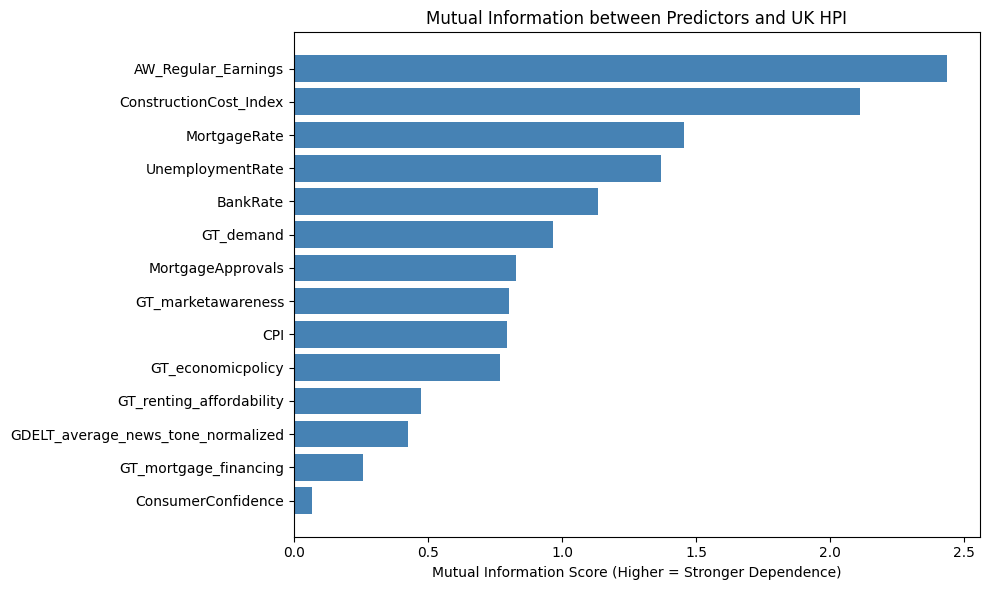

In [ ]:
#Plotting the Mutual Information between UK HPI and Predictors
plt.figure(figsize=(10,6))
mi_sorted = mi_df.sort_values('MutualInformation')

plt.barh(mi_sorted['Variable'], mi_sorted['MutualInformation'], color='steelblue')
plt.title("Mutual Information between Predictors and UK HPI")
plt.xlabel("Mutual Information Score (Higher = Stronger Dependence)")
plt.tight_layout()
plt.show()


Before proceeding to modelling, it needs to be ensured that the target variable: UK HPI and its predictors are stationary. As a result, I will now conduct the Augmented Dickey-Fuller Test for stationarity.Time Series models like ARIMA, VAR require variables to be stable.

Augmented Dickey-Fuller Test

In [ ]:
# ADF Test for stationarity
from statsmodels.tsa.stattools import adfuller

uk_df = df1[df1['RegionName'] == 'United Kingdom'].copy()
numeric_cols = uk_df.select_dtypes(include='number').columns

adf_results = []

for col in numeric_cols:
    series = uk_df[col].dropna()
    stat, pval, *_ = adfuller(series, autolag='AIC')

    adf_results.append({
        "Variable": col,
        "ADF Statistic": stat,
        "p-value": pval,
        "Stationary?": "Yes" if pval < 0.05 else "No"
    })

adf_df = pd.DataFrame(adf_results)
print(adf_df)


                              Variable  ADF Statistic       p-value  \
0                         AveragePrice       0.817257  9.919097e-01   
1                                  HPI       0.804482  9.917082e-01   
2                          SalesVolume      -2.801003  5.813070e-02   
3                  AW_Regular_Earnings       2.202612  9.988846e-01   
4                     UnemploymentRate      -1.198345  6.743073e-01   
5                                  CPI      -2.341234  1.590137e-01   
6                    MortgageApprovals      -2.727947  6.932577e-02   
7                         MortgageRate      -1.651732  4.561375e-01   
8                             BankRate      -2.070724  2.564482e-01   
9                   ConsumerConfidence      -6.579054  7.595210e-09   
10              ConstructionCost_Index      -0.267655  9.299620e-01   
11                           GT_demand      -1.157474  6.916169e-01   
12                   GT_economicpolicy      -1.104979  7.130821e-01   
13    

It can be seen that only two variables: Consumer Confidence Index and GDELT average tone normalised are stationary. All other variables are non-stationary. As a result, before proceeding to modelling I will apply transformations to the non-stationary variables.  

In [ ]:
# Applying transformations to non-stationary variables to ensure stationarity
from statsmodels.tsa.stattools import adfuller

uk_df = df1[df1['RegionName'] == 'United Kingdom'].copy().sort_index()

# Variables to test and transform
vars_to_test = [
    'HPI', 'AveragePrice', 'SalesVolume',
    'AW_Regular_Earnings',
    'UnemploymentRate', 'CPI', 'MortgageApprovals',
    'MortgageRate', 'BankRate',
    'ConsumerConfidence', 'ConstructionCost_Index',
    'GT_demand', 'GT_economicpolicy', 'GT_marketawareness',
    'GT_mortgage_financing', 'GT_renting_affordability',
    'GDELT_average_news_tone_normalized'
]

def adf_pvalue(series, autolag="AIC"):
    """Run a simple ADF test and return the p-value (or NaN if too short)."""
    s = series.dropna()
    if len(s) < 24:
        return np.nan
    stat, pval, *_ = adfuller(s, autolag=autolag, regression="c")
    return pval

def choose_transform(s: pd.Series, seasonal_lag: int = 12):
    """
    Try, in this order:
      1. level
      2. log-diff (if strictly positive)
      3. first difference
      4. add seasonal diff on top of the chosen diff/logdiff
    Return: transformed_series, label, p_final, dict of all attempted p-values.
    """
    attempts = {}

    # 1) Level
    p_level = adf_pvalue(s)
    attempts["level"] = p_level
    if p_level < 0.05:
        return s, "level", p_level, attempts

    # Base transformation: log-diff if possible, otherwise first difference
    if (s > 0).all():
        base = np.log(s).diff()
        base_label = "logdiff"
    else:
        base = s.diff()
        base_label = "diff"

    p_base = adf_pvalue(base)
    attempts[base_label] = p_base
    if p_base < 0.05:
        return base, base_label, p_base, attempts

    # 3) Seasonal diff on top of base, if we have enough data
    if seasonal_lag is not None and len(base.dropna()) > seasonal_lag + 12:
        seas = base - base.shift(seasonal_lag)
        p_seas = adf_pvalue(seas)
        label_seas = base_label + "+seas"
        attempts[label_seas] = p_seas
        if p_seas < 0.05:
            return seas, label_seas, p_seas, attempts

    # 4) If nothing is stationary at 5%, pick the attempt with the lowest p-value
    #    and flag it as non-stationary.
    valid_attempts = {k: v for k, v in attempts.items() if not pd.isna(v)}
    if valid_attempts:
        best_label = min(valid_attempts, key=valid_attempts.get)
        best_p = valid_attempts[best_label]
    else:
        best_label, best_p = base_label, p_base

    # Choose the corresponding series
    if best_label == "level":
        best_series = s
    elif best_label == "logdiff":
        best_series = base  # logdiff
    elif best_label == "diff":
        best_series = base  # first diff
    else:  # seasonal version
        best_series = base - base.shift(seasonal_lag)

    return best_series, best_label + " (non-stationary, lowest p)", best_p, attempts

# Apply to all variables
transformed = {}
summary_rows = []

for v in vars_to_test:
    if v not in uk_df.columns:
        continue

    series = uk_df[v].astype(float)

    p_level = adf_pvalue(series)
    s_trans, label, p_final, attempts = choose_transform(series)

    transformed[v + "_TRANS"] = s_trans

    # Pack up a short notes string with attempted p-values
    notes_str = "; ".join(
        f"{k}: p={attempts[k]:.4g}" for k in attempts if not pd.isna(attempts[k])
    )

    summary_rows.append({
        "Variable": v,
        "ADF p (level)": p_level,
        "Chosen transform": label,
        "ADF p (final)": p_final,
        "Notes": notes_str
    })

adf_summary = pd.DataFrame(summary_rows).sort_values("ADF p (final)")
uk_stationary = pd.DataFrame(transformed, index=uk_df.index).dropna(how="all")

print("ADF-based transformation completed.")
print(f"uk_stationary shape: {uk_stationary.shape}")
display(adf_summary)


ADF-based transformation completed.
uk_stationary shape: (246, 17)


,Variable,ADF p (level),Chosen transform,ADF p (final),Notes
6,MortgageApprovals,6.932577e-02,logdiff,9.899321e-26,level: p=0.06933; logdiff: p=9.899e-26
7,MortgageRate,4.561375e-01,logdiff,4.124150e-16,level: p=0.4561; logdiff: p=4.124e-16
9,ConsumerConfidence,7.595210e-09,level,7.595210e-09,level: p=7.595e-09
8,BankRate,2.564482e-01,logdiff,1.268783e-08,level: p=0.2564; logdiff: p=1.269e-08
3,AW_Regular_Earnings,9.988846e-01,logdiff+seas,1.266369e-07,level: p=0.9989; logdiff: p=0.5377; logdiff+se...
10,ConstructionCost_Index,9.299620e-01,logdiff+seas,8.641087e-06,level: p=0.93; logdiff: p=0.0679; logdiff+seas...
14,GT_mortgage_financing,1.057937e-01,diff,1.985321e-05,level: p=0.1058; diff: p=1.985e-05
12,GT_economicpolicy,7.130821e-01,diff,5.835888e-05,level: p=0.7131; diff: p=5.836e-05
11,GT_demand,6.916169e-01,diff,1.059364e-04,level: p=0.6916; diff: p=0.0001059
1,AveragePrice,9.919097e-01,logdiff,1.061852e-04,level: p=0.9919; logdiff: p=0.0001062


In [ ]:
uk_stationary

,HPI_TRANS,AveragePrice_TRANS,SalesVolume_TRANS,AW_Regular_Earnings_TRANS,UnemploymentRate_TRANS,CPI_TRANS,MortgageApprovals_TRANS,MortgageRate_TRANS,BankRate_TRANS,ConsumerConfidence_TRANS,ConstructionCost_Index_TRANS,GT_demand_TRANS,GT_economicpolicy_TRANS,GT_marketawareness_TRANS,GT_mortgage_financing_TRANS,GT_renting_affordability_TRANS,GDELT_average_news_tone_normalized_TRANS
Date,,,,,,,,,,,,,,,,,
2005-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.043352,NaN,NaN,NaN,NaN,NaN,NaN,0.409326
2005-02-01,-0.001881,-0.000959,0.020909,NaN,-0.021053,0.000000,0.054822,0.015905,0.000000,0.119166,NaN,-0.022597,-0.188509,0.162320,-0.103906,-0.061714,0.554828
2005-03-01,0.009372,0.008168,0.190064,NaN,0.000000,0.162519,0.060988,0.025318,0.000000,0.097383,NaN,0.011299,0.228904,-0.249723,-0.064941,0.061714,0.734498
2005-04-01,0.012975,0.014124,0.178507,NaN,0.021053,-0.051293,0.069111,-0.007722,0.000000,-0.108099,NaN,-0.056493,-0.430877,0.012486,-0.064941,0.024685,0.779997
2005-05-01,0.010989,0.010680,0.006165,NaN,0.000000,0.000000,-0.035660,-0.049663,0.000000,-0.129858,NaN,0.022597,0.026930,0.024972,-0.142870,-0.185141,0.476162
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-02-01,0.002940,0.003035,0.055445,-0.000752,0.022473,-0.052644,-0.013546,0.008565,-0.054067,0.356758,0.000663,0.259868,0.956009,0.074917,0.402634,-0.111085,1.223950
2025-03-01,0.009737,0.009780,0.394323,-0.008128,0.021979,-0.084557,-0.009943,-0.028110,0.000000,-0.027345,-0.011210,0.000000,-0.484737,0.012486,-0.675386,0.049371,1.521238
2025-04-01,-0.024523,-0.023824,-1.071741,0.001641,0.021506,0.187212,-0.051811,-0.031183,0.000000,-0.410292,-0.003273,-0.124285,0.040395,-0.162320,0.545504,-0.160456,0.656175


Downloading the datasets for further robustness checks later

In [ ]:
# Save the stationary UK dataset for later robustness checks
from google.colab import files

# Save locally in the Colab environment
uk_stationary.to_csv("uk_stationary_dataset.csv", index=True)

# Downloading on computer
files.download("uk_stationary_dataset.csv")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Save df to a CSV file
df1.to_csv("df1_full_dataset.csv", index=True)

# Download the file
files.download("df1_full_dataset.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Save df to a CSV file
df.to_csv("df_full_dataset.csv", index=True)

# Download the file
files.download("df_full_dataset.csv")

# Feature engineering

Before proceeding to modelling, I will now feature engineer lags of each of the variables including the target variable. This is because in the house price literature, both the past values of HPI as well as lags of macroeconomic variables have proven to be useful predictors of the future HPI values. Consistent with the literature, I am going to create a maximum of 6 lags for each variable. This will help to strike a balance between accounting for relevant short-runn dynamics in the housing market and also managing model complexity feasible for machine learning models. Using longer lags can result in increased chances of multicollinearity and longer training times.

In [ ]:
# Creating lags for the transformed (stationary) variables
df_lagged = uk_stationary.copy().sort_index()

# Using a maximum lag of 6 months
max_lag = 6

# Generating lagged versions of every variable
for col in df_lagged.columns:
    for lag in range(1, max_lag + 1):
        df_lagged[f"{col}_lag{lag}"] = df_lagged[col].shift(lag)

# Removing the first few rows that don't have a full lag history
df_lagged = df_lagged.dropna()

print(f"Lagged features created up to {max_lag} months.")
print("Final dataset shape:", df_lagged.shape)
display(df_lagged.head())

Lagged features created up to 6 months.
Final dataset shape: (227, 119)


/tmp/ipython-input-2554368399.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_lagged[f"{col}_lag{lag}"] = df_lagged[col].shift(lag)
/tmp/ipython-input-2554368399.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_lagged[f"{col}_lag{lag}"] = df_lagged[col].shift(lag)
/tmp/ipython-input-2554368399.py:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. 

,HPI_TRANS,AveragePrice_TRANS,SalesVolume_TRANS,AW_Regular_Earnings_TRANS,UnemploymentRate_TRANS,CPI_TRANS,MortgageApprovals_TRANS,MortgageRate_TRANS,BankRate_TRANS,ConsumerConfidence_TRANS,...,GT_renting_affordability_TRANS_lag3,GT_renting_affordability_TRANS_lag4,GT_renting_affordability_TRANS_lag5,GT_renting_affordability_TRANS_lag6,GDELT_average_news_tone_normalized_TRANS_lag1,GDELT_average_news_tone_normalized_TRANS_lag2,GDELT_average_news_tone_normalized_TRANS_lag3,GDELT_average_news_tone_normalized_TRANS_lag4,GDELT_average_news_tone_normalized_TRANS_lag5,GDELT_average_news_tone_normalized_TRANS_lag6
Date,,,,,,,,,,,,,,,,,,,,,
2006-08-01,0.008271,0.008364,0.051187,-0.002029,0.000000,0.039221,0.007190,0.017805,0.054067,-0.119347,...,0.000000,-0.037028,0.049371,-0.135770,0.238278,0.660133,0.581194,0.520766,0.510918,0.423864
2006-09-01,0.004930,0.004068,-0.030666,0.001461,0.000000,-0.039221,0.039073,0.000000,0.000000,-0.010863,...,-0.135770,0.000000,-0.037028,0.049371,0.036533,0.238278,0.660133,0.581194,0.520766,0.510918
2006-10-01,0.004906,0.005840,-0.028512,0.004658,-0.018349,0.000000,0.023713,-0.021805,0.000000,0.325916,...,0.135770,-0.135770,0.000000,-0.037028,0.470893,0.036533,0.238278,0.660133,0.581194,0.520766
2006-11-01,0.006504,0.005135,0.014317,-0.000164,0.018349,0.113329,-0.001229,0.041223,0.051293,-0.205743,...,0.049371,0.135770,-0.135770,0.000000,0.459031,0.470893,0.036533,0.238278,0.660133,0.581194
2006-12-01,0.011281,0.012374,0.048488,0.000980,0.000000,0.035091,-0.038855,-0.009662,0.000000,-0.010851,...,-0.098742,0.049371,0.135770,-0.135770,0.365810,0.459031,0.470893,0.036533,0.238278,0.660133


In [ ]:
df_lagged


,HPI_TRANS,AveragePrice_TRANS,SalesVolume_TRANS,AW_Regular_Earnings_TRANS,UnemploymentRate_TRANS,CPI_TRANS,MortgageApprovals_TRANS,MortgageRate_TRANS,BankRate_TRANS,ConsumerConfidence_TRANS,...,GT_renting_affordability_TRANS_lag3,GT_renting_affordability_TRANS_lag4,GT_renting_affordability_TRANS_lag5,GT_renting_affordability_TRANS_lag6,GDELT_average_news_tone_normalized_TRANS_lag1,GDELT_average_news_tone_normalized_TRANS_lag2,GDELT_average_news_tone_normalized_TRANS_lag3,GDELT_average_news_tone_normalized_TRANS_lag4,GDELT_average_news_tone_normalized_TRANS_lag5,GDELT_average_news_tone_normalized_TRANS_lag6
Date,,,,,,,,,,,,,,,,,,,,,
2006-08-01,0.008271,0.008364,0.051187,-0.002029,0.000000,0.039221,0.007190,0.017805,0.054067,-0.119347,...,0.000000,-0.037028,0.049371,-0.135770,0.238278,0.660133,0.581194,0.520766,0.510918,0.423864
2006-09-01,0.004930,0.004068,-0.030666,0.001461,0.000000,-0.039221,0.039073,0.000000,0.000000,-0.010863,...,-0.135770,0.000000,-0.037028,0.049371,0.036533,0.238278,0.660133,0.581194,0.520766,0.510918
2006-10-01,0.004906,0.005840,-0.028512,0.004658,-0.018349,0.000000,0.023713,-0.021805,0.000000,0.325916,...,0.135770,-0.135770,0.000000,-0.037028,0.470893,0.036533,0.238278,0.660133,0.581194,0.520766
2006-11-01,0.006504,0.005135,0.014317,-0.000164,0.018349,0.113329,-0.001229,0.041223,0.051293,-0.205743,...,0.049371,0.135770,-0.135770,0.000000,0.459031,0.470893,0.036533,0.238278,0.660133,0.581194
2006-12-01,0.011281,0.012374,0.048488,0.000980,0.000000,0.035091,-0.038855,-0.009662,0.000000,-0.010851,...,-0.098742,0.049371,0.135770,-0.135770,0.365810,0.459031,0.470893,0.036533,0.238278,0.660133
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-02-01,0.002940,0.003035,0.055445,-0.000752,0.022473,-0.052644,-0.013546,0.008565,-0.054067,0.356758,...,-0.049371,0.098742,0.185141,-0.024685,0.687527,1.100403,1.108735,0.576109,1.073704,-0.116707
2025-03-01,0.009737,0.009780,0.394323,-0.008128,0.021979,-0.084557,-0.009943,-0.028110,0.000000,-0.027345,...,-0.715879,-0.049371,0.098742,0.185141,1.223950,0.687527,1.100403,1.108735,0.576109,1.073704
2025-04-01,-0.024523,-0.023824,-1.071741,0.001641,0.021506,0.187212,-0.051811,-0.031183,0.000000,-0.410292,...,1.172560,-0.715879,-0.049371,0.098742,1.521238,1.223950,0.687527,1.100403,1.108735,0.576109


In [ ]:
# Checking the lagged dataset
print("Total columns in df_lagged:", df_lagged.shape[1])
print("Data starts on:", df_lagged.index.min())
print("Data ends on:", df_lagged.index.max())

# Counting the number of lagged features created
num_lags = sum('_lag' in col for col in df_lagged.columns)
print("Number of lagged features created:", num_lags)

Total columns in df_lagged: 119
Data starts on: 2006-08-01 00:00:00
Data ends on: 2025-06-01 00:00:00
Number of lagged features created: 102


Correlation between HPI and lagged variables

Having engineered the lags for each of the variables, I will now look at the correlation between the target variable: log transformed HPI (HPI_TRANS) and the lags of each predictor to get an idea about potential influential predictors of HPI.

Top 15 lagged predictors most correlated with current UK HPI:


,Variable_Lag,Correlation,AbsCorr
0,AveragePrice_TRANS_lag3,0.427527,0.427527
1,AveragePrice_TRANS_lag2,0.246779,0.246779
2,MortgageRate_TRANS_lag1,0.207624,0.207624
3,GT_demand_TRANS_lag4,0.191225,0.191225
4,GDELT_average_news_tone_normalized_TRANS_lag4,-0.182048,0.182048
5,AveragePrice_TRANS_lag1,0.180307,0.180307
6,ConsumerConfidence_TRANS_lag6,0.170920,0.170920
7,GDELT_average_news_tone_normalized_TRANS_lag5,-0.166976,0.166976
8,SalesVolume_TRANS_lag3,0.157202,0.157202
9,GT_marketawareness_TRANS_lag4,0.156996,0.156996


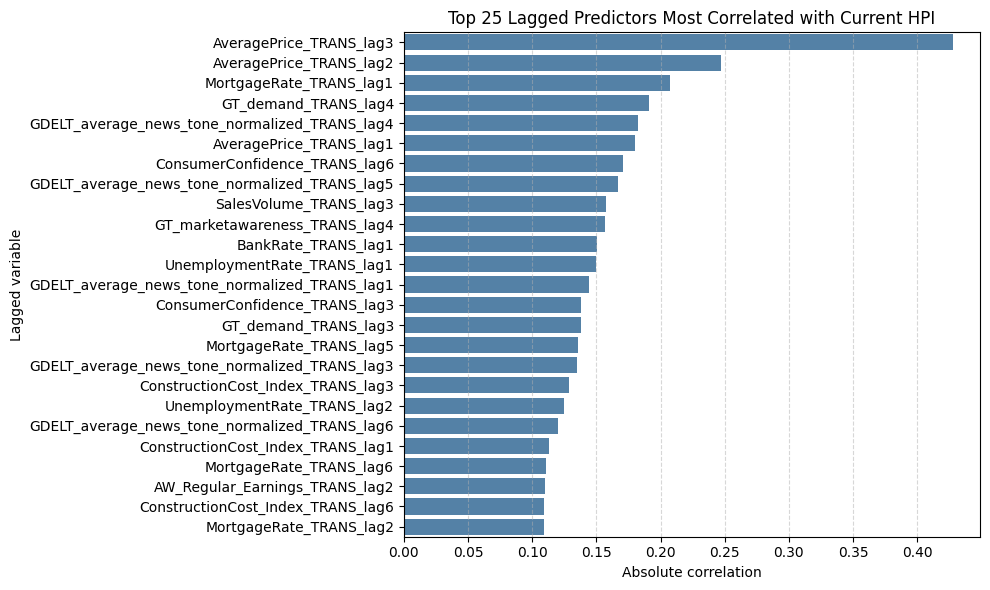

In [ ]:
# Finding the most informative lagged predictors of HPI
# Defining the target variable
target_col = "HPI_TRANS"

# Defining the feature columns
lag_cols = [
    c for c in df_lagged.columns
    if "_lag" in c and not c.startswith("HPI_TRANS")
]

# Pearson correlations with current value of HPI
corrs = df_lagged[lag_cols].corrwith(df_lagged[target_col])

# Sorting the result by absolute strength into a dataframe
corrs_sorted = corrs.reindex(corrs.abs().sort_values(ascending=False).index)

corr_df = (
    corrs_sorted
    .reset_index()
    .rename(columns={"index": "Variable_Lag", 0: "Correlation"})
)
corr_df["AbsCorr"] = corr_df["Correlation"].abs()

print("Top 15 lagged predictors most correlated with current UK HPI:")
display(corr_df.head(15))

# Bar plot of the top 25
plt.figure(figsize=(10, 6))
sns.barplot(
    data=corr_df.head(25),
    x="AbsCorr",
    y="Variable_Lag",
    color="steelblue"
)
plt.title("Top 25 Lagged Predictors Most Correlated with Current HPI")
plt.xlabel("Absolute correlation")
plt.ylabel("Lagged variable")
plt.grid(True, axis="x", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


Besides looking at the correlation of HPI with individual lagged predictors, I will also look at correlation of HPI with the average of lags 1...6 for each predictor

/tmp/ipython-input-4070937403.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=avg_corr, x="Lag", y="Correlation", palette="viridis")


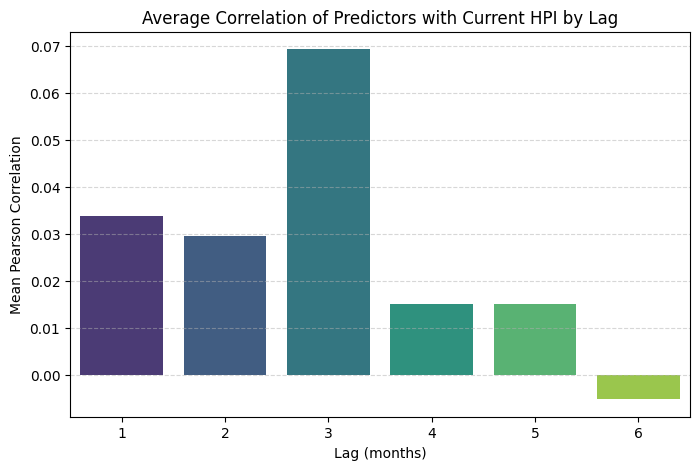

Average correlation per lag:


,Lag,Correlation
0,1,0.033860
1,2,0.029545
2,3,0.069350
3,4,0.015254
4,5,0.015267
5,6,-0.005085


In [ ]:
# Average correlation of predictors with current HPI

# Identifying all lagged predictors except for lagged HPI
lag_cols = [c for c in df_lagged.columns
            if "_lag" in c and not c.startswith("HPI_TRANS")]

# Correlation of each lagged feature with current HPI
corr_values = df_lagged[lag_cols].corrwith(df_lagged["HPI_TRANS"])

# Work out which lag each feature belongs to
corr_df = pd.DataFrame({
    "Variable": corr_values.index,
    "Correlation": corr_values.values,
})
corr_df["Lag"] = corr_df["Variable"].str.extract(r"_lag(\d+)").astype(int)

# Average correlation for lag 1, 2, ..., 6
avg_corr = corr_df.groupby("Lag")["Correlation"].mean().reset_index()

# Plot
plt.figure(figsize=(8,5))
sns.barplot(data=avg_corr, x="Lag", y="Correlation", palette="viridis")
plt.title("Average Correlation of Predictors with Current HPI by Lag")
plt.xlabel("Lag (months)")
plt.ylabel("Mean Pearson Correlation")
plt.grid(True, axis='y', linestyle='--', alpha=0.5)
plt.show()

print("Average correlation per lag:")
display(avg_corr)

Top 15 variables and their strongest lag:


,Variable_Lag,Correlation,Variable,Lag
1,AveragePrice_TRANS_lag3,0.427527,AveragePrice_TRANS,3
13,MortgageRate_TRANS_lag1,0.207624,MortgageRate_TRANS,1
7,GT_demand_TRANS_lag4,0.191225,GT_demand_TRANS,4
6,GDELT_average_news_tone_normalized_TRANS_lag4,-0.182048,GDELT_average_news_tone_normalized_TRANS,4
5,ConsumerConfidence_TRANS_lag6,0.170920,ConsumerConfidence_TRANS,6
14,SalesVolume_TRANS_lag3,0.157202,SalesVolume_TRANS,3
9,GT_marketawareness_TRANS_lag4,0.156996,GT_marketawareness_TRANS,4
2,BankRate_TRANS_lag1,0.150725,BankRate_TRANS,1
15,UnemploymentRate_TRANS_lag1,-0.149731,UnemploymentRate_TRANS,1
4,ConstructionCost_Index_TRANS_lag3,0.128640,ConstructionCost_Index_TRANS,3


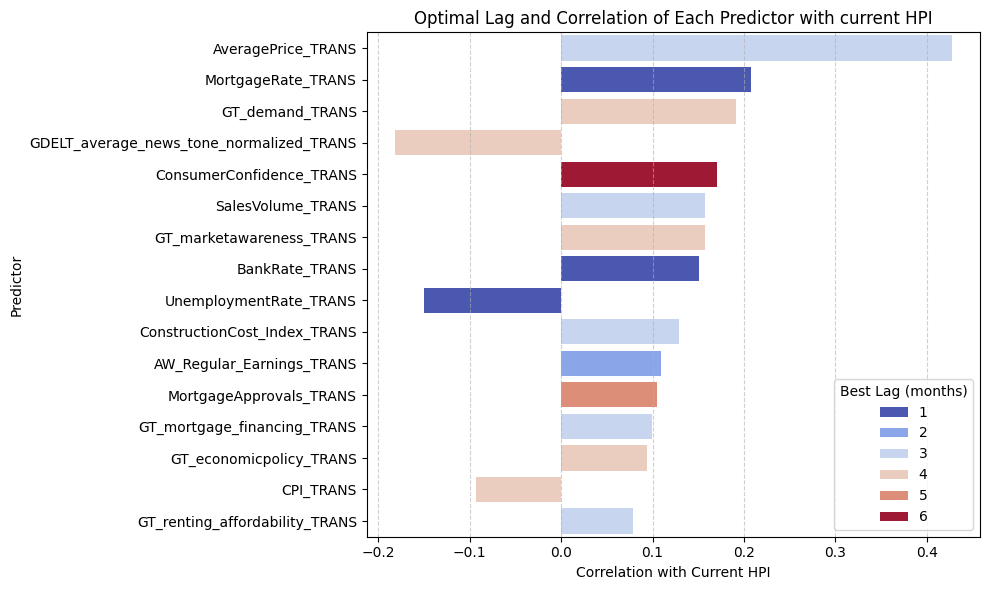

In [ ]:
# Identifying each variable's optimal lag

# Getting all lagged predictors except lagged HPI
lag_cols = [
    c for c in df_lagged.columns
    if "_lag" in c and not c.startswith("HPI_TRANS")
]

# Correlation between each lagged feature and current HPI
corr_values = df_lagged[lag_cols].corrwith(df_lagged["HPI_TRANS"])

# Building a dataframe with variable name and lag number
corr_df = pd.DataFrame({
    "Variable_Lag": corr_values.index,
    "Correlation": corr_values.values
})

# Split into base variable name and the numerical lag
corr_df["Variable"] = corr_df["Variable_Lag"].str.split("_lag").str[0]
corr_df["Lag"] = corr_df["Variable_Lag"].str.extract(r"_lag(\d+)").astype(int)

# For each variable, picking the lag with the strongest absolute correlation
best_lag_df = (
    corr_df.loc[
        corr_df.groupby("Variable")["Correlation"].apply(lambda x: x.abs().idxmax())
    ]
    .reset_index(drop=True)
)

# Sort variables by overall strength of relationship with HPI
best_lag_df = best_lag_df.sort_values(by="Correlation", key=np.abs, ascending=False)

print("Top 15 variables and their strongest lag:")
display(best_lag_df.head(15))

# Plot of the top 20 predictors with their optimal lag
plt.figure(figsize=(10,6))
sns.barplot(
    data=best_lag_df.head(20),
    x="Correlation",
    y="Variable",
    hue="Lag",
    palette="coolwarm",
    dodge=False
)
plt.title("Optimal Lag and Correlation of Each Predictor with current HPI")
plt.xlabel("Correlation with Current HPI")
plt.ylabel("Predictor")
plt.grid(True, axis="x", linestyle="--", alpha=0.6)
plt.legend(title="Best Lag (months)")
plt.tight_layout()
plt.show()


Creating the dataset for the econometric model (VAR)

In [ ]:
# Building the final UK-level modelling dataset with best lag for each predictor

TARGET = "HPI_TRANS"

# Collect all lagged predictors (except HPI's own lags)
lag_cols = [
    c for c in df_lagged.columns
    if "_lag" in c and not c.startswith(TARGET)
]

# Correlation between each lagged predictor and current HPI
corr_values = df_lagged[lag_cols].corrwith(df_lagged[TARGET])

# Build dataframe containing variable names, lags, and correlations
corr_df = pd.DataFrame({
    "Variable_Lag": corr_values.index,
    "Correlation": corr_values.values
})
corr_df["Variable"] = corr_df["Variable_Lag"].str.split("_lag").str[0]
corr_df["Lag"] = corr_df["Variable_Lag"].str.extract(r"_lag(\d+)").astype(int)

# For each predictor, keep the lag with the strongest absolute correlation
best_idx = corr_df.groupby("Variable")["Correlation"].apply(lambda s: s.abs().idxmax())
best_lag_df = corr_df.loc[best_idx].reset_index(drop=True)

# Final list of predictors (one best lag per variable)
selected_cols = best_lag_df["Variable_Lag"].tolist()

# Add autoregressive HPI lags (1–6)
include_hpi_lags = True
hpi_max_lag = 6
hpi_lags = [f"{TARGET}_lag{i}" for i in range(1, hpi_max_lag + 1)] if include_hpi_lags else []

# Build final dataset
feature_cols = selected_cols + hpi_lags
final_df = df_lagged[feature_cols + [TARGET]].dropna().copy()

# Summary table
summary = (
    best_lag_df
    .rename(columns={
        "Variable": "Predictor",
        "Lag": "BestLagMonths",
        "Correlation": "CorrWithHPI"
    })[["Predictor", "BestLagMonths", "CorrWithHPI"]]
)
summary = summary.reindex(summary["CorrWithHPI"].abs().sort_values(ascending=False).index)

print("Final modelling dataset shape:", final_df.shape)
print("Number of predictors selected (one per variable):", len(selected_cols))
print("HPI AR lags included:", ", ".join(hpi_lags) if hpi_lags else "none")

print("\nTop 15 predictors by absolute correlation:")
display(summary.head(15))

# Save files
final_df.to_csv("uk_nowcast_features_bestlag.csv", index=False)
summary.to_csv("uk_nowcast_features_bestlag_summary.csv", index=False)

print("\nSaved:")
print(" - uk_nowcast_features_bestlag.csv")
print(" - uk_nowcast_features_bestlag_summary.csv")

Final modelling dataset shape: (227, 23)
Number of predictors selected (one per variable): 16
HPI AR lags included: HPI_TRANS_lag1, HPI_TRANS_lag2, HPI_TRANS_lag3, HPI_TRANS_lag4, HPI_TRANS_lag5, HPI_TRANS_lag6

Top 15 predictors by absolute correlation:


,Predictor,BestLagMonths,CorrWithHPI
1,AveragePrice_TRANS,3,0.427527
13,MortgageRate_TRANS,1,0.207624
7,GT_demand_TRANS,4,0.191225
6,GDELT_average_news_tone_normalized_TRANS,4,-0.182048
5,ConsumerConfidence_TRANS,6,0.170920
14,SalesVolume_TRANS,3,0.157202
9,GT_marketawareness_TRANS,4,0.156996
2,BankRate_TRANS,1,0.150725
15,UnemploymentRate_TRANS,1,-0.149731
4,ConstructionCost_Index_TRANS,3,0.128640



Saved:
 - uk_nowcast_features_bestlag.csv
 - uk_nowcast_features_bestlag_summary.csv


In [ ]:
final_df

,AW_Regular_Earnings_TRANS_lag2,AveragePrice_TRANS_lag3,BankRate_TRANS_lag1,CPI_TRANS_lag4,ConstructionCost_Index_TRANS_lag3,ConsumerConfidence_TRANS_lag6,GDELT_average_news_tone_normalized_TRANS_lag4,GT_demand_TRANS_lag4,GT_economicpolicy_TRANS_lag4,GT_marketawareness_TRANS_lag4,...,MortgageRate_TRANS_lag1,SalesVolume_TRANS_lag3,UnemploymentRate_TRANS_lag1,HPI_TRANS_lag1,HPI_TRANS_lag2,HPI_TRANS_lag3,HPI_TRANS_lag4,HPI_TRANS_lag5,HPI_TRANS_lag6,HPI_TRANS
Date,,,,,,,,,,,,,,,,,,,,,
2006-08-01,0.002029,0.009434,0.000000,0.095310,0.003797,0.086779,0.520766,0.011299,-0.242369,-0.012486,...,0.001998,0.099264,0.000000,0.013378,0.010152,0.008540,0.022551,0.007042,0.001768,0.008271
2006-09-01,-0.005730,0.009429,0.054067,0.087011,0.011897,-0.303463,0.581194,-0.101688,0.053860,0.024972,...,0.017805,0.182235,0.000000,0.008271,0.013378,0.010152,0.008540,0.022551,0.007042,0.004930
2006-10-01,-0.002029,0.014285,0.000000,0.080043,0.003783,0.282645,0.660133,-0.067792,-0.094254,-0.199778,...,0.000000,-0.084324,0.000000,0.004930,0.008271,0.013378,0.010152,0.008540,0.022551,0.004906
2006-11-01,0.001461,0.008364,0.000000,-0.039221,0.010390,-0.151764,0.238278,0.259868,-0.040395,0.461987,...,-0.021805,0.051187,-0.018349,0.004906,0.004930,0.008271,0.013378,0.010152,0.008540,0.006504
2006-12-01,0.004658,0.004068,0.051293,0.039221,0.005443,0.065141,0.036533,0.248569,1.373422,0.461987,...,0.041223,-0.030666,0.018349,0.006504,0.004906,0.004930,0.008271,0.013378,0.010152,0.011281
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-02-01,0.004060,-0.000590,0.000000,0.207639,0.005938,0.081568,0.576109,-0.090389,-0.121184,-0.224751,...,0.010811,-0.045451,0.000000,0.002948,-0.003929,-0.000980,0.004909,0.000000,0.009891,0.002940
2025-03-01,-0.001053,-0.003500,-0.054067,0.089612,0.000009,-0.896512,1.108735,-0.203375,0.134649,0.037458,...,0.008565,-0.139756,0.022473,0.002940,0.002948,-0.003929,-0.000980,0.004909,0.000000,0.009737
2025-04-01,-0.000752,0.002154,0.000000,0.000000,-0.003275,0.027413,1.100403,-0.305063,-1.157983,-0.561876,...,-0.028110,-0.140080,0.021979,0.009737,0.002940,0.002948,-0.003929,-0.000980,0.004909,-0.024523


Now I will create the final dataset for the machine learning models. This will be a panel dataset of the 405 regions at a monthly frequency and will also contain lags of each variable.

The Regional Panel dataset for Machine Learning Models

In [ ]:
# Regional Panel dataset for ML models

# Load and prepare base dataframe
df = df1.copy()

# Ensure Date column exists
if isinstance(df.index, pd.DatetimeIndex):
    df = df.reset_index().rename(columns={'index': 'Date'})
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values(['RegionName', 'Date']).reset_index(drop=True)

# Transformation map (In the earlier section, I had already determined the transformations needed for each variable)
TRANSFORM_MAP = {
    'HPI': 'logdiff',
    'AveragePrice': 'logdiff',
    'SalesVolume': 'logdiff',
    'AW_Regular_Earnings': 'logdiff_seas',
    'UnemploymentRate': 'logdiff',
    'CPI': 'logdiff',
    'MortgageApprovals': 'logdiff',
    'MortgageRate': 'logdiff',
    'BankRate': 'logdiff',
    'ConsumerConfidence': 'level',
    'ConstructionCost_Index': 'logdiff_seas',
    'GT_demand': 'diff',
    'GT_economicpolicy': 'diff',
    'GT_marketawareness': 'diff',
    'GT_mortgage_financing': 'diff',
    'GT_renting_affordability': 'diff',
    'GDELT_average_news_tone_normalized': 'level'
}

def apply_transform(series, method):
    if method == 'logdiff':
        return np.log(series).replace([-np.inf, np.inf], np.nan).diff()
    elif method == 'diff':
        return series.diff()
    elif method == 'logdiff_seas':
        x = np.log(series).replace([-np.inf, np.inf], np.nan).diff()
        return x.diff(12)
    elif method == 'level':
        return series
    else:
        raise ValueError(f"Unknown method: {method}")

# Applying the transformations
panel = df[['Date','RegionName'] + list(TRANSFORM_MAP.keys())].copy()
for col, how in TRANSFORM_MAP.items():
    panel[f"{col}_TRANS"] = (
        panel.groupby('RegionName', group_keys=False)[col]
             .apply(apply_transform, method=how)
    )

TARGET = "HPI_TRANS"
trans_cols = [f"{c}_TRANS" for c in TRANSFORM_MAP.keys()]
panel_trans = panel[['Date','RegionName'] + trans_cols].copy()

# Create 1–6 lags
MAX_LAG = 6
pred_cols = [c for c in panel_trans.columns if c.endswith('_TRANS') and c != TARGET]

def make_lags(g):
    g = g.sort_values('Date').copy()
    for col in pred_cols + [TARGET]:
        for L in range(1, MAX_LAG + 1):
            g[f"{col}_lag{L}"] = g[col].shift(L)
    return g

panel_lagged = panel_trans.groupby('RegionName', group_keys=False).apply(make_lags)

# Final unscaled modelling dataset
lag_cols = [c for c in panel_lagged.columns if "_lag" in c]
final_ml = (
    panel_lagged[['Date','RegionName', TARGET] + lag_cols]
    .dropna()
    .reset_index(drop=True)
)

print("Regional ML dataset created:", final_ml.shape)
final_ml.to_csv("regional_ml_nowcast_features_lag1to6.csv", index=False)

/tmp/ipython-input-2572633539.py:66: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  g[f"{col}_lag{L}"] = g[col].shift(L)
/tmp/ipython-input-2572633539.py:66: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  g[f"{col}_lag{L}"] = g[col].shift(L)
/tmp/ipython-input-2572633539.py:66: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newfr

Regional ML dataset created: (91935, 105)


In [ ]:
final_ml

,Date,RegionName,HPI_TRANS,AveragePrice_TRANS_lag1,AveragePrice_TRANS_lag2,AveragePrice_TRANS_lag3,AveragePrice_TRANS_lag4,AveragePrice_TRANS_lag5,AveragePrice_TRANS_lag6,SalesVolume_TRANS_lag1,SalesVolume_TRANS_lag2,SalesVolume_TRANS_lag3,SalesVolume_TRANS_lag4,SalesVolume_TRANS_lag5,SalesVolume_TRANS_lag6,AW_Regular_Earnings_TRANS_lag1,AW_Regular_Earnings_TRANS_lag2,AW_Regular_Earnings_TRANS_lag3,AW_Regular_Earnings_TRANS_lag4,AW_Regular_Earnings_TRANS_lag5,AW_Regular_Earnings_TRANS_lag6,UnemploymentRate_TRANS_lag1,UnemploymentRate_TRANS_lag2,UnemploymentRate_TRANS_lag3,UnemploymentRate_TRANS_lag4,UnemploymentRate_TRANS_lag5,UnemploymentRate_TRANS_lag6,CPI_TRANS_lag1,CPI_TRANS_lag2,CPI_TRANS_lag3,CPI_TRANS_lag4,CPI_TRANS_lag5,CPI_TRANS_lag6,MortgageApprovals_TRANS_lag1,MortgageApprovals_TRANS_lag2,MortgageApprovals_TRANS_lag3,MortgageApprovals_TRANS_lag4,MortgageApprovals_TRANS_lag5,MortgageApprovals_TRANS_lag6,MortgageRate_TRANS_lag1,MortgageRate_TRANS_lag2,MortgageRate_TRANS_lag3,MortgageRate_TRANS_lag4,MortgageRate_TRANS_lag5,MortgageRate_TRANS_lag6,BankRate_TRANS_lag1,BankRate_TRANS_lag2,BankRate_TRANS_lag3,BankRate_TRANS_lag4,BankRate_TRANS_lag5,BankRate_TRANS_lag6,ConsumerConfidence_TRANS_lag1,ConsumerConfidence_TRANS_lag2,ConsumerConfidence_TRANS_lag3,ConsumerConfidence_TRANS_lag4,ConsumerConfidence_TRANS_lag5,ConsumerConfidence_TRANS_lag6,ConstructionCost_Index_TRANS_lag1,ConstructionCost_Index_TRANS_lag2,ConstructionCost_Index_TRANS_lag3,ConstructionCost_Index_TRANS_lag4,ConstructionCost_Index_TRANS_lag5,ConstructionCost_Index_TRANS_lag6,GT_demand_TRANS_lag1,GT_demand_TRANS_lag2,GT_demand_TRANS_lag3,GT_demand_TRANS_lag4,GT_demand_TRANS_lag5,GT_demand_TRANS_lag6,GT_economicpolicy_TRANS_lag1,GT_economicpolicy_TRANS_lag2,GT_economicpolicy_TRANS_lag3,GT_economicpolicy_TRANS_lag4,GT_economicpolicy_TRANS_lag5,GT_economicpolicy_TRANS_lag6,GT_marketawareness_TRANS_lag1,GT_marketawareness_TRANS_lag2,GT_marketawareness_TRANS_lag3,GT_marketawareness_TRANS_lag4,GT_marketawareness_TRANS_lag5,GT_marketawareness_TRANS_lag6,GT_mortgage_financing_TRANS_lag1,GT_mortgage_financing_TRANS_lag2,GT_mortgage_financing_TRANS_lag3,GT_mortgage_financing_TRANS_lag4,GT_mortgage_financing_TRANS_lag5,GT_mortgage_financing_TRANS_lag6,GT_renting_affordability_TRANS_lag1,GT_renting_affordability_TRANS_lag2,GT_renting_affordability_TRANS_lag3,GT_renting_affordability_TRANS_lag4,GT_renting_affordability_TRANS_lag5,GT_renting_affordability_TRANS_lag6,GDELT_average_news_tone_normalized_TRANS_lag1,GDELT_average_news_tone_normalized_TRANS_lag2,GDELT_average_news_tone_normalized_TRANS_lag3,GDELT_average_news_tone_normalized_TRANS_lag4,GDELT_average_news_tone_normalized_TRANS_lag5,GDELT_average_news_tone_normalized_TRANS_lag6,HPI_TRANS_lag1,HPI_TRANS_lag2,HPI_TRANS_lag3,HPI_TRANS_lag4,HPI_TRANS_lag5,HPI_TRANS_lag6
0,2006-08-01,Aberdeenshire,0.018238,0.002524,0.018084,0.060853,0.067165,0.018117,-0.016325,-0.183923,0.233194,0.093090,-0.043391,0.337747,-0.161775,-0.005730,0.002029,0.002100,-0.000095,-0.004668,0.001792,0.000000,0.000000,0.018349,0.018692,0.019048,0.000000,-0.039221,0.080043,0.087011,0.095310,-0.095310,0.000000,-0.006912,0.024679,0.044141,-0.059926,0.028997,-0.049171,0.001998,0.000000,0.047092,0.010538,0.002121,0.019293,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.119347,0.065141,-0.151764,0.282645,-0.303463,0.086779,0.003783,0.011897,0.003797,-0.004243,0.003887,-0.004634,0.259868,-0.067792,-0.101688,0.011299,-0.033896,0.000000,-0.040395,-0.094254,0.053860,-0.242369,-0.350088,0.134649,0.461987,-0.199778,0.024972,-0.012486,-0.149834,0.087403,-0.090917,-0.194823,-0.051953,0.038965,-0.246776,0.077929,0.135770,-0.135770,0.000000,-0.037028,0.049371,-0.135770,0.238278,0.660133,0.581194,0.520766,0.510918,0.423864,0.003072,0.018634,0.059743,0.067093,0.017954,-0.016173
1,2006-09-01,Aberdeenshire,0.042748,0.019497,0.002524,0.018084,0.060853,0.067165,0.018117,0.121196,-0.183923,0.233194,0.093090,-0.043391,0.337747,-0.002029,-0.005730,0.002029,0

Standardisation is required for Ridge and Lasso regression models because these models penalize the size of coefficients and so the each predictor's scale directly impacts how strongly it will be penalized.As a result standardisation will ensure that all variables are penalized fairly. Without scaling variables with larger ranges will dominate the model and cause coefficient distortions.

In [ ]:
# Standardisation of predictors for Ridge and Lasso regression models only
from sklearn.preprocessing import StandardScaler

TARGET = "HPI_TRANS"

FEATURES = [c for c in final_ml.columns if c not in ['Date','RegionName', TARGET]]

X = final_ml[FEATURES].copy()
y = final_ml[TARGET].copy()

scaler = StandardScaler()
X_scaled_array = scaler.fit_transform(X)
X_scaled = pd.DataFrame(X_scaled_array, columns=FEATURES, index=final_ml.index)

print("Standardised X ready for Ridge/Lasso.")
print("Shapes:", X_scaled.shape, y.shape)


Standardised X ready for Ridge/Lasso.
Shapes: (91935, 102) (91935,)


In [ ]:
# Final check of the ML dataset
# Number of regions and months
print("Number of regions:", df['RegionName'].nunique())
print("Number of unique months:", df['Date'].nunique())

# Missing values across the dataset
total_na = df.isna().sum().sum()
print("Total missing values in the dataset:", total_na)

# Duplicate (Region, Date) rows
dupes = df.duplicated(subset=['RegionName', 'Date']).sum()
print("Duplicate (Region, Date) rows:", dupes)

# Observations per region
obs_per_region = df['RegionName'].value_counts().sort_values()
print("\nObservations per region (min to max):")
print(obs_per_region.head(3).to_string(), " ... ", obs_per_region.tail(3).to_string())

# Features and target
FEATURES = [c for c in final_ml.columns if c not in ['Date', 'RegionName', 'HPI_TRANS']]
X = final_ml[FEATURES]
y = final_ml['HPI_TRANS']

print("\nX (feature matrix) shape:", X.shape)
print("y (target vector) shape:", y.shape)


Number of regions: 405
Number of unique months: 246
Total missing values in the dataset: 0
Duplicate (Region, Date) rows: 0

Observations per region (min to max):
RegionName
Ashford                 246
Babergh                 246
Barking And Dagenham    246  ...  RegionName
Argyll And Bute             246
Ards And North Down         246
Yorkshire And The Humber    246

X (feature matrix) shape: (91935, 102)
y (target vector) shape: (91935,)


In [ ]:
#Constructing traditional, high-frequency, and combined feature sets from existing lagged variables

traditional_vars = [
    'AW_Regular_Earnings_TRANS', 'UnemploymentRate_TRANS',
    'CPI_TRANS', 'MortgageApprovals_TRANS', 'MortgageRate_TRANS',
    'BankRate_TRANS', 'ConsumerConfidence_TRANS', 'ConstructionCost_Index_TRANS'
]

hf_vars = [
    'GT_demand_TRANS', 'GT_economicpolicy_TRANS', 'GT_marketawareness_TRANS',
    'GT_mortgage_financing_TRANS', 'GT_renting_affordability_TRANS',
    'GDELT_average_news_tone_normalized_TRANS'
]

combined_vars = traditional_vars + hf_vars


def get_existing_lags(var_list):
    return [col for col in final_ml.columns if any(col.startswith(v + "_lag") for v in var_list)]

FEATURE_SETS = {
    "traditional": get_existing_lags(traditional_vars),
    "highfreq": get_existing_lags(hf_vars),
    "combined": get_existing_lags(combined_vars)
}

Defining the Evaluation metrics: RMSE and MAE.

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

#Evaluation metrics-RMSE and MAE
def eval_metrics(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae  = mean_absolute_error(y_true, y_pred)

    return rmse, mae


# Modelling

There will be three specifications for both econometric and ml models. 1. Traditional predictors only 2. High-frequency predictors 3. combination of both.
Note that: Since ARIMA and SARIMA only use lags of the target variable, these two models will not have the three specifications.

Econometric models: 1) ARIMA
 2) SARIMA
 3) VAR

ARIMA

At first, I will start by determining the optimal structure for ARIMA using AIC and BIC criterion.

In [ ]:
import warnings
import itertools
from statsmodels.tsa.arima.model import ARIMA

# Using the stationary HPI series
y = uk_stationary['HPI_TRANS'].dropna()

p_range = range(0, 6)
q_range = range(0, 6)

candidate_orders = list(itertools.product(p_range, [0], q_range))

results = []

# Trying each (p,0,q) combination and record its AIC/BIC
for order in candidate_orders:
    try:
        with warnings.catch_warnings():
            warnings.filterwarnings("ignore")
            model = ARIMA(y, order=order).fit()

        results.append({
            "order": order,
            "AIC": model.aic,
            "BIC": model.bic
        })
    except:
        # Some specifications may fail to converge; skip quietly
        continue

# Converting results to a DataFrame and sort by AIC
order_ranked = (
    pd.DataFrame(results)
    .sort_values("AIC")
    .reset_index(drop=True)
)

print("Top 5 ARIMA(p,0,q) models ranked by AIC:")
print(order_ranked.head(5))

Top 5 ARIMA(p,0,q) models ranked by AIC:
       order          AIC          BIC
0  (2, 0, 5) -1658.427867 -1626.916543
1  (4, 0, 4) -1643.671382 -1608.658800
2  (5, 0, 3) -1641.860883 -1606.848300
3  (5, 0, 4) -1641.186503 -1602.672663
4  (0, 0, 4) -1634.716962 -1613.709413


As displayed in the above result, ARIMA (2,0,5) is the optimal structure based on AIC and BIC. A rolling one-step ahead forecasting framework will be used to evaluate the model. The model will be reported with both the forecasy accuracy metrics and computational efficiency

ARIMA Nowcasting

In [ ]:
# ARIMA (2,0,5)
import time

# Preparing the stationary UK HPI series
y = uk_stationary['HPI_TRANS'].dropna().copy()
y.index = pd.to_datetime(y.index).to_period('M').to_timestamp('M')
y = y.sort_index()

START_TEST = pd.Timestamp('2018-01-31').to_period('M').to_timestamp('M')
best_order = (2, 0, 5)   # chosen earlier using AIC/BIC

# Containers for forecasts, actual values and timing
preds, actuals, dates = [], [], []
train_times, pred_times = [], []

# Rolling expanding-window forecast with timing
t0 = time.time()

for t in y.index[y.index >= START_TEST]:

    # Use all data up to the previous month as the training sample
    train_end = (t.to_period('M') - 1).to_timestamp('M')
    train = y.loc[:train_end]
    if len(train) < 36:
        continue

    # Time the estimation step
    t_train_start = time.time()
    model = ARIMA(train, order=best_order).fit()
    t_train_end = time.time()
    train_times.append(t_train_end - t_train_start)

    # Time the prediction step
    t_pred_start = time.time()
    pred = float(model.forecast(1).iloc[0])
    t_pred_end = time.time()
    pred_times.append(t_pred_end - t_pred_start)

    # Store forecast and realised value
    preds.append(pred)
    actuals.append(float(y.loc[t]))
    dates.append(t)

# Forecast accuracy (RMSE and MAE)
rmse, mae = eval_metrics(actuals, preds)
print(f"[ARIMA{best_order}] Steps={len(preds)}  RMSE={rmse:.5f}  MAE={mae:.5f}")

# Computational efficiency summary
total_time = time.time() - t0

avg_train = float(np.mean(train_times)) if train_times else np.nan
avg_pred  = float(np.mean(pred_times)) if pred_times else np.nan
avg_total = avg_train + avg_pred if train_times and pred_times else np.nan

print("\nARIMA computational efficiency (expanding window):")
print(f"Total time for rolling forecasts: {total_time:.2f} seconds")
print(f"Average training time per forecast:   {avg_train:.4f} seconds")
print(f"Average prediction time per forecast: {avg_pred:.6f} seconds")
print(f"Average total time per forecast:      {avg_total:.4f} seconds")

# Save actual vs predicted series
arima_nowcast = pd.DataFrame(
    {"ARIMA_pred": preds, "HPI_TRANS": actuals},
    index=pd.Index(dates, name="Date")
)

/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

[ARIMA(2, 0, 5)] Steps=90  RMSE=0.01221  MAE=0.00703

ARIMA computational efficiency (expanding window):
Total time for rolling forecasts: 102.79 seconds
Average training time per forecast:   1.1288 seconds
Average prediction time per forecast: 0.012695 seconds
Average total time per forecast:      1.1415 seconds


/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [ ]:
arima_nowcast

,ARIMA_pred,HPI_TRANS
Date,,
2018-01-31,-0.004529,-0.002519
2018-02-28,-0.004547,0.002519
2018-03-31,0.005029,-0.006309
2018-04-30,-0.001745,0.010076
2018-05-31,0.007119,0.003752
...,...,...
2025-02-28,-0.001637,0.002940
2025-03-31,-0.000546,0.009737
2025-04-30,0.003393,-0.024523


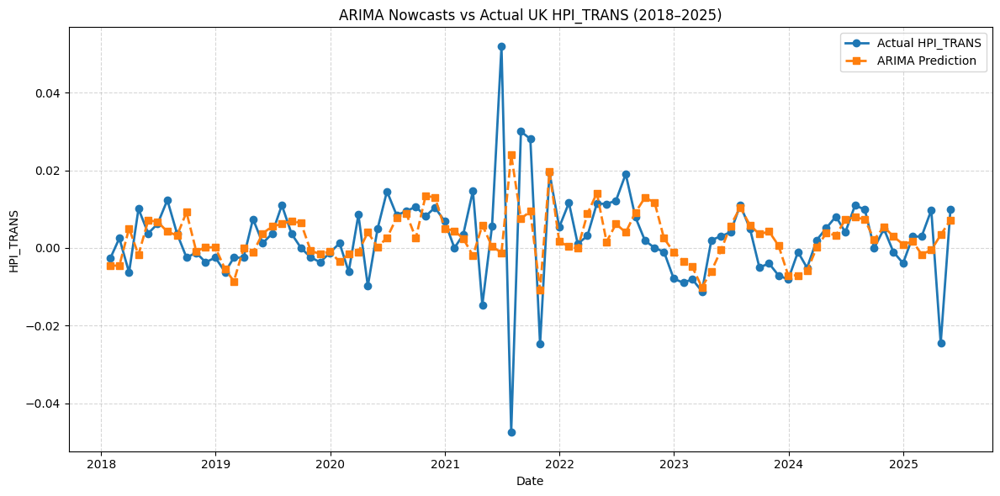

In [ ]:
# Plotting predicted vs actual change in UK HPI
df_plot = arima_nowcast.loc["2018-01-01":"2025-06-01"]
plt.figure(figsize=(12,6))

# Actual values
plt.plot(
    df_plot.index, df_plot['HPI_TRANS'],
    marker='o', linewidth=2, label='Actual HPI_TRANS'
)

# ARIMA predictions
plt.plot(
    df_plot.index, df_plot['ARIMA_pred'],
    marker='s', linestyle='--', linewidth=2, label='ARIMA Prediction'
)

plt.title("ARIMA Nowcasts vs Actual UK HPI_TRANS (2018–2025)")
plt.xlabel("Date")
plt.ylabel("HPI_TRANS")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

Residual Analysis

I have conducted a quick residual analysis to check for autocorrelation in the residuals

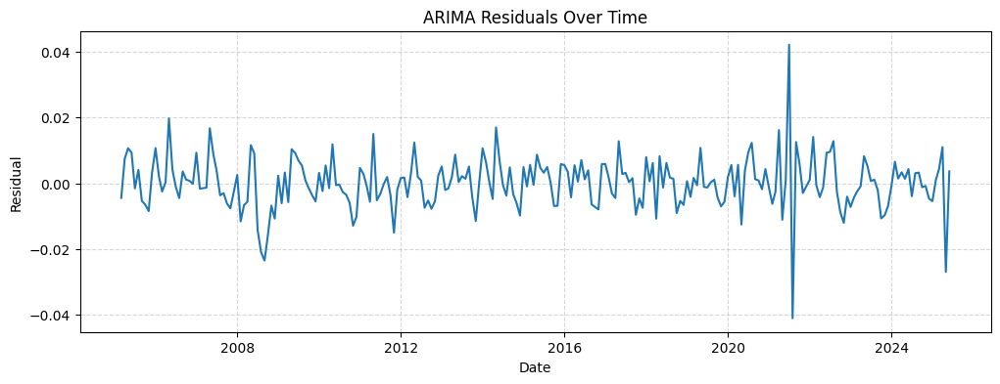

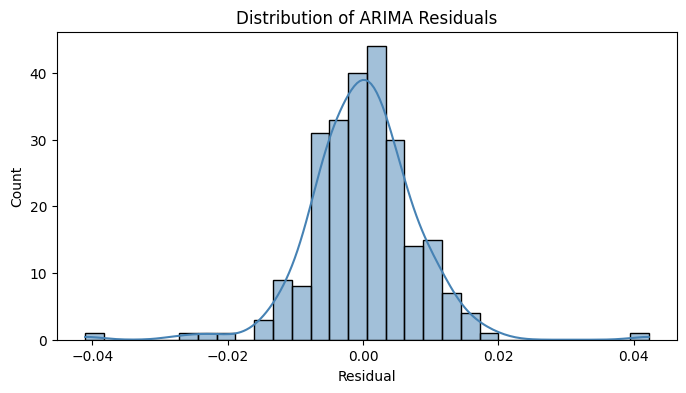

<Figure size 600x600 with 0 Axes>

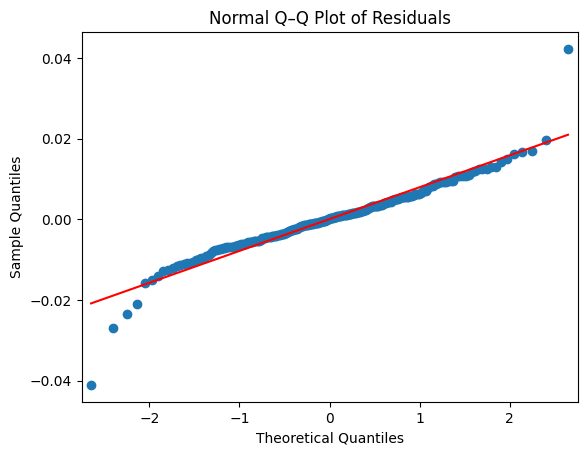

<Figure size 800x400 with 0 Axes>

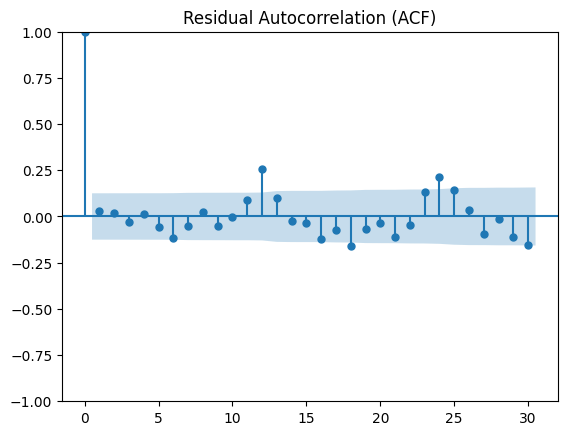

Ljung–Box Test (lag 12):
      lb_stat  lb_pvalue
12  25.638941   0.012069


In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.gofplots import qqplot
from statsmodels.stats.diagnostic import acorr_ljungbox

# Extracting residuals from the fitted ARIMA model
residuals = model.resid.dropna()

# Plot-1 Residuals over time
plt.figure(figsize=(12,4))
plt.plot(residuals)
plt.title("ARIMA Residuals Over Time")
plt.xlabel("Date")
plt.ylabel("Residual")
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

# Plot-2 Histogram with density
plt.figure(figsize=(8,4))
sns.histplot(residuals, kde=True, color='steelblue')
plt.title("Distribution of ARIMA Residuals")
plt.xlabel("Residual")
plt.show()

# Plot-3 Normal Q–Q plot
plt.figure(figsize=(6,6))
qqplot(residuals, line='s')
plt.title("Normal Q–Q Plot of Residuals")
plt.show()

# Plot-4 ACF of residuals
plt.figure(figsize=(8,4))
plot_acf(residuals, lags=30)
plt.title("Residual Autocorrelation (ACF)")
plt.show()

# Plot-5 Ljung–Box white-noise test (up to lag 12)
lb = acorr_ljungbox(residuals, lags=[12], return_df=True)
print("Ljung–Box Test (lag 12):")
print(lb)

SARIMA

At first, I will identify the optimal structure for the SARIMA model using AIC criterion

In [ ]:
import numpy as np
from itertools import product
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Preparing stationary UK HPI series
y = uk_stationary['HPI_TRANS'].dropna().copy()
y.index = pd.to_datetime(y.index).to_period('M').to_timestamp('M')
y = y.sort_index()

# Using only data before 2018 for order selection
START_TEST = pd.Timestamp('2018-01-31').to_period('M').to_timestamp('M')
y_train = y.loc[y.index < START_TEST]

print("SARIMA order selection sample:")
print(y_train.index.min(), "→", y_train.index.max())
print("Number of observations:", len(y_train))

# Grid of candidate (p,d,q) and seasonal (P,D,Q,12)
orders = [(p, 0, q) for p in range(0, 4) for q in range(0, 4)]   # d = 0 (already differenced)
seasonals = [(P, D, Q, 12) for P in (0, 1) for D in (0, 1) for Q in (0, 1)]

best_aic = np.inf
best_order = None
best_seasonal = None

for order, seas in product(orders, seasonals):
    try:
        model = SARIMAX(
            y_train,
            order=order,
            seasonal_order=seas,
            enforce_stationarity=False,
            enforce_invertibility=False
        ).fit(disp=False)

        if model.aic < best_aic:
            best_aic = model.aic
            best_order = order
            best_seasonal = seas
    except Exception:
        continue

print(f"Best SARIMA order (pre-2018, by AIC): order={best_order}, seasonal={best_seasonal}, AIC={best_aic:.2f}")

SARIMA order selection sample:
2005-02-28 00:00:00 → 2017-12-31 00:00:00
Number of observations: 155


/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

Best SARIMA order (pre-2018, by AIC): order=(1, 0, 0), seasonal=(0, 0, 0, 12), AIC=-1094.43


/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [ ]:
# SARIMA model
import time

# Using the same stationary HPI series
y = uk_stationary['HPI_TRANS'].dropna().copy()
y.index = pd.to_datetime(y.index).to_period('M').to_timestamp('M')
y = y.sort_index()

START_TEST = pd.Timestamp('2018-01-31').to_period('M').to_timestamp('M')

# Using the SARIMA specification chosen above
sarima_order = best_order
sarima_seasonal = best_seasonal

preds, actuals, dates = [], [], []
train_times, pred_times = [], []

t0 = time.time()  # total rolling time

# Expanding-window one-step-ahead forecasts
for t in y.index[y.index >= START_TEST]:

    # Training sample: all data up to the previous month
    train_end = (t.to_period('M') - 1).to_timestamp('M')
    train = y.loc[:train_end]

    if len(train) < 36:
        continue

    try:
        # Time the model estimation
        t_train_start = time.time()
        model = SARIMAX(
            train,
            order=sarima_order,
            seasonal_order=sarima_seasonal,
            enforce_stationarity=False,
            enforce_invertibility=False
        ).fit(disp=False)
        t_train_end = time.time()
        train_times.append(t_train_end - t_train_start)

        # Time the one-step-ahead prediction
        t_pred_start = time.time()
        forecast = float(model.forecast(1).iloc[0])
        t_pred_end = time.time()
        pred_times.append(t_pred_end - t_pred_start)

        # Store forecast and actual
        preds.append(forecast)
        actuals.append(float(y.loc[t]))
        dates.append(t)

    except Exception:
        continue

total_time = time.time() - t0

# Evaluation metrics for forecast accuracy
rmse, mae = eval_metrics(actuals, preds)
print(f"\n[SARIMA {sarima_order}, seasonal={sarima_seasonal}] "
      f"Steps={len(preds)}  RMSE={rmse:.5f}  MAE={mae:.5f}")

# Computational efficiency summary
avg_train = float(np.mean(train_times)) if train_times else np.nan
avg_pred  = float(np.mean(pred_times)) if pred_times else np.nan
avg_total = avg_train + avg_pred if train_times and pred_times else np.nan

print("\nSARIMA computational efficiency (expanding window):")
print(f"Total rolling nowcast time: {total_time:.2f} seconds")
print(f"Average training time per forecast:   {avg_train:.4f} seconds")
print(f"Average prediction time per forecast: {avg_pred:.6f} seconds")
print(f"Average total time per forecast:      {avg_total:.4f} seconds")

# Saving prediction vs actual series
sarima_nowcast = pd.DataFrame(
    {"SARIMA_pred": preds, "HPI_TRANS": actuals},
    index=pd.Index(dates, name="Date")
)

/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.12/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op


[SARIMA (1, 0, 0), seasonal=(0, 0, 0, 12)] Steps=90  RMSE=0.01428  MAE=0.00838

SARIMA computational efficiency (expanding window):
Total rolling nowcast time: 4.78 seconds
Average training time per forecast:   0.0449 seconds
Average prediction time per forecast: 0.007698 seconds
Average total time per forecast:      0.0526 seconds


Preview of SARIMA nowcast results:


,SARIMA_pred,HPI_TRANS
Date,,
2018-01-31,0.002535,-0.002519
2018-02-28,-0.001685,0.002519
2018-03-31,0.001683,-0.006309
2018-04-30,-0.004207,0.010076
2018-05-31,0.006649,0.003752


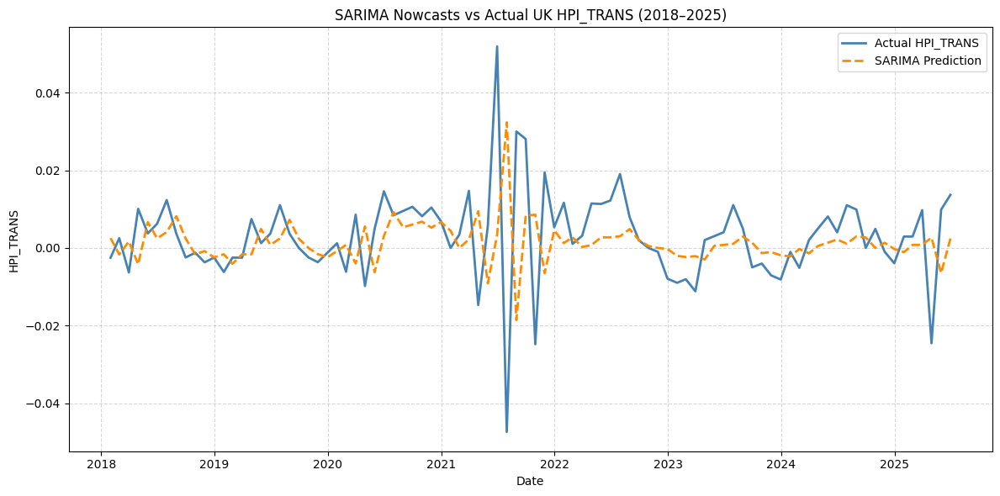

In [ ]:
# Plotting Predicted vs Actual change in UK HPI

# Preview of the nowcasting results
print("Preview of SARIMA nowcast results:")
display(sarima_nowcast.head())

# Plot predicted vs actual values (2018–2025)
plt.figure(figsize=(12, 6))

# Actual series
plt.plot(
    sarima_nowcast.index,
    sarima_nowcast["HPI_TRANS"],
    label="Actual HPI_TRANS",
    linewidth=2,
    color="steelblue"
)

# SARIMA predictions
plt.plot(
    sarima_nowcast.index,
    sarima_nowcast["SARIMA_pred"],
    label="SARIMA Prediction",
    linestyle="--",
    linewidth=2,
    color="darkorange"
)

plt.title("SARIMA Nowcasts vs Actual UK HPI_TRANS (2018–2025)")
plt.xlabel("Date")
plt.ylabel("HPI_TRANS")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


Residual Analysis

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Fitting SARIMA model on the full available sample
sarima_model = SARIMAX(
    y,
    order=best_order,
    seasonal_order=best_seasonal,
    enforce_stationarity=False,
    enforce_invertibility=False
).fit(disp=False)

print(sarima_model.summary())


                               SARIMAX Results                                
Dep. Variable:              HPI_TRANS   No. Observations:                  245
Model:               SARIMAX(1, 0, 0)   Log Likelihood                 778.322
Date:                Wed, 10 Dec 2025   AIC                          -1552.644
Time:                        13:18:47   BIC                          -1545.650
Sample:                    02-28-2005   HQIC                         -1549.827
                         - 06-30-2025                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2518      0.034      7.515      0.000       0.186       0.317
sigma2      9.928e-05   5.47e-06     18.141      0.000    8.86e-05       0.000
Ljung-Box (L1) (Q):                   2.88   Jarque-

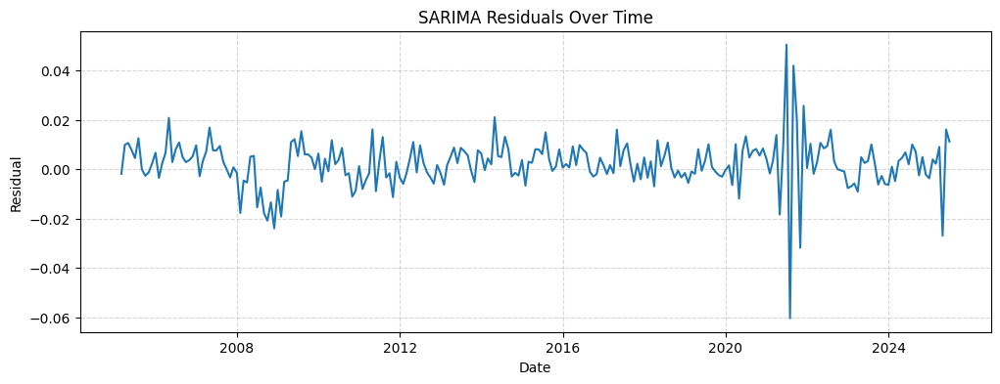

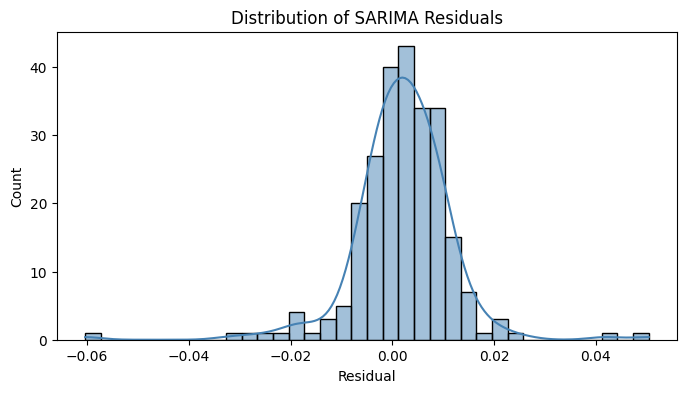

<Figure size 600x600 with 0 Axes>

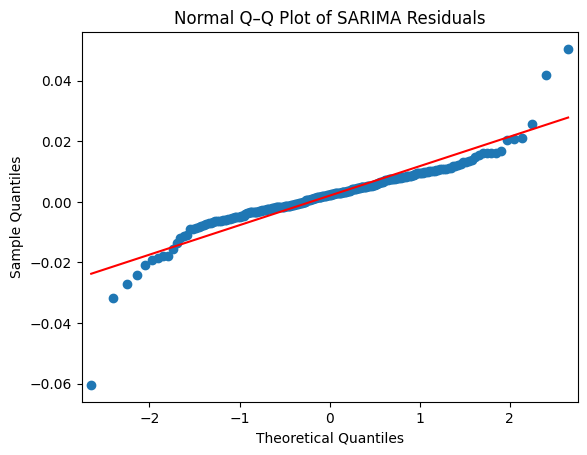

<Figure size 800x400 with 0 Axes>

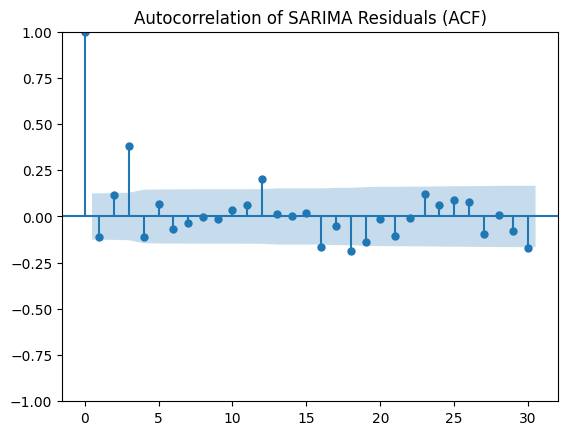

Ljung–Box test for SARIMA residuals (lag 12):
     lb_stat     lb_pvalue
12  60.06637  2.195327e-08


In [ ]:
# Using residuals from the fitted SARIMA model
residuals = sarima_model.resid.dropna()

# Plot-1 Residuals over time
plt.figure(figsize=(12, 4))
plt.plot(residuals)
plt.title("SARIMA Residuals Over Time")
plt.xlabel("Date")
plt.ylabel("Residual")
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()

# Plot-2 Histogram with density
plt.figure(figsize=(8, 4))
sns.histplot(residuals, kde=True, color="steelblue")
plt.title("Distribution of SARIMA Residuals")
plt.xlabel("Residual")
plt.show()

# Plot-3 Normal Q–Q plot
plt.figure(figsize=(6, 6))
qqplot(residuals, line="s")
plt.title("Normal Q–Q Plot of SARIMA Residuals")
plt.show()

# Plot-4 ACF of residuals
plt.figure(figsize=(8, 4))
plot_acf(residuals, lags=30)
plt.title("Autocorrelation of SARIMA Residuals (ACF)")
plt.show()

# Plot-5 Ljung–Box white-noise test (up to lag 12)
lb_test = acorr_ljungbox(residuals, lags=[12], return_df=True)
print("Ljung–Box test for SARIMA residuals (lag 12):")
print(lb_test)


VAR

At first, I will identify the optimal VAR structure for each of the three specifications

In [ ]:
from statsmodels.tsa.api import VAR

# Base VAR specification
VAR_SPECS = {
    "traditional": traditional_vars,
    "highfreq": hf_vars,
    "combined": traditional_vars + hf_vars
}

def build_var_dataset(uk_stationary, predictor_list):
    """
    Building a VAR dataset with HPI_TRANS and the chosen predictors.
    Dropping missing values, enforcing monthly DateTime index, and
    removing extremely collinear predictors if needed.
    """
    cols = ['HPI_TRANS'] + [c for c in predictor_list if c in uk_stationary.columns]
    Z = uk_stationary[cols].dropna().astype(float).copy()
    Z.index = pd.to_datetime(Z.index).to_period('M').to_timestamp('M')
    Z = Z.sort_index()

    # Remove very highly correlated predictors (|corr| > 0.98)
    if len(cols) > 3:
        corr = Z.drop(columns=['HPI_TRANS']).corr().abs()
        to_drop = set()
        for i in range(len(corr.columns)):
            for j in range(i):
                if corr.iloc[i, j] > 0.98:
                    to_drop.add(corr.columns[i])
        if to_drop:
            keep = ['HPI_TRANS'] + [c for c in Z.columns if c not in to_drop]
            Z = Z[keep]
            print("Dropped highly collinear predictors:", sorted(to_drop))

    return Z

# Dictionary to store chosen lag length per spec
VAR_LAG_ORDERS = {}

START_TEST = pd.Timestamp('2018-01-31').to_period('M').to_timestamp('M')
MAX_LAGS = 6

for spec_name, predictors in VAR_SPECS.items():
    print(f"\n=== VAR order selection: {spec_name} spec ===")

    Z = build_var_dataset(uk_stationary, predictors)

    # Using only pre-2018 data for lag selection
    Z_train = Z.loc[Z.index < START_TEST]

    # Let statsmodels suggest lag length up to MAX_LAGS
    sel = VAR(Z_train).select_order(maxlags=MAX_LAGS)
    print(sel.summary())

    # Criteria in the order: AIC, HQIC, FPE, BIC
    p_opt = None
    for crit in ['aic', 'hqic', 'fpe', 'bic']:
        val = getattr(sel, crit, None)
        if val is not None:
            try:
                p_opt = int(val)
                break
            except Exception:
                pass

    if p_opt is None:
        p_opt = MAX_LAGS

    p_opt = max(1, min(p_opt, MAX_LAGS))
    VAR_LAG_ORDERS[spec_name] = p_opt

    print(f"Chosen lag length for {spec_name}: p = {p_opt}")


=== VAR order selection: traditional spec ===
 VAR Order Selection (* highlights the minimums) 
      AIC         BIC         FPE         HQIC   
-------------------------------------------------
0      -62.59     -62.40*   6.582e-28      -62.51
1     -63.42*      -61.51  2.859e-28*     -62.64*
2      -63.19      -59.54   3.673e-28      -61.71
3      -62.78      -57.40   5.751e-28      -60.59
4      -62.38      -55.28   9.182e-28      -59.49
5      -62.05      -53.22   1.440e-27      -58.46
6      -62.24      -51.69   1.429e-27      -57.96
-------------------------------------------------
Chosen lag length for traditional: p = 1

=== VAR order selection: highfreq spec ===
 VAR Order Selection (* highlights the minimums) 
      AIC         BIC         FPE         HQIC   
-------------------------------------------------
0      -22.74      -22.60   1.326e-10      -22.69
1      -24.54     -23.41*   2.212e-11     -24.08*
2      -24.61      -22.49   2.064e-11      -23.75
3      -25.02     

In [ ]:
results = []
nowcasts = {}

In [ ]:
# VAR- 3 specifications using an expanding window framework

START_TEST = pd.Timestamp('2018-01-31').to_period('M').to_timestamp('M')

for spec_name, predictors in VAR_SPECS.items():
    print(f"\n=== Rolling VAR nowcast: {spec_name} spec ===")

    p_opt = VAR_LAG_ORDERS[spec_name]
    Z = build_var_dataset(uk_stationary, predictors)

    preds, actuals, dates = [], [], []
    train_times, pred_times = [], []

    t0 = time.time()

    # Expanding-window one-step-ahead forecasts
    for t in Z.index[Z.index >= START_TEST]:
        train_end = (t.to_period('M') - 1).to_timestamp('M')
        train = Z.loc[:train_end]

        # Require some history: at least p_opt + 24 months
        if len(train) < (p_opt + 24):
            continue

        try:
            # Estimate VAR and time the fit
            t_train_start = time.time()
            res = VAR(train).fit(p_opt)
            t_train_end = time.time()
            train_times.append(t_train_end - t_train_start)

            # One-step-ahead forecast and timing
            t_pred_start = time.time()
            yhat = res.forecast(train.values[-p_opt:], steps=1)[0]
            t_pred_end = time.time()
            pred_times.append(t_pred_end - t_pred_start)

            hpi_idx = list(train.columns).index('HPI_TRANS')
            preds.append(float(yhat[hpi_idx]))
            actuals.append(float(Z.loc[t, 'HPI_TRANS']))
            dates.append(t)

        except Exception:
            continue

    total_time = time.time() - t0

    # Accuracy
    rmse, mae = eval_metrics(actuals, preds)
    print(f"{spec_name}: Steps={len(preds)}  RMSE={rmse:.5f}  MAE={mae:.5f}")

    # Efficiency summaries
    avg_train = float(np.mean(train_times)) if train_times else np.nan
    avg_pred  = float(np.mean(pred_times)) if pred_times else np.nan
    avg_total = avg_train + avg_pred if train_times and pred_times else np.nan

    print("VAR computational efficiency:")
    print(f"  Total rolling nowcast time: {total_time:.2f} seconds")
    print(f"  Avg training time per forecast:   {avg_train:.4f} seconds")
    print(f"  Avg prediction time per forecast: {avg_pred:.6f} seconds")
    print(f"  Avg total time per forecast:      {avg_total:.4f} seconds")

    # Save prediction vs actual series
    nowcast_df = pd.DataFrame(
        {f"VAR_{spec_name}_pred": preds, "HPI_TRANS": actuals},
        index=pd.Index(dates, name="Date")
    )
    nowcast_df.to_csv(f"VAR_nowcast_{spec_name}.csv")
    print(f"Saved VAR_nowcast_{spec_name}.csv")

    var_nowcasts[spec_name] = nowcast_df
    results.append({
        "spec": spec_name,
        "p": p_opt,
        "rmse": rmse,
        "mae": mae,
        "total_time": total_time,
        "avg_train_time": avg_train,
        "avg_pred_time": avg_pred,
        "avg_total_time": avg_total
    })

# Comparison table across specs
var_cmp = (
    pd.DataFrame(results)
      .set_index("spec")
      .loc[["traditional", "highfreq", "combined"]]
)
display(var_cmp)

START_TEST = pd.Timestamp('2018-01-31').to_period('M').to_timestamp('M')

for spec_name, predictors in VAR_SPECS.items():
    print(f"\n=== Rolling VAR nowcast: {spec_name} spec ===")

    p_opt = VAR_LAG_ORDERS[spec_name]
    Z = build_var_dataset(uk_stationary, predictors)

    preds, actuals, dates = [], [], []
    train_times, pred_times = [], []

    t0 = time.time()

    # Expanding-window one-step-ahead forecasts
    for t in Z.index[Z.index >= START_TEST]:
        train_end = (t.to_period('M') - 1).to_timestamp('M')
        train = Z.loc[:train_end]
        if len(train) < (p_opt + 24):
            continue

        try:
            # Estimate VAR and time the fit
            t_train_start = time.time()
            res = VAR(train).fit(p_opt)
            t_train_end = time.time()
            train_times.append(t_train_end - t_train_start)

            # One-step-ahead forecast and timing
            t_pred_start = time.time()
            yhat = res.forecast(train.values[-p_opt:], steps=1)[0]
            t_pred_end = time.time()
            pred_times.append(t_pred_end - t_pred_start)

            hpi_idx = list(train.columns).index('HPI_TRANS')
            preds.append(float(yhat[hpi_idx]))
            actuals.append(float(Z.loc[t, 'HPI_TRANS']))
            dates.append(t)

        except Exception:
            continue

    total_time = time.time() - t0

    # Evaluation metrics for forecast accuracy
    rmse, mae = eval_metrics(actuals, preds)
    print(f"{spec_name}: Steps={len(preds)}  RMSE={rmse:.5f}  MAE={mae:.5f}")

    # Computational Efficiency summary
    avg_train = float(np.mean(train_times)) if train_times else np.nan
    avg_pred  = float(np.mean(pred_times)) if pred_times else np.nan
    avg_total = avg_train + avg_pred if train_times and pred_times else np.nan

    print("VAR computational efficiency:")
    print(f"  Total rolling nowcast time: {total_time:.2f} seconds")
    print(f"  Avg training time per forecast:   {avg_train:.4f} seconds")
    print(f"  Avg prediction time per forecast: {avg_pred:.6f} seconds")
    print(f"  Avg total time per forecast:      {avg_total:.4f} seconds")

    # Save prediction vs actual series
    nowcast_df = pd.DataFrame(
        {f"VAR_{spec_name}_pred": preds, "HPI_TRANS": actuals},
        index=pd.Index(dates, name="Date")
    )
    nowcast_df.to_csv(f"VAR_nowcast_{spec_name}.csv")
    print(f"Saved VAR_nowcast_{spec_name}.csv")

    var_nowcasts[spec_name] = nowcast_df
    results.append({
        "spec": spec_name,
        "p": p_opt,
        "rmse": rmse,
        "mae": mae,
        "total_time": total_time,
        "avg_train_time": avg_train,
        "avg_pred_time": avg_pred,
        "avg_total_time": avg_total
    })

# Build comparison table from results list
var_cmp = pd.DataFrame(results)

# Dropping duplicate specs
var_cmp = var_cmp.drop_duplicates(subset="spec", keep="last")
var_cmp = var_cmp.set_index("spec")

display(var_cmp)



=== Rolling VAR nowcast: traditional spec ===
traditional: Steps=90  RMSE=0.01419  MAE=0.00860
VAR computational efficiency:
  Total rolling nowcast time: 0.21 seconds
  Avg training time per forecast:   0.0019 seconds
  Avg prediction time per forecast: 0.000078 seconds
  Avg total time per forecast:      0.0020 seconds
Saved VAR_nowcast_traditional.csv

=== Rolling VAR nowcast: highfreq spec ===
highfreq: Steps=90  RMSE=0.01337  MAE=0.00833
VAR computational efficiency:
  Total rolling nowcast time: 0.37 seconds
  Avg training time per forecast:   0.0035 seconds
  Avg prediction time per forecast: 0.000125 seconds
  Avg total time per forecast:      0.0036 seconds
Saved VAR_nowcast_highfreq.csv

=== Rolling VAR nowcast: combined spec ===
combined: Steps=90  RMSE=0.01697  MAE=0.01222
VAR computational efficiency:
  Total rolling nowcast time: 2.25 seconds
  Avg training time per forecast:   0.0239 seconds
  Avg prediction time per forecast: 0.000288 seconds
  Avg total time per forec

,p,rmse,mae,total_time,avg_train_time,avg_pred_time,avg_total_time
spec,,,,,,,
traditional,1,0.014187,0.008602,0.206880,0.001882,0.000078,0.001960
highfreq,6,0.013373,0.008334,0.367502,0.003499,0.000125,0.003624
combined,6,0.016965,0.012222,2.254446,0.023942,0.000288,0.024231



=== Rolling VAR nowcast: traditional spec ===
traditional: Steps=90  RMSE=0.01419  MAE=0.00860
VAR computational efficiency:
  Total rolling nowcast time: 0.38 seconds
  Avg training time per forecast:   0.0033 seconds
  Avg prediction time per forecast: 0.000169 seconds
  Avg total time per forecast:      0.0035 seconds
Saved VAR_nowcast_traditional.csv

=== Rolling VAR nowcast: highfreq spec ===
highfreq: Steps=90  RMSE=0.01337  MAE=0.00833
VAR computational efficiency:
  Total rolling nowcast time: 0.70 seconds
  Avg training time per forecast:   0.0066 seconds
  Avg prediction time per forecast: 0.000226 seconds
  Avg total time per forecast:      0.0068 seconds
Saved VAR_nowcast_highfreq.csv

=== Rolling VAR nowcast: combined spec ===
combined: Steps=90  RMSE=0.01697  MAE=0.01222
VAR computational efficiency:
  Total rolling nowcast time: 0.74 seconds
  Avg training time per forecast:   0.0074 seconds
  Avg prediction time per forecast: 0.000186 seconds
  Avg total time per forec

,p,rmse,mae,total_time,avg_train_time,avg_pred_time,avg_total_time
spec,,,,,,,
traditional,1,0.014187,0.008602,0.375158,0.003345,0.000169,0.003514
highfreq,6,0.013373,0.008334,0.699628,0.006598,0.000226,0.006824
combined,6,0.016965,0.012222,0.741056,0.007440,0.000186,0.007626


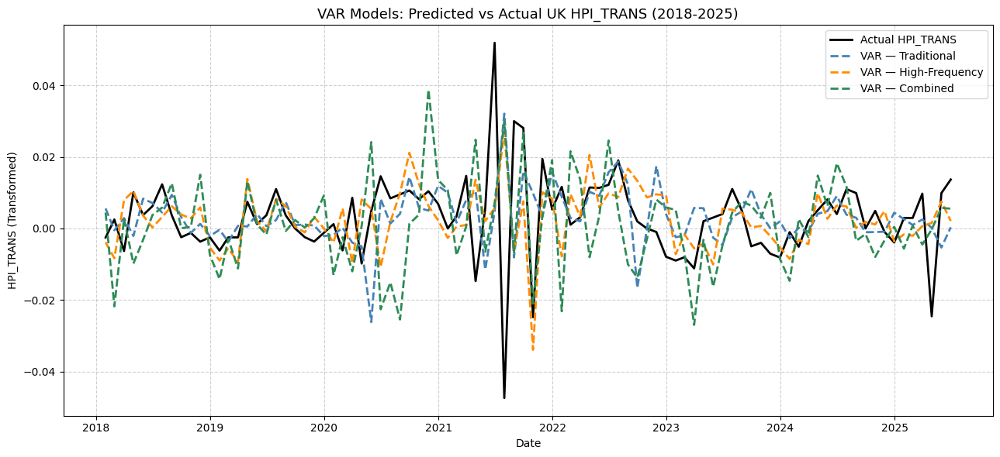

Correlation between predictions and actual HPI_TRANS:

  VAR – Traditional: -0.074
  VAR – High-Frequency: 0.116
  VAR – Combined: 0.010


In [ ]:
# Plots of Actual vs Predicted for the three specs

# Loading the stored nowcast outputs
var_trad = pd.read_csv("VAR_nowcast_traditional.csv")
var_hf   = pd.read_csv("VAR_nowcast_highfreq.csv")
var_comb = pd.read_csv("VAR_nowcast_combined.csv")

# Converting Date to datetime and set as index
for df in [var_trad, var_hf, var_comb]:
    df['Date'] = pd.to_datetime(df['Date'])
    df.set_index('Date', inplace=True)

# Identifying the prediction column names
trad_pred = [c for c in var_trad.columns if "pred" in c][0]
hf_pred   = [c for c in var_hf.columns if "pred" in c][0]
comb_pred = [c for c in var_comb.columns if "pred" in c][0]
actual    = "HPI_TRANS"

# Plot of actual vs predicted for all three VAR specifications
plt.figure(figsize=(13, 6))

# Actual series
plt.plot(var_trad.index, var_trad[actual], color="black", linewidth=2,
         label="Actual HPI_TRANS")

# Predictions from each specification
plt.plot(var_trad.index, var_trad[trad_pred], linestyle="--", linewidth=2,
         color="steelblue", label="VAR — Traditional")

plt.plot(var_hf.index, var_hf[hf_pred], linestyle="--", linewidth=2,
         color="darkorange", label="VAR — High-Frequency")

plt.plot(var_comb.index, var_comb[comb_pred], linestyle="--", linewidth=2,
         color="seagreen", label="VAR — Combined")

plt.title("VAR Models: Predicted vs Actual UK HPI_TRANS (2018-2025)", fontsize=13)
plt.xlabel("Date")
plt.ylabel("HPI_TRANS (Transformed)")
plt.grid(True, linestyle="--", alpha=0.6)
plt.legend()
plt.tight_layout()
plt.show()

# Correlations between predictions and actual values
corrs = {
    "VAR – Traditional": var_trad[trad_pred].corr(var_trad[actual]),
    "VAR – High-Frequency": var_hf[hf_pred].corr(var_hf[actual]),
    "VAR – Combined": var_comb[comb_pred].corr(var_comb[actual]),
}

print("Correlation between predictions and actual HPI_TRANS:\n")
for name, value in corrs.items():
    print(f"  {name}: {value:.3f}")


Residual Analysis

In [ ]:
from statsmodels.tsa.api import VAR
import pandas as pd

START_TEST = pd.Timestamp('2018-01-31').to_period('M').to_timestamp('M')

var_models = {}  # to store the fitted VAR model for each spec

for spec_name, predictors in VAR_SPECS.items():
    print(f"\nFitting VAR model for residual diagnostics: {spec_name}")

    # Building dataset for this spec (HPI_TRANS + predictors)
    Z = build_var_dataset(uk_stationary, predictors)

    # Using only the pre-forecast sample for model estimation
    Z_train = Z.loc[Z.index < START_TEST]

    # Using the lag length chosen earlier for this spec
    p_opt = VAR_LAG_ORDERS[spec_name]

    # Fitting VAR(p_opt) on the training sample
    model = VAR(Z_train).fit(p_opt)

    # Storing the fitted model
    var_models[spec_name] = model

    print(f"  → Fitted VAR({p_opt}) on {len(Z_train)} monthly observations.")


Fitting VAR model for residual diagnostics: traditional
  → Fitted VAR(1) on 143 monthly observations.

Fitting VAR model for residual diagnostics: highfreq
  → Fitted VAR(6) on 155 monthly observations.

Fitting VAR model for residual diagnostics: combined
  → Fitted VAR(6) on 143 monthly observations.


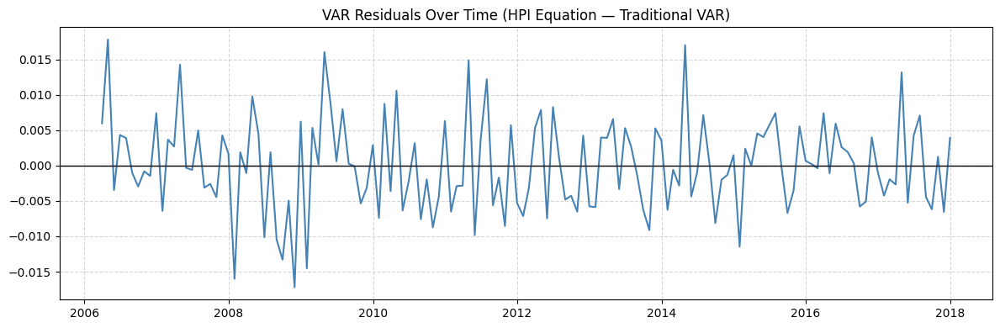

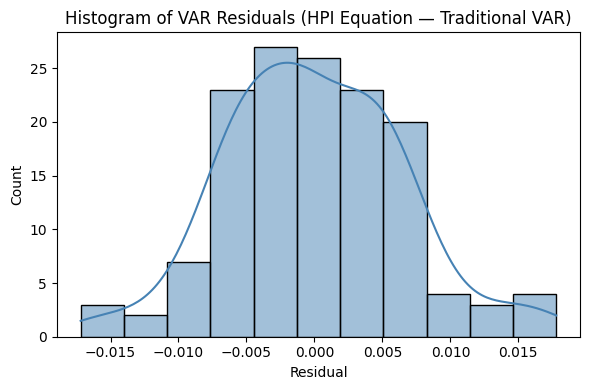

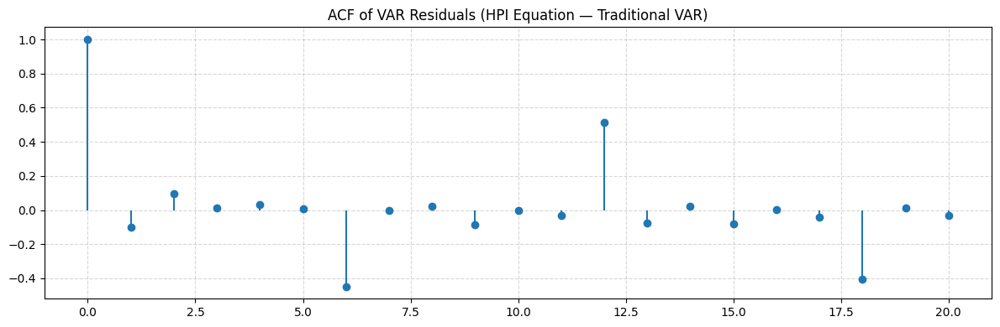


Ljung–Box Test for Autocorrelation (HPI Residuals — Traditional VAR):
       lb_stat     lb_pvalue
10   34.328837  1.624402e-04
15   78.115251  1.541760e-10
20  105.425566  1.330392e-13


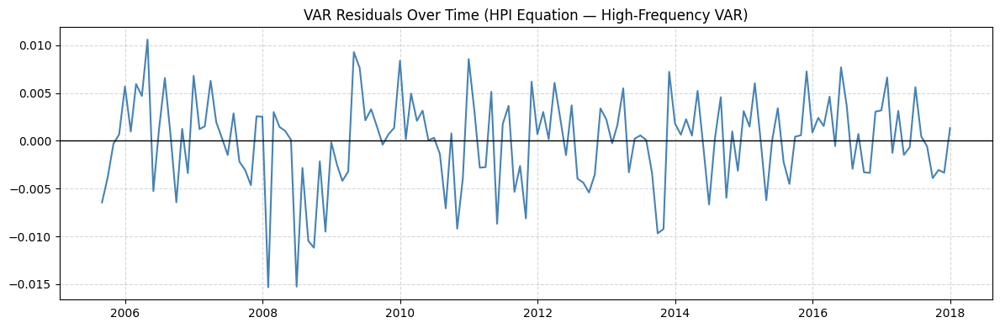

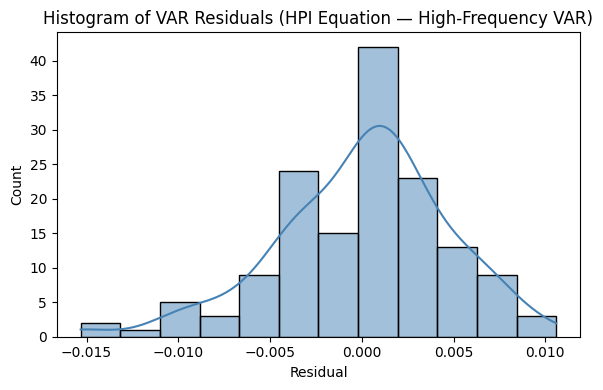

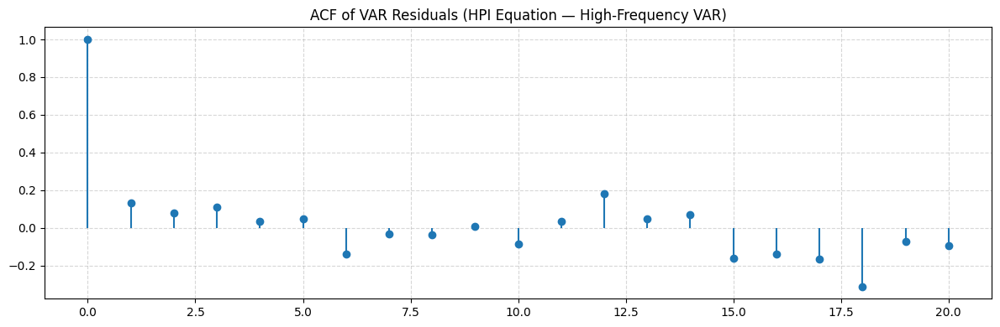


Ljung–Box Test for Autocorrelation (HPI Residuals — High-Frequency VAR):
      lb_stat  lb_pvalue
10  10.549307   0.393691
15  21.699263   0.115935
20  48.808444   0.000327


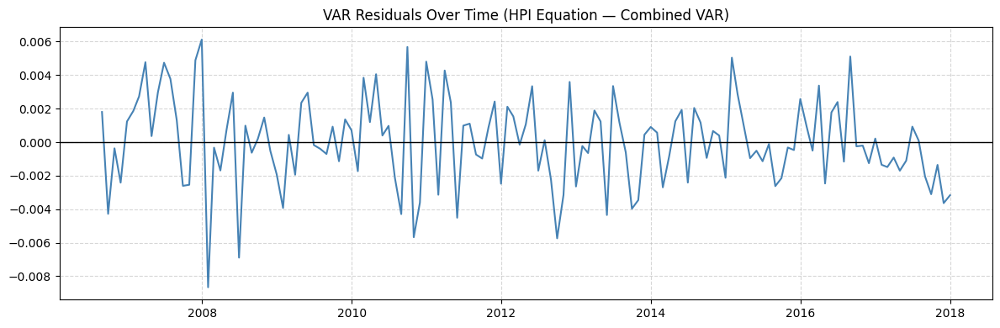

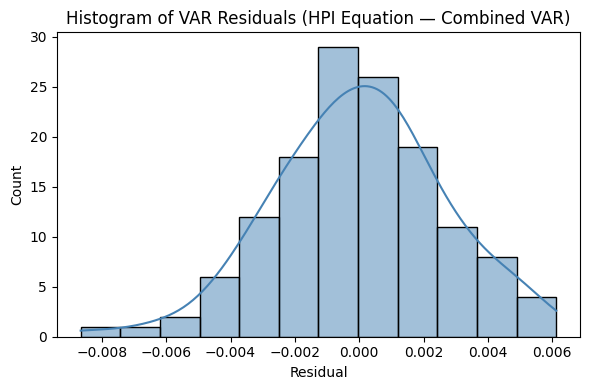

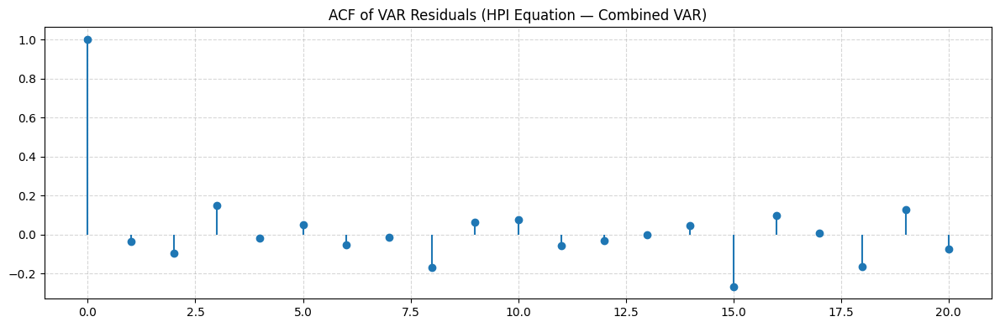


Ljung–Box Test for Autocorrelation (HPI Residuals — Combined VAR):
      lb_stat  lb_pvalue
10  11.272460   0.336689
15  23.239744   0.079181
20  32.552225   0.037758


In [ ]:
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.stats.diagnostic import acorr_ljungbox

def plot_var_residual_diagnostics(var_model, title_suffix=""):
    """Residual diagnostics for the HPI equation in a fitted VAR model."""
    # Extracting HPI residuals
    hpi_resid = var_model.resid['HPI_TRANS'].dropna()

    # Plot-2 Residuals over time
    plt.figure(figsize=(12, 4))
    plt.plot(hpi_resid, color="steelblue")
    plt.axhline(0, color='black', linewidth=1)
    plt.title(f"VAR Residuals Over Time (HPI Equation{title_suffix})")
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.tight_layout()
    plt.show()

    # Plot-3 Histogram + KDE
    plt.figure(figsize=(6, 4))
    sns.histplot(hpi_resid, kde=True, color="steelblue")
    plt.title(f"Histogram of VAR Residuals (HPI Equation{title_suffix})")
    plt.xlabel("Residual")
    plt.tight_layout()
    plt.show()

    # Plot-4 ACF
    plt.figure(figsize=(12, 4))
    acf_vals = acf(hpi_resid, nlags=20)
    plt.stem(range(len(acf_vals)), acf_vals, basefmt=" ")
    plt.title(f"ACF of VAR Residuals (HPI Equation{title_suffix})")
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.tight_layout()
    plt.show()

    # Plot-5 Ljung–Box test at a few horizons
    lb = acorr_ljungbox(hpi_resid, lags=[10, 15, 20], return_df=True)
    print(f"\nLjung–Box Test for Autocorrelation (HPI Residuals{title_suffix}):")
    print(lb)

plot_var_residual_diagnostics(var_models["traditional"], " — Traditional VAR")
plot_var_residual_diagnostics(var_models["highfreq"], " — High-Frequency VAR")
plot_var_residual_diagnostics(var_models["combined"], " — Combined VAR")

Summarising the evaluation metrics for Econometric models

In [ ]:
# Summary of evaluation metrics for ARIMA, SARIMA, VAR

results_summary = [
    {"Model": "ARIMA (2,0,5)", "Specification": "—",
     "RMSE": 0.01221, "MAE": 0.00703},

    {"Model": "SARIMA (1,0,0)(0,0,0,12)", "Specification": "—",
     "RMSE": 0.01428, "MAE": 0.00838},

    {"Model": "VAR", "Specification": "Traditional",
     "RMSE": 0.01419, "MAE": 0.00860},

    {"Model": "VAR", "Specification": "High-Frequency",
     "RMSE": 0.01337, "MAE": 0.00833},

    {"Model": "VAR", "Specification": "Combined",
     "RMSE": 0.01697, "MAE": 0.01222}
]

# Converting to a DataFrame
metrics_df = pd.DataFrame(results_summary)
metrics_df = metrics_df[["Model", "Specification", "RMSE", "MAE"]]
metrics_df = metrics_df.sort_values("RMSE").reset_index(drop=True)

# Display the summary
pd.options.display.float_format = "{:,.5f}".format
display(metrics_df)

# Save
metrics_df.to_csv("Econometric_Model_Evaluation_Summary.csv", index=False)
print("Saved: Econometric_Model_Evaluation_Summary.csv")


,Model,Specification,RMSE,MAE
0,"ARIMA (2,0,5)",—,0.01221,0.00703
1,VAR,High-Frequency,0.01337,0.00833
2,VAR,Traditional,0.01419,0.00860
3,"SARIMA (1,0,0)(0,0,0,12)",—,0.01428,0.00838
4,VAR,Combined,0.01697,0.01222


Saved: Econometric_Model_Evaluation_Summary.csv


Machine Learning Models: 1) Ridge Regression 2) Lasso Regression  
3) XGBoost 4) Random Forest

Before running any of the ML models, I will first create the rolling 60 month training window framework that will be used for nowcasting

In [ ]:
def rolling_panel_splits(all_dates, start_test, window_months=60):
    """
    Generate (train_start, train_end) and test_date for a rolling, fixed-length window.
    - Train window: last `window_months` months before each test_date.
    - Test: one month ahead (test_date).
    """
    test_dates = [d for d in all_dates if d >= start_test]
    for test_date in test_dates:
        train_end = test_date - pd.offsets.MonthBegin(1)
        train_start = train_end - pd.DateOffset(months=window_months) + pd.offsets.MonthBegin(1)
        yield (train_start, train_end), test_date

Ridge Regression

In [ ]:

import time
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

# Loading the final_ml dataset
try:
    df = final_ml.copy()
except NameError:
    df = pd.read_csv("regional_nowcast_features_lag1to6.csv")

df["Date"] = pd.to_datetime(df["Date"])
df = df.sort_values(["Date", "RegionName"]).reset_index(drop=True)

TARGET = "HPI_TRANS"
START_TEST = pd.Timestamp("2018-01-01")
WINDOW_MONTHS = 60
all_dates = sorted(df["Date"].unique())

spec_label = {
    "traditional": "Traditional",
    "highfreq": "High-Frequency",
    "combined": "Combined"
}

# Ridge model with scaling
ridge_model = Pipeline([
    ("scaler", StandardScaler()),
    ("ridge", Ridge(alpha=1.0, random_state=42))
])

ridge_results = []
ridge_nowcasts = {}

print("\nRunning Ridge regression nowcasts (rolling 60-month window)...")

for spec_key, feature_cols in FEATURE_SETS.items():
    print(f"\n--- Ridge: {spec_label.get(spec_key, spec_key)} specification ---")

    # Checking if all features are present
    missing = [c for c in feature_cols if c not in df.columns]
    if missing:
        raise ValueError(f"Missing lagged columns for '{spec_key}': {missing[:5]}")

    uk_true, uk_pred, dates_used = [], [], []
    train_times, pred_times = [], []

    t0 = time.time()

    # Expanding Rolling window framework
    for (train_start, train_end), test_date in rolling_panel_splits(
        all_dates, START_TEST, window_months=WINDOW_MONTHS
    ):
        tr_idx = (df["Date"] >= train_start) & (df["Date"] <= train_end)
        te_idx = (df["Date"] == test_date)

        train_df = df.loc[tr_idx]
        test_df  = df.loc[te_idx]

        # Require a minimum of 24 distinct months and at least one test row
        if train_df["Date"].nunique() < 24 or test_df.empty:
            continue

        X_tr, y_tr = train_df[feature_cols], train_df[TARGET]
        X_te, y_te = test_df[feature_cols], test_df[TARGET]

        # Time training
        t_train_start = time.time()
        ridge_model.fit(X_tr, y_tr)
        t_train_end = time.time()
        train_times.append(t_train_end - t_train_start)

        # Time prediction
        t_pred_start = time.time()
        preds_region = ridge_model.predict(X_te)
        t_pred_end = time.time()
        pred_times.append(t_pred_end - t_pred_start)

        # Aggregate to UK level (mean across regions)
        uk_pred.append(float(np.mean(preds_region)))
        uk_true.append(float(np.mean(y_te)))
        dates_used.append(test_date)

    total_time = time.time() - t0
    n_forecasts = len(uk_true)

    rmse, mae = eval_metrics(uk_true, uk_pred)
    print(f"Ridge [{spec_label.get(spec_key, spec_key)}] — RMSE={rmse:.5f}, MAE={mae:.5f}")

    if n_forecasts > 0:
        avg_train = float(np.mean(train_times))
        avg_pred  = float(np.mean(pred_times))
        avg_total = total_time / n_forecasts
    else:
        avg_train = avg_pred = avg_total = np.nan

    print("Computational efficiency:")
    print(f"  Total rolling-window time: {total_time:.2f} seconds")
    print(f"  Avg training time per forecast:   {avg_train:.6f} seconds")
    print(f"  Avg prediction time per forecast: {avg_pred:.6f} seconds")
    print(f"  Avg total time per forecast:      {avg_total:.6f} seconds")

    # Save UK-level nowcast
    nowcast_df = pd.DataFrame({
        "HPI_TRANS_actual_UK_mean": uk_true,
        "HPI_TRANS_pred_Ridge": uk_pred
    }, index=pd.to_datetime(dates_used))
    nowcast_df.index.name = "Date"

    fname = f"UK_nowcast_Ridge_{spec_key}_rolling{WINDOW_MONTHS}m.csv"
    nowcast_df.to_csv(fname)
    print(f"Saved: {fname}")

    ridge_nowcasts[spec_key] = nowcast_df

    ridge_results.append({
        "Model": "Ridge",
        "Specification": spec_label.get(spec_key, spec_key),
        "Window": f"Rolling {WINDOW_MONTHS} months",
        "RMSE": rmse,
        "MAE": mae,
        "TotalTime_sec": total_time,
        "AvgTrain_sec": avg_train,
        "AvgPred_sec": avg_pred,
        "AvgTotal_sec": avg_total,
        "n_forecasts": n_forecasts
    })

ridge_summary = pd.DataFrame(ridge_results).sort_values("RMSE").reset_index(drop=True)
display(ridge_summary)

ridge_summary.to_csv(f"Ridge_Evaluation_Summary_Rolling{WINDOW_MONTHS}m.csv", index=False)
print("\nSaved summary → Ridge_Evaluation_Summary_Rolling60m.csv")


Running Ridge regression nowcasts (rolling 60-month window)...

--- Ridge: Traditional specification ---
Ridge [Traditional] — RMSE=0.03522, MAE=0.01867
Computational efficiency:
  Total rolling-window time: 6.83 seconds
  Avg training time per forecast:   0.053456 seconds
  Avg prediction time per forecast: 0.003427 seconds
  Avg total time per forecast:      0.075864 seconds
Saved: UK_nowcast_Ridge_traditional_rolling60m.csv

--- Ridge: High-Frequency specification ---
Ridge [High-Frequency] — RMSE=0.00760, MAE=0.00599
Computational efficiency:
  Total rolling-window time: 4.58 seconds
  Avg training time per forecast:   0.030506 seconds
  Avg prediction time per forecast: 0.003079 seconds
  Avg total time per forecast:      0.050925 seconds
Saved: UK_nowcast_Ridge_highfreq_rolling60m.csv

--- Ridge: Combined specification ---
Ridge [Combined] — RMSE=0.00993, MAE=0.00703
Computational efficiency:
  Total rolling-window time: 9.65 seconds
  Avg training time per forecast:   0.080818 

,Model,Specification,Window,RMSE,MAE,TotalTime_sec,AvgTrain_sec,AvgPred_sec,AvgTotal_sec,n_forecasts
0,Ridge,High-Frequency,Rolling 60 months,0.00760,0.00599,4.58328,0.03051,0.00308,0.05093,90
1,Ridge,Combined,Rolling 60 months,0.00993,0.00703,9.64656,0.08082,0.00387,0.10718,90
2,Ridge,Traditional,Rolling 60 months,0.03522,0.01867,6.82776,0.05346,0.00343,0.07586,90



Saved summary → Ridge_Evaluation_Summary_Rolling60m.csv


Lasso Regression

In [ ]:
from sklearn.linear_model import Lasso

lasso_model = Pipeline([
    ("scaler", StandardScaler()),
    ("lasso", Lasso(alpha=0.0005, random_state=42, max_iter=10000))
])

lasso_results = []
lasso_nowcasts = {}

print("\nRunning Lasso regression nowcasts (rolling 60-month window)...")

for spec_key, feature_cols in FEATURE_SETS.items():
    print(f"\n--- Lasso: {spec_label.get(spec_key, spec_key)} specification ---")

    missing = [c for c in feature_cols if c not in df.columns]
    if missing:
        raise ValueError(f"Missing lagged columns for '{spec_key}': {missing[:5]}")

    uk_true, uk_pred, dates_used = [], [], []
    train_times, pred_times = [], []

    t0 = time.time()

 # Expanding Rolling window framework
    for (train_start, train_end), test_date in rolling_panel_splits(
        all_dates, START_TEST, window_months=WINDOW_MONTHS
    ):
        tr_idx = (df["Date"] >= train_start) & (df["Date"] <= train_end)
        te_idx = (df["Date"] == test_date)

        train_df = df.loc[tr_idx]
        test_df  = df.loc[te_idx]

        if train_df["Date"].nunique() < 24 or test_df.empty:
            continue

        X_tr, y_tr = train_df[feature_cols], train_df[TARGET]
        X_te, y_te = test_df[feature_cols], test_df[TARGET]

        # Time training
        t_train_start = time.time()
        lasso_model.fit(X_tr, y_tr)
        t_train_end = time.time()
        train_times.append(t_train_end - t_train_start)

        # Time prediction
        t_pred_start = time.time()
        preds_region = lasso_model.predict(X_te)
        t_pred_end = time.time()
        pred_times.append(t_pred_end - t_pred_start)

        uk_pred.append(float(np.mean(preds_region)))
        uk_true.append(float(np.mean(y_te)))
        dates_used.append(test_date)

    total_time = time.time() - t0
    n_forecasts = len(uk_true)

    rmse, mae = eval_metrics(uk_true, uk_pred)
    print(f"Lasso [{spec_label.get(spec_key, spec_key)}] — RMSE={rmse:.5f}, MAE={mae:.5f}")

    if n_forecasts > 0:
        avg_train = float(np.mean(train_times))
        avg_pred  = float(np.mean(pred_times))
        avg_total = total_time / n_forecasts
    else:
        avg_train = avg_pred = avg_total = np.nan

    print("Computational efficiency:")
    print(f"  Total rolling-window time: {total_time:.2f} seconds")
    print(f"  Avg training time per forecast:   {avg_train:.6f} seconds")
    print(f"  Avg prediction time per forecast: {avg_pred:.6f} seconds")
    print(f"  Avg total time per forecast:      {avg_total:.6f} seconds")

    # Save UK-level nowcast
    nowcast_df = pd.DataFrame({
        "HPI_TRANS_actual_UK_mean": uk_true,
        "HPI_TRANS_pred_Lasso": uk_pred
    }, index=pd.to_datetime(dates_used))
    nowcast_df.index.name = "Date"

    fname = f"UK_nowcast_Lasso_{spec_key}_rolling{WINDOW_MONTHS}m.csv"
    nowcast_df.to_csv(fname)
    print(f"Saved: {fname}")

    lasso_nowcasts[spec_key] = nowcast_df

    lasso_results.append({
        "Model": "Lasso",
        "Specification": spec_label.get(spec_key, spec_key),
        "Window": f"Rolling {WINDOW_MONTHS} months",
        "RMSE": rmse,
        "MAE": mae,
        "TotalTime_sec": total_time,
        "AvgTrain_sec": avg_train,
        "AvgPred_sec": avg_pred,
        "AvgTotal_sec": avg_total,
        "n_forecasts": n_forecasts
    })

lasso_summary = pd.DataFrame(lasso_results).sort_values("RMSE").reset_index(drop=True)
display(lasso_summary)

lasso_summary.to_csv(f"Lasso_Evaluation_Summary_Rolling{WINDOW_MONTHS}m.csv", index=False)
print("\nSaved summary → Lasso_Evaluation_Summary_Rolling60m.csv")


Running Lasso regression nowcasts (rolling 60-month window)...

--- Lasso: Traditional specification ---
Lasso [Traditional] — RMSE=0.00559, MAE=0.00458
Computational efficiency:
  Total rolling-window time: 10.09 seconds
  Avg training time per forecast:   0.085078 seconds
  Avg prediction time per forecast: 0.004036 seconds
  Avg total time per forecast:      0.112123 seconds
Saved: UK_nowcast_Lasso_traditional_rolling60m.csv

--- Lasso: High-Frequency specification ---
Lasso [High-Frequency] — RMSE=0.00533, MAE=0.00436
Computational efficiency:
  Total rolling-window time: 6.00 seconds
  Avg training time per forecast:   0.043310 seconds
  Avg prediction time per forecast: 0.003500 seconds
  Avg total time per forecast:      0.066624 seconds
Saved: UK_nowcast_Lasso_highfreq_rolling60m.csv

--- Lasso: Combined specification ---
Lasso [Combined] — RMSE=0.00558, MAE=0.00456
Computational efficiency:
  Total rolling-window time: 13.29 seconds
  Avg training time per forecast:   0.12244

,Model,Specification,Window,RMSE,MAE,TotalTime_sec,AvgTrain_sec,AvgPred_sec,AvgTotal_sec,n_forecasts
0,Lasso,High-Frequency,Rolling 60 months,0.00533,0.00436,5.99620,0.04331,0.00350,0.06662,90
1,Lasso,Combined,Rolling 60 months,0.00558,0.00456,13.29459,0.12245,0.00376,0.14772,90
2,Lasso,Traditional,Rolling 60 months,0.00559,0.00458,10.09104,0.08508,0.00404,0.11212,90



Saved summary → Lasso_Evaluation_Summary_Rolling60m.csv


Analysing Feature Importance

In [ ]:
import re

# Splitting "CPI_TRANS_lag3" -> ("CPI_TRANS", 3)
def parse_base_and_lag(feature_name: str):
    """
    Take a feature like 'CPI_TRANS_lag3' and split it into:
    - base variable: 'CPI_TRANS'
    - lag number:    3
    """
    m = re.search(r"^(.*)_lag(\d+)$", feature_name)
    if m:
        return m.group(1), int(m.group(2))
    else:
        # if the pattern doesn't match, treat the whole thing as the base
        return feature_name, None


def coef_table_from_pipeline(pipeline, feature_names, step_name: str):
    """
    Extract a tidy coefficient table from a fitted Pipeline.
    step_name should be 'ridge' or 'lasso' depending on the model.
    """
    coefs = pipeline.named_steps[step_name].coef_
    tab = pd.DataFrame({
        "feature": feature_names,
        "coef": coefs
    })
    tab["abs_coef"] = tab["coef"].abs()

    # Split into base variable and lag
    base_lag = tab["feature"].apply(parse_base_and_lag)
    tab["base"] = base_lag.apply(lambda t: t[0])
    tab["lag"]  = base_lag.apply(lambda t: t[1])

    # Sort by absolute importance
    return tab.sort_values("abs_coef", ascending=False)

In [ ]:
# Now I will refit the Ridge and Lasso models on the entire sample ending in June 2025

# Using the full regional ML dataset
try:
    df_feat = final_ml.copy()
except NameError:
    df_feat = pd.read_csv("regional_nowcast_features_lag1to6.csv")

df_feat["Date"] = pd.to_datetime(df_feat["Date"])
df_feat = df_feat.sort_values(["Date", "RegionName"]).reset_index(drop=True)

TARGET = "HPI_TRANS"
FINAL_END = pd.Timestamp("2025-06-01")

# Labels
spec_labels = {
    "traditional": "Traditional",
    "highfreq": "High-Frequency",
    "combined": "Combined"
}

# Store fitted models and feature names
ridge_fits = {}
lasso_fits = {}
feature_lists = {}

for spec_key, feature_cols in FEATURE_SETS.items():
    print(f"\nRefitting Ridge and Lasso on full sample up to {FINAL_END.date()} — {spec_labels.get(spec_key, spec_key)} spec")

    # Training sample: all observations before FINAL_END
    mask_train = df_feat["Date"] < FINAL_END
    X_tr = df_feat.loc[mask_train, feature_cols]
    y_tr = df_feat.loc[mask_train, TARGET]

    # Ridge pipeline (scaled)
    ridge_pipe = Pipeline([
        ("scaler", StandardScaler()),
        ("ridge", Ridge(alpha=1.0, random_state=42))
    ])
    ridge_pipe.fit(X_tr, y_tr)

    # Lasso pipeline (scaled)
    lasso_pipe = Pipeline([
        ("scaler", StandardScaler()),
        ("lasso", Lasso(alpha=0.0005, random_state=42, max_iter=10000))
    ])
    lasso_pipe.fit(X_tr, y_tr)

    ridge_fits[spec_key] = ridge_pipe
    lasso_fits[spec_key] = lasso_pipe
    feature_lists[spec_key] = feature_cols

print("\nFinished refitting Ridge and Lasso for all three specifications.")


Refitting Ridge and Lasso on full sample up to 2025-06-01 — Traditional spec

Refitting Ridge and Lasso on full sample up to 2025-06-01 — High-Frequency spec

Refitting Ridge and Lasso on full sample up to 2025-06-01 — Combined spec

Finished refitting Ridge and Lasso for all three specifications.



Ridge — Traditional: Top 15 base predictors (standardised coefficients)


,base,total_abs_importance,signed_sum
6,MortgageRate_TRANS,0.00681,0.00602
1,BankRate_TRANS,0.00538,-0.00454
7,UnemploymentRate_TRANS,0.00517,-0.00517
5,MortgageApprovals_TRANS,0.00458,0.00458
4,ConsumerConfidence_TRANS,0.00419,0.00419
3,ConstructionCost_Index_TRANS,0.00341,0.00278
0,AW_Regular_Earnings_TRANS,0.00122,0.00102
2,CPI_TRANS,0.00105,-0.00076


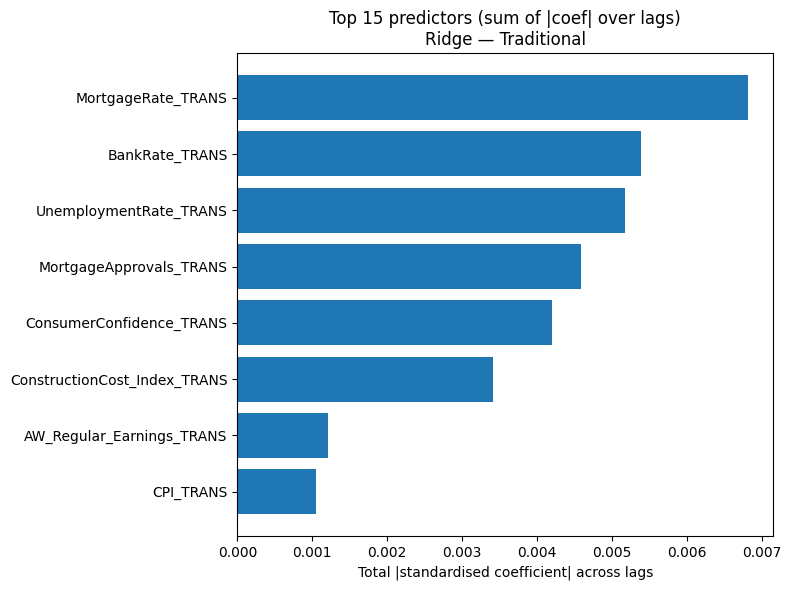


Lasso — Traditional: Top 15 base predictors (standardised coefficients)


,base,total_abs_importance,signed_sum
6,MortgageRate_TRANS,0.00343,0.00246
7,UnemploymentRate_TRANS,0.00192,-0.00192
4,ConsumerConfidence_TRANS,0.00149,0.00149
3,ConstructionCost_Index_TRANS,0.00131,0.00131
5,MortgageApprovals_TRANS,0.00099,0.00099
1,BankRate_TRANS,0.00075,-0.00032
2,CPI_TRANS,0.00000,0.00000
0,AW_Regular_Earnings_TRANS,0.00000,0.00000


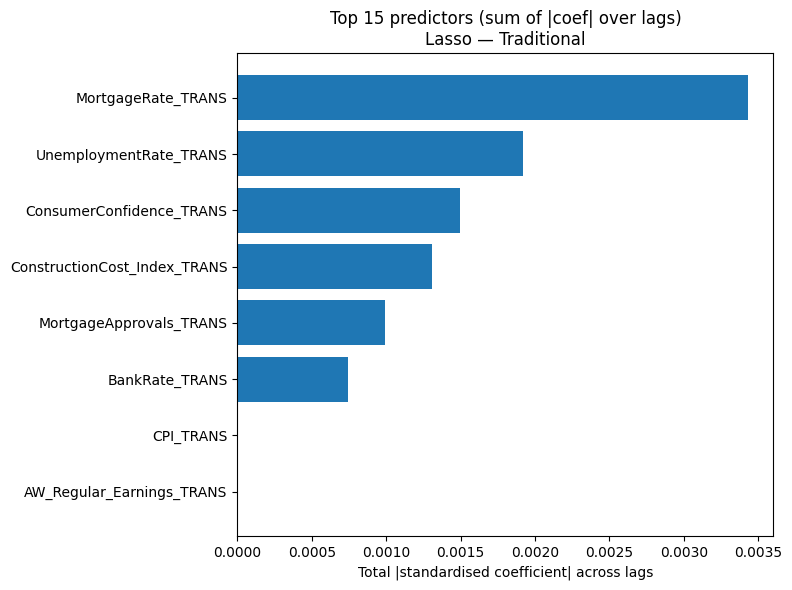


Ridge — High-Frequency: Top 15 base predictors (standardised coefficients)


,base,total_abs_importance,signed_sum
1,GT_demand_TRANS,0.00652,0.00652
3,GT_marketawareness_TRANS,0.00566,0.00566
2,GT_economicpolicy_TRANS,0.00471,-0.00016
4,GT_mortgage_financing_TRANS,0.00469,0.00215
5,GT_renting_affordability_TRANS,0.00218,-0.00112
0,GDELT_average_news_tone_normalized_TRANS,0.00166,-0.00155


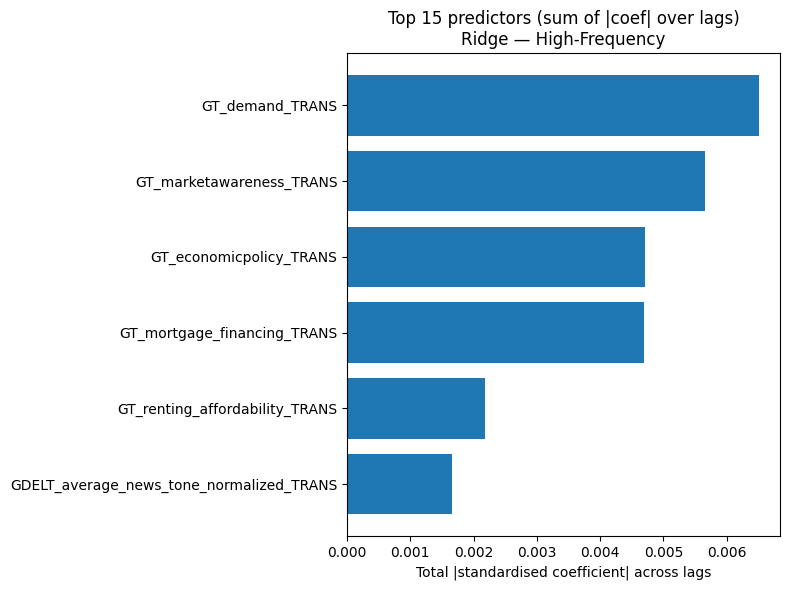


Lasso — High-Frequency: Top 15 base predictors (standardised coefficients)


,base,total_abs_importance,signed_sum
1,GT_demand_TRANS,0.00275,0.00275
0,GDELT_average_news_tone_normalized_TRANS,0.00122,-0.00122
3,GT_marketawareness_TRANS,0.00020,0.00020
2,GT_economicpolicy_TRANS,0.00000,0.00000
4,GT_mortgage_financing_TRANS,0.00000,0.00000
5,GT_renting_affordability_TRANS,0.00000,0.00000


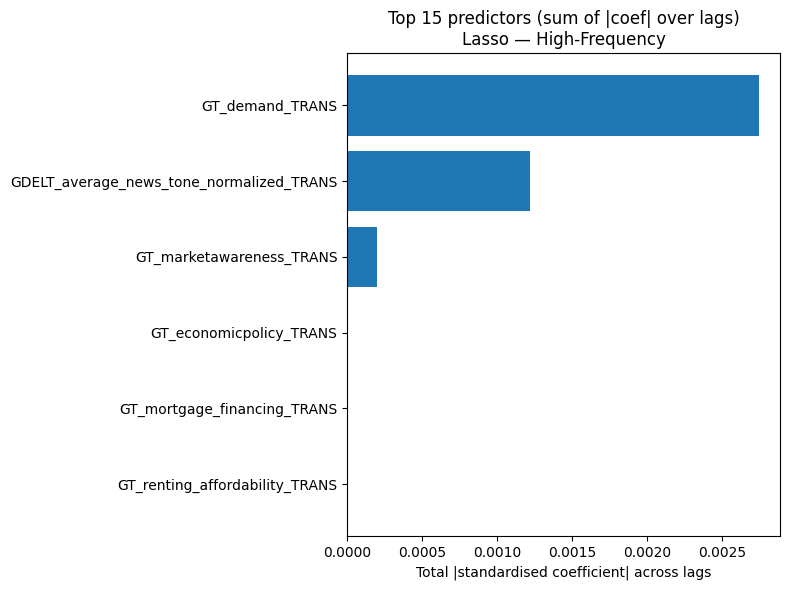


Ridge — Combined: Top 15 base predictors (standardised coefficients)


,base,total_abs_importance,signed_sum
6,GT_demand_TRANS,0.00700,0.00700
12,MortgageRate_TRANS,0.00648,0.00648
7,GT_economicpolicy_TRANS,0.00485,0.00190
11,MortgageApprovals_TRANS,0.00475,0.00439
13,UnemploymentRate_TRANS,0.00469,-0.00469
9,GT_mortgage_financing_TRANS,0.00460,0.00274
4,ConsumerConfidence_TRANS,0.00453,0.00453
10,GT_renting_affordability_TRANS,0.00394,0.00221
3,ConstructionCost_Index_TRANS,0.00383,0.00382
1,BankRate_TRANS,0.00382,-0.00351


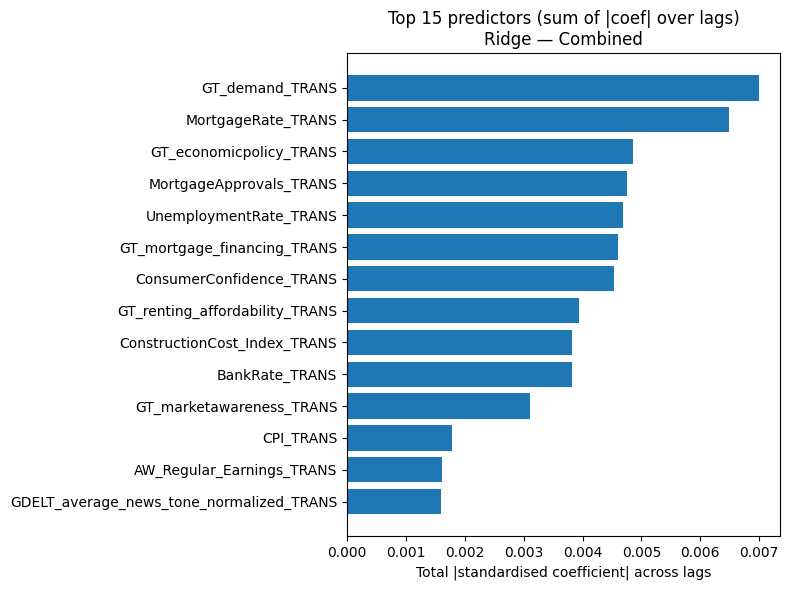


Lasso — Combined: Top 15 base predictors (standardised coefficients)


,base,total_abs_importance,signed_sum
12,MortgageRate_TRANS,0.00279,0.00217
13,UnemploymentRate_TRANS,0.00184,-0.00184
6,GT_demand_TRANS,0.00173,0.00173
3,ConstructionCost_Index_TRANS,0.00109,0.00109
4,ConsumerConfidence_TRANS,0.00108,0.00108
1,BankRate_TRANS,0.00091,-0.00036
5,GDELT_average_news_tone_normalized_TRANS,0.00076,-0.00076
11,MortgageApprovals_TRANS,0.00067,0.00067
7,GT_economicpolicy_TRANS,0.00014,0.00014
0,AW_Regular_Earnings_TRANS,0.00000,0.00000


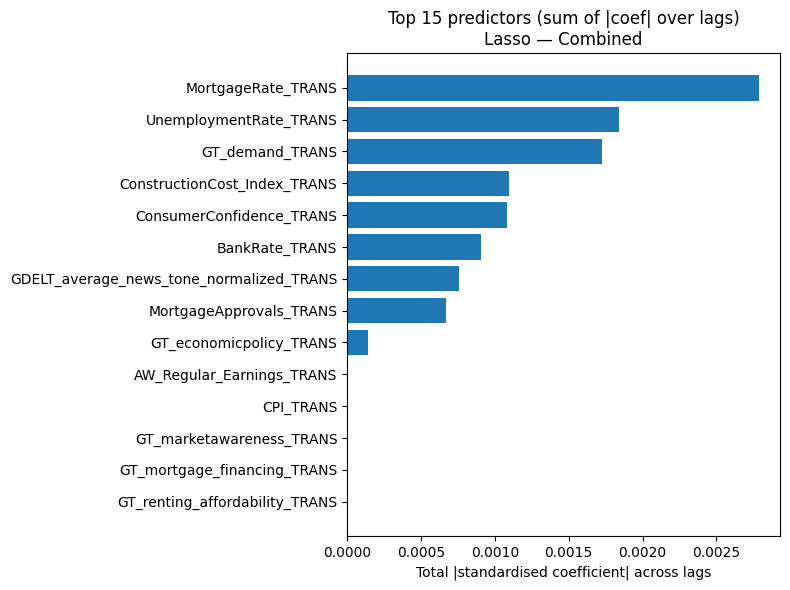

In [ ]:
# Importance Table and Plots for each model and specifications
importance_tables = {}

for spec_key in FEATURE_SETS.keys():
    spec_name = spec_labels.get(spec_key, spec_key)
    feats = feature_lists[spec_key]

    # Ridge Regression
    ridge_tab = coef_table_from_pipeline(ridge_fits[spec_key], feats, step_name="ridge")

    # Aggregating across the lags: total absolute importance per base variable
    ridge_by_base = (
        ridge_tab
        .groupby("base", as_index=False)
        .agg(total_abs_importance=("abs_coef", "sum"),
             signed_sum=("coef", "sum"))
        .sort_values("total_abs_importance", ascending=False)
    )

    print(f"\nRidge — {spec_name}: Top 15 base predictors (standardised coefficients)")
    display(ridge_by_base.head(15))

    # Plot
    top_ridge = ridge_by_base.head(15).iloc[::-1]
    plt.figure(figsize=(8, 6))
    plt.barh(top_ridge["base"], top_ridge["total_abs_importance"])
    plt.title(f"Top 15 predictors (sum of |coef| over lags)\nRidge — {spec_name}")
    plt.xlabel("Total |standardised coefficient| across lags")
    plt.tight_layout()
    plt.show()

    importance_tables[( "Ridge", spec_key )] = ridge_tab

    # Lasso Regression
    lasso_tab = coef_table_from_pipeline(lasso_fits[spec_key], feats, step_name="lasso")

    lasso_by_base = (
        lasso_tab
        .groupby("base", as_index=False)
        .agg(total_abs_importance=("abs_coef", "sum"),
             signed_sum=("coef", "sum"))
        .sort_values("total_abs_importance", ascending=False)
    )

    print(f"\nLasso — {spec_name}: Top 15 base predictors (standardised coefficients)")
    display(lasso_by_base.head(15))

    top_lasso = lasso_by_base.head(15).iloc[::-1]
    plt.figure(figsize=(8, 6))
    plt.barh(top_lasso["base"], top_lasso["total_abs_importance"])
    plt.title(f"Top 15 predictors (sum of |coef| over lags)\nLasso — {spec_name}")
    plt.xlabel("Total |standardised coefficient| across lags")
    plt.tight_layout()
    plt.show()

    importance_tables[( "Lasso", spec_key )] = lasso_tab

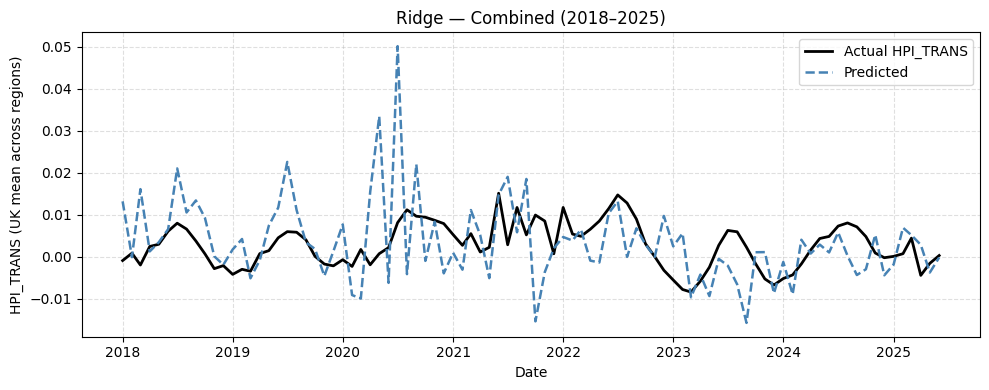

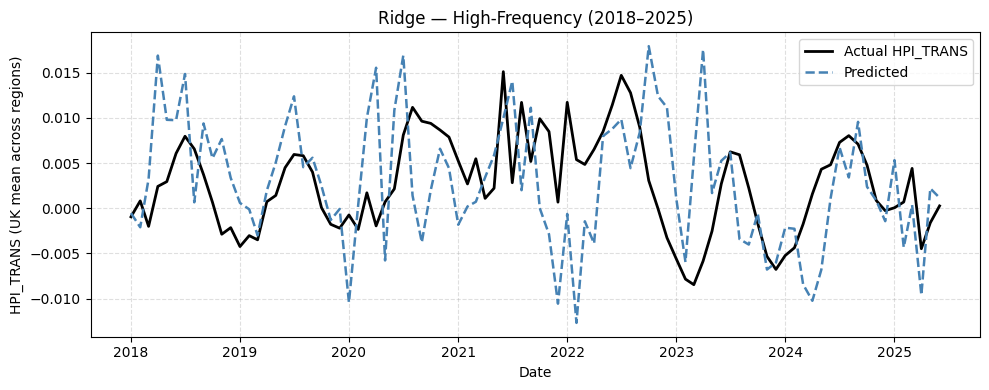

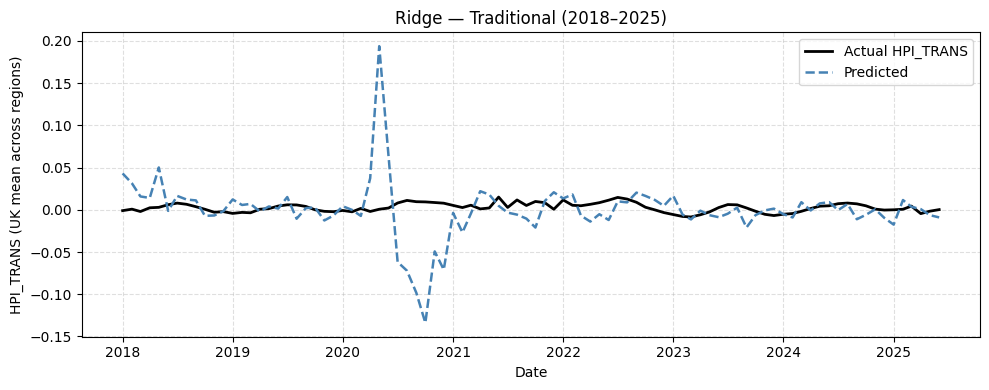

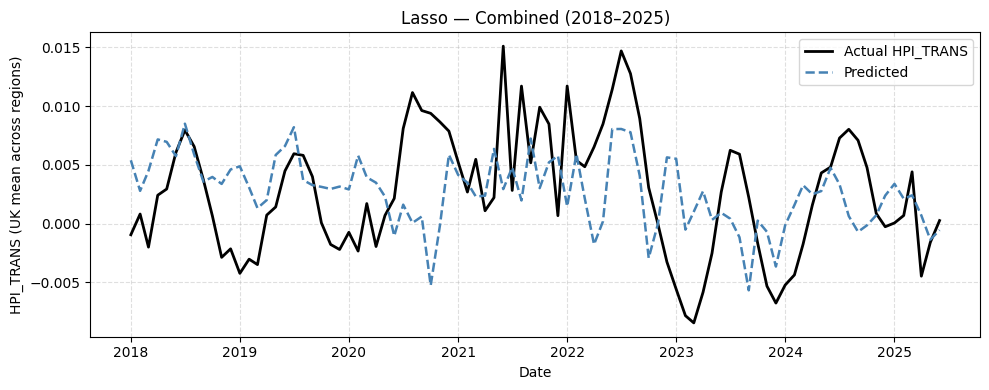

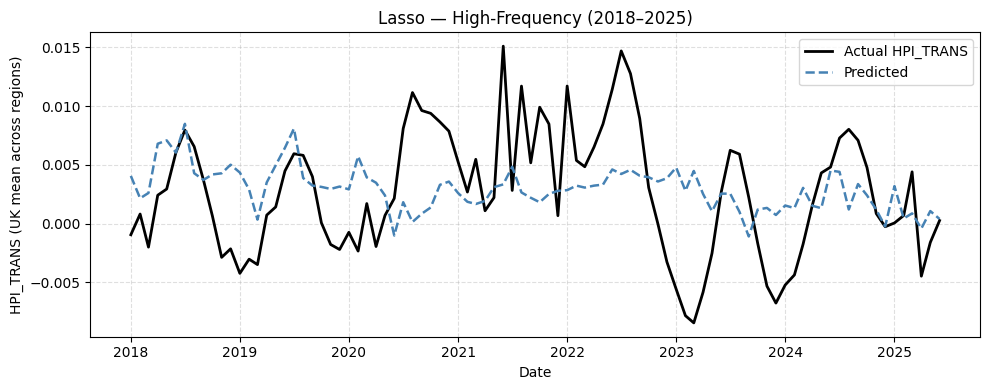

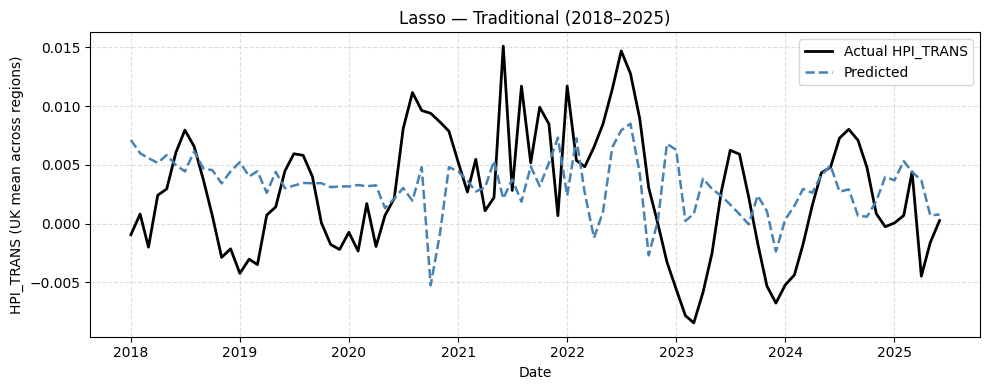

In [ ]:
# Plot of predicted vs actual HPI for Ridge and Lasso (by specification)
# Loading model outputs and standardising the column names
def load_nowcast_csv(path, model_name, spec_name):
    df = pd.read_csv(path)

    # Date column or index
    if "Date" in df.columns:
        df["Date"] = pd.to_datetime(df["Date"])
        df = df.set_index("Date").sort_index()
    else:
        df.index = pd.to_datetime(df.index)
        df = df.sort_index()

    # Identify predicted and actual columns
    true_col = [c for c in df.columns if "true" in c.lower() or "hpi_trans" in c.lower()][0]
    pred_col = [c for c in df.columns if "pred" in c.lower()][0]

    # Standardise names
    df = df[[true_col, pred_col]].rename(columns={
        true_col: "y_true",
        pred_col: "y_pred"
    })

    df["Model"] = model_name
    df["Spec"] = spec_name
    return df

# Loading the nowcasts
ridge_trad = load_nowcast_csv("UK_nowcast_Ridge_traditional_rolling60m.csv", "Ridge", "Traditional")
ridge_hf   = load_nowcast_csv("UK_nowcast_Ridge_highfreq_rolling60m.csv", "Ridge", "High-Frequency")
ridge_comb = load_nowcast_csv("UK_nowcast_Ridge_combined_rolling60m.csv", "Ridge", "Combined")

lasso_trad = load_nowcast_csv("UK_nowcast_Lasso_traditional_rolling60m.csv", "Lasso", "Traditional")
lasso_hf   = load_nowcast_csv("UK_nowcast_Lasso_highfreq_rolling60m.csv", "Lasso", "High-Frequency")
lasso_comb = load_nowcast_csv("UK_nowcast_Lasso_combined_rolling60m.csv", "Lasso", "Combined")

# Merge everything
df_all = pd.concat([
    ridge_trad, ridge_hf, ridge_comb,
    lasso_trad, lasso_hf, lasso_comb
])

# Sorting the Date index to Datetimeindex
df_all = df_all.sort_index()

# Restrict to 2018–2025
df_all = df_all.loc["2018-01-01":"2025-12-31"]

def plot_model_nowcasts(df, model_name):
    """
    Plot actual vs predicted HPI (2018–2025) for each specification
    of a given model (Ridge or Lasso).
    """
    for spec in sorted(df["Spec"].unique()):
        sub = df[(df["Model"] == model_name) & (df["Spec"] == spec)]
        if sub.empty:
            continue

        plt.figure(figsize=(10, 4))
        plt.plot(sub.index, sub["y_true"], label="Actual HPI_TRANS", color="black", linewidth=2)
        plt.plot(sub.index, sub["y_pred"], label="Predicted", linestyle="--", color="steelblue", linewidth=1.8)
        plt.title(f"{model_name} — {spec} (2018–2025)")
        plt.xlabel("Date")
        plt.ylabel("HPI_TRANS (UK mean across regions)")
        plt.grid(True, linestyle="--", alpha=0.4)
        plt.legend()
        plt.tight_layout()
        plt.show()

# Produce plots
plot_model_nowcasts(df_all, "Ridge")
plot_model_nowcasts(df_all, "Lasso")

XGBoost

In [ ]:

from xgboost import XGBRegressor

# Loading the final_ml dataset
try:
    df = final_ml.copy()
except NameError:
    df = pd.read_csv("regional_nowcast_features_lag1to6.csv")

df["Date"] = pd.to_datetime(df["Date"])
df = df.sort_values(["Date", "RegionName"]).reset_index(drop=True)

TARGET = "HPI_TRANS"

spec_label = {
    "traditional": "Traditional",
    "highfreq": "High-Frequency",
    "combined": "Combined",
}

all_dates     = sorted(df["Date"].unique())
START_TEST    = pd.Timestamp("2018-01-01")
WINDOW_MONTHS = 60

xgb_results  = []
xgb_nowcasts = {}

# Loop over each XGBoost specification
for spec_key, feature_cols in FEATURE_SETS.items():
    print(f"\n=== XGBoost — {spec_label.get(spec_key, spec_key)} specification ===")

    # Checking that all required features exist
    missing = [c for c in feature_cols if c not in df.columns]
    if missing:
        raise ValueError(f"Missing lagged features for spec '{spec_key}': {missing[:5]} ...")

    # XGBoost configuration for the three specifications
    xgb_model = XGBRegressor(
        n_estimators=500,
        learning_rate=0.05,
        max_depth=5,
        subsample=0.8,
        colsample_bytree=0.8,
        objective="reg:squarederror",
        random_state=42,
        n_jobs=-1,
    )

    uk_true, uk_pred, dates_used = [], [], []
    train_times, pred_times      = [], []

    t_total_start = time.time()

    # Rolling 60-month window framework
    for (train_start, train_end), test_date in rolling_panel_splits(
        all_dates, start_test=START_TEST, window_months=WINDOW_MONTHS
    ):
        tr_mask = (df["Date"] >= train_start) & (df["Date"] <= train_end)
        te_mask = (df["Date"] == test_date)

        train_df = df.loc[tr_mask]
        test_df  = df.loc[te_mask]

        # Require enough history and a non-empty test month
        if train_df["Date"].nunique() < 24 or test_df.empty:
            continue

        X_tr, y_tr = train_df[feature_cols], train_df[TARGET]
        X_te, y_te = test_df[feature_cols], test_df[TARGET]

        # Measure training time
        t_fit_start = time.time()
        xgb_model.fit(X_tr, y_tr)
        t_fit_end   = time.time()
        train_times.append(t_fit_end - t_fit_start)

        # Measure prediction time
        t_pred_start = time.time()
        preds_region = xgb_model.predict(X_te)
        t_pred_end   = time.time()
        pred_times.append(t_pred_end - t_pred_start)

        # Aggregate regional predictions to UK level
        uk_pred.append(float(np.mean(preds_region)))
        uk_true.append(float(np.mean(y_te.values)))
        dates_used.append(test_date)

    t_total_end = time.time()
    total_time  = t_total_end - t_total_start
    n_forecasts = len(uk_true)

    # Evaluation metrics for Forecast accuracy
    rmse, mae = eval_metrics(uk_true, uk_pred)
    print(f"XGBoost [{spec_label.get(spec_key, spec_key)}] — RMSE={rmse:.5f}, MAE={mae:.5f}")

    # Computational efficiency
    if n_forecasts > 0:
        avg_train = float(np.mean(train_times))
        avg_pred  = float(np.mean(pred_times))
        avg_total = float(total_time / n_forecasts)
    else:
        avg_train = avg_pred = avg_total = np.nan

    print(f"XGBoost computational efficiency [{spec_label.get(spec_key, spec_key)}]:")
    print(f"  Total rolling-window time:       {total_time:.2f} seconds")
    print(f"  Avg training time per forecast:  {avg_train:.6f} seconds")
    print(f"  Avg prediction time per forecast:{avg_pred:.6f} seconds")
    print(f"  Avg total time per forecast:     {avg_total:.6f} seconds")

    xgb_results.append({
        "Model": "XGBoost",
        "Specification": spec_label.get(spec_key, spec_key),
        "Window": f"Rolling-{WINDOW_MONTHS}m",
        "RMSE": rmse,
        "MAE": mae,
        "TotalTime_sec": total_time,
        "AvgTrain_sec": avg_train,
        "AvgPred_sec": avg_pred,
        "AvgTotal_sec": avg_total,
        "n_forecasts": n_forecasts,
    })

    # Saving UK-level nowcast series
    nowcast_df = pd.DataFrame({
        "HPI_TRANS_actual_UK_mean": uk_true,
        "HPI_TRANS_pred_XGB": uk_pred,
    }, index=pd.to_datetime(dates_used))
    nowcast_df.index.name = "Date"

    fname = f"UK_nowcast_XGB_{spec_key}_rolling{WINDOW_MONTHS}m.csv"
    nowcast_df.to_csv(fname)
    print(f"Saved: {fname}")

    xgb_nowcasts[spec_key] = nowcast_df

# Summary table for the three specifications
xgb_summary = (
    pd.DataFrame(xgb_results)
    .sort_values("RMSE")
    .reset_index(drop=True)
)

display(xgb_summary)

summary_name = f"XGBoost_Evaluation_Summary_Rolling{WINDOW_MONTHS}m.csv"
xgb_summary.to_csv(summary_name, index=False)
print(f"Saved evaluation summary: {summary_name}")


=== XGBoost — Traditional specification ===
XGBoost [Traditional] — RMSE=0.00524, MAE=0.00421
XGBoost computational efficiency [Traditional]:
  Total rolling-window time:       226.48 seconds
  Avg training time per forecast:  2.483715 seconds
  Avg prediction time per forecast:0.013768 seconds
  Avg total time per forecast:     2.516451 seconds
Saved: UK_nowcast_XGB_traditional_rolling60m.csv

=== XGBoost — High-Frequency specification ===
XGBoost [High-Frequency] — RMSE=0.00502, MAE=0.00418
XGBoost computational efficiency [High-Frequency]:
  Total rolling-window time:       176.66 seconds
  Avg training time per forecast:  1.931602 seconds
  Avg prediction time per forecast:0.012571 seconds
  Avg total time per forecast:     1.962864 seconds
Saved: UK_nowcast_XGB_highfreq_rolling60m.csv

=== XGBoost — Combined specification ===
XGBoost [Combined] — RMSE=0.00509, MAE=0.00415
XGBoost computational efficiency [Combined]:
  Total rolling-window time:       354.88 seconds
  Avg training

,Model,Specification,Window,RMSE,MAE,TotalTime_sec,AvgTrain_sec,AvgPred_sec,AvgTotal_sec,n_forecasts
0,XGBoost,High-Frequency,Rolling-60m,0.00502,0.00418,176.65773,1.93160,0.01257,1.96286,90
1,XGBoost,Combined,Rolling-60m,0.00509,0.00415,354.88226,3.89681,0.02502,3.94314,90
2,XGBoost,Traditional,Rolling-60m,0.00524,0.00421,226.48062,2.48372,0.01377,2.51645,90


Saved evaluation summary: XGBoost_Evaluation_Summary_Rolling60m.csv


Analysis of Feature Importance



=== XGBoost gain importance — Traditional specification ===
Training window: 2020-06-01 to 2025-05-01
Number of rows in training window: 24300
Number of predictors: 48

Top 20 lagged features by gain:


,gain
CPI_TRANS_lag5,0.00744
MortgageRate_TRANS_lag2,0.00677
MortgageRate_TRANS_lag1,0.00605
ConstructionCost_Index_TRANS_lag6,0.00358
MortgageApprovals_TRANS_lag1,0.00350
CPI_TRANS_lag3,0.00287
MortgageRate_TRANS_lag5,0.00213
MortgageRate_TRANS_lag4,0.00199
MortgageApprovals_TRANS_lag2,0.00169
UnemploymentRate_TRANS_lag5,0.00140



Top 15 base variables by total gain:


,total_gain
MortgageRate_TRANS,0.01836
CPI_TRANS,0.01297
ConstructionCost_Index_TRANS,0.00869
MortgageApprovals_TRANS,0.00796
UnemploymentRate_TRANS,0.00350
ConsumerConfidence_TRANS,0.00308
BankRate_TRANS,0.00249
AW_Regular_Earnings_TRANS,0.00175


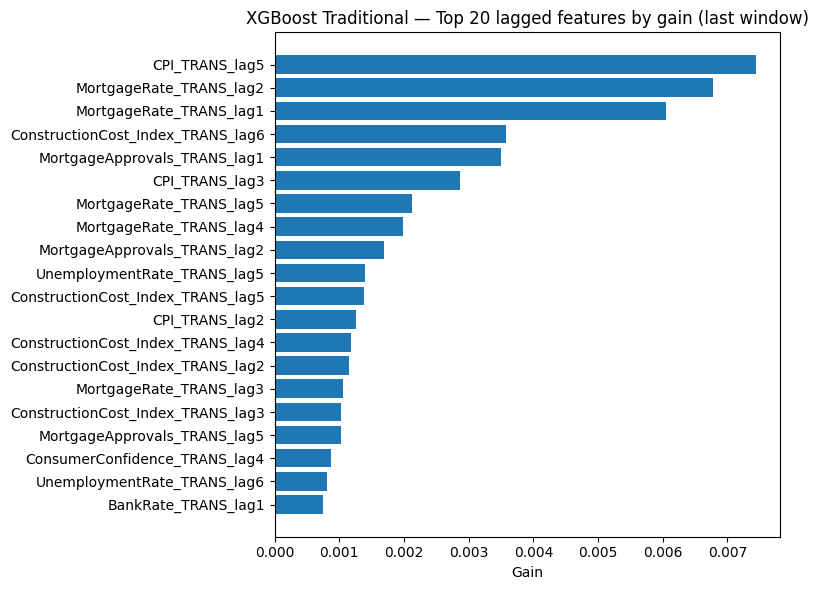

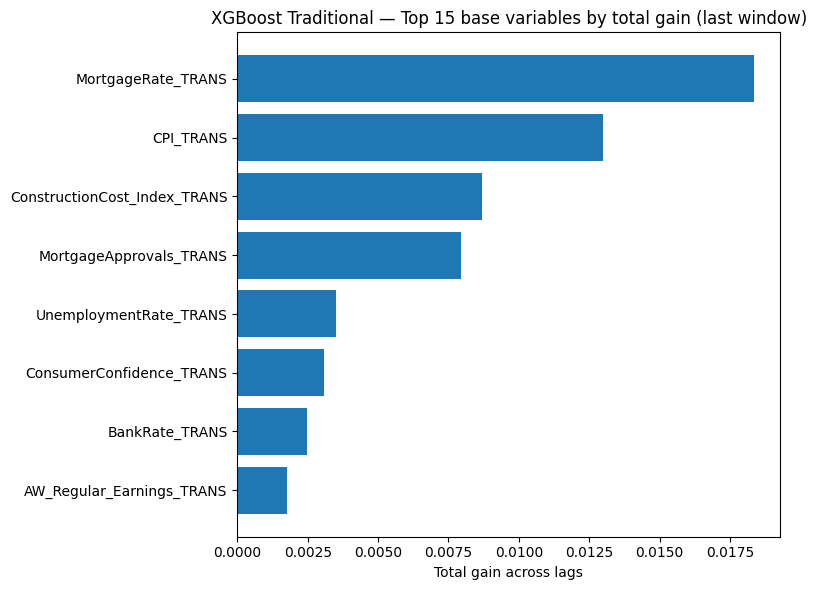

Saved: XGB_gain_feature_traditional_lastwindow.csv and XGB_gain_base_traditional_lastwindow.csv

=== XGBoost gain importance — High-Frequency specification ===
Training window: 2020-06-01 to 2025-05-01
Number of rows in training window: 24300
Number of predictors: 36

Top 20 lagged features by gain:


,gain
GDELT_average_news_tone_normalized_TRANS_lag5,0.00982
GT_renting_affordability_TRANS_lag6,0.00669
GT_renting_affordability_TRANS_lag3,0.00251
GT_mortgage_financing_TRANS_lag4,0.00240
GT_economicpolicy_TRANS_lag2,0.00184
GDELT_average_news_tone_normalized_TRANS_lag2,0.00156
GDELT_average_news_tone_normalized_TRANS_lag4,0.00127
GT_renting_affordability_TRANS_lag5,0.00116
GT_marketawareness_TRANS_lag3,0.00113
GDELT_average_news_tone_normalized_TRANS_lag6,0.00113



Top 15 base variables by total gain:


,total_gain
GDELT_average_news_tone_normalized_TRANS,0.01475
GT_renting_affordability_TRANS,0.01221
GT_mortgage_financing_TRANS,0.00566
GT_economicpolicy_TRANS,0.00546
GT_marketawareness_TRANS,0.00455
GT_demand_TRANS,0.00203


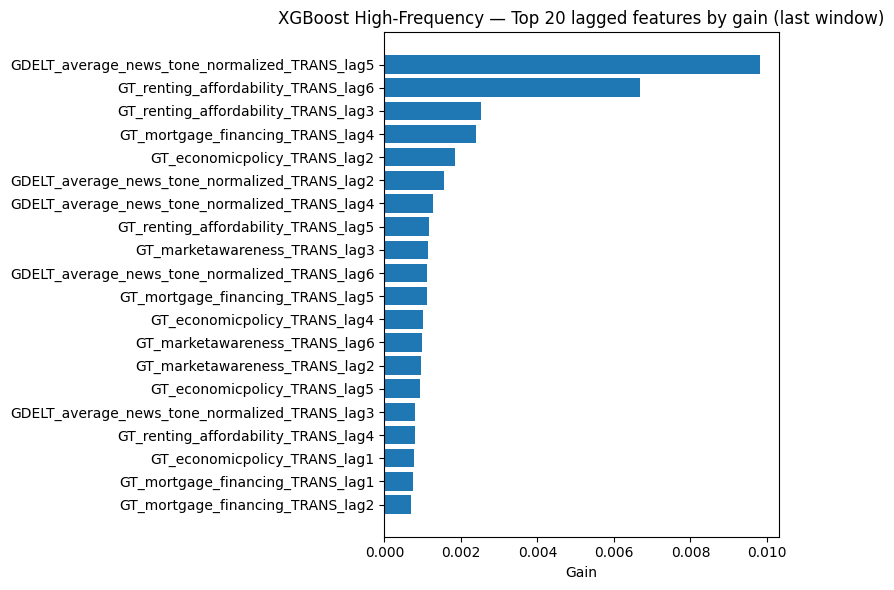

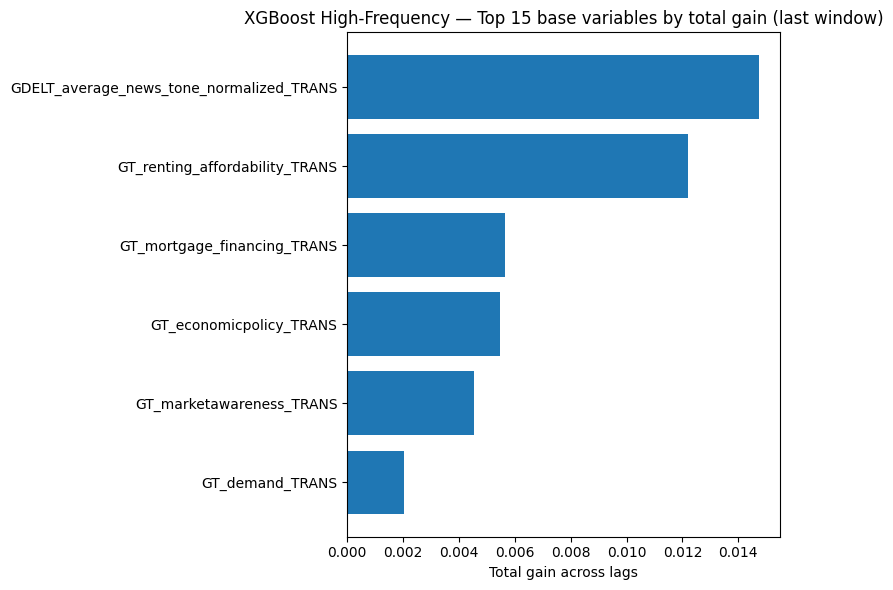

Saved: XGB_gain_feature_highfreq_lastwindow.csv and XGB_gain_base_highfreq_lastwindow.csv

=== XGBoost gain importance — Combined specification ===
Training window: 2020-06-01 to 2025-05-01
Number of rows in training window: 24300
Number of predictors: 84

Top 20 lagged features by gain:


,gain
GDELT_average_news_tone_normalized_TRANS_lag5,0.01969
MortgageApprovals_TRANS_lag4,0.00861
GT_renting_affordability_TRANS_lag3,0.00791
CPI_TRANS_lag5,0.00456
MortgageRate_TRANS_lag1,0.00423
MortgageApprovals_TRANS_lag5,0.00286
GDELT_average_news_tone_normalized_TRANS_lag4,0.00244
GT_economicpolicy_TRANS_lag2,0.00237
GT_demand_TRANS_lag6,0.00232
ConstructionCost_Index_TRANS_lag5,0.00232



Top 15 base variables by total gain:


,total_gain
GDELT_average_news_tone_normalized_TRANS,0.02540
MortgageApprovals_TRANS,0.01410
GT_renting_affordability_TRANS,0.01118
MortgageRate_TRANS,0.00842
CPI_TRANS,0.00627
ConstructionCost_Index_TRANS,0.00603
ConsumerConfidence_TRANS,0.00560
GT_economicpolicy_TRANS,0.00556
BankRate_TRANS,0.00528
GT_demand_TRANS,0.00427


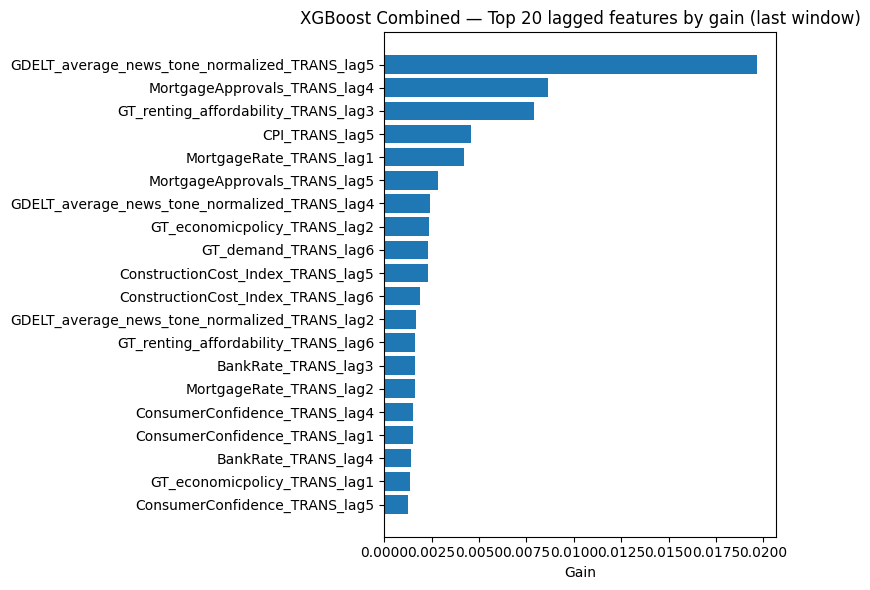

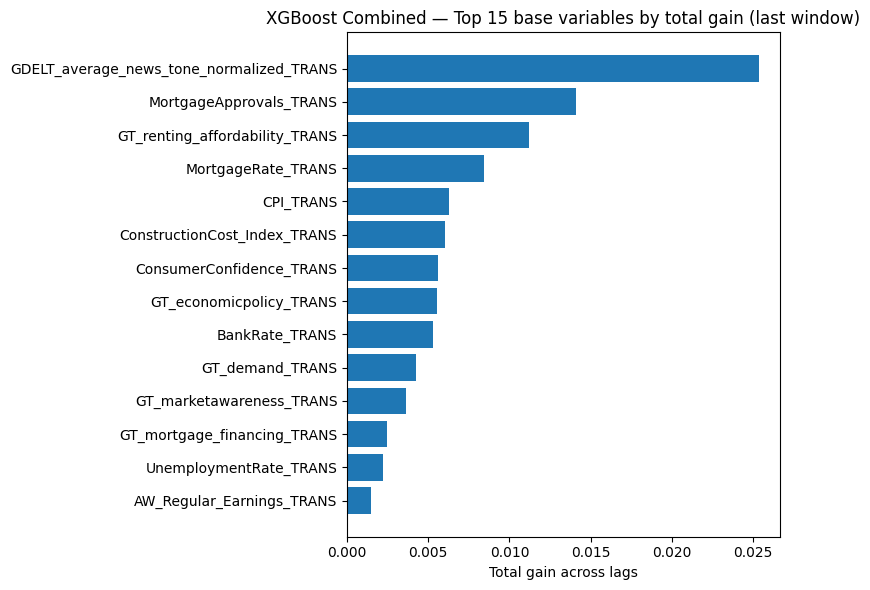

Saved: XGB_gain_feature_combined_lastwindow.csv and XGB_gain_base_combined_lastwindow.csv


In [ ]:
# Feature Importance
import re

# Loading the final_ml dataset
try:
    df_all = final_ml.copy()
except NameError:
    df_all = pd.read_csv("regional_nowcast_features_lag1to6.csv")

df_all["Date"] = pd.to_datetime(df_all["Date"])
df_all = df_all.sort_values(["Date", "RegionName"]).reset_index(drop=True)

TARGET        = "HPI_TRANS"
START_TEST    = pd.Timestamp("2018-01-01")
WINDOW_MONTHS = 60

spec_labels = {
    "traditional": "Traditional",
    "highfreq": "High-Frequency",
    "combined": "Combined"
}

def base_of(feat_name: str) -> str:
    m = re.search(r"^(.*)_lag\d+$", feat_name)
    return m.group(1) if m else feat_name

# 60-month training window and last test date
def last_rolling_window_dates(all_dates, start_test, window_months=60):
    all_dates = sorted(all_dates)
    test_dates = [d for d in all_dates if d >= start_test]
    last_test  = max(test_dates)
    train_end  = last_test - pd.offsets.MonthBegin(1)
    train_start = train_end - pd.DateOffset(months=window_months) + pd.offsets.MonthBegin(1)
    return (train_start, train_end), last_test

all_dates = sorted(df_all["Date"].unique())

# Loop over the three specs and compute gain importance
gain_feature_tables = {}
gain_base_tables = {}

for spec_key, feature_cols in FEATURE_SETS.items():
    spec_name = spec_labels.get(spec_key, spec_key)
    print(f"\n=== XGBoost gain importance — {spec_name} specification ===")

    # Define the last training window
    (train_start, train_end), last_test = last_rolling_window_dates(
        all_dates, START_TEST, window_months=WINDOW_MONTHS
    )

    train_mask = (df_all["Date"] >= train_start) & (df_all["Date"] <= train_end)
    train_df   = df_all.loc[train_mask]

    X_tr = train_df[feature_cols]
    y_tr = train_df[TARGET]

    print(f"Training window: {train_start.date()} to {train_end.date()}")
    print(f"Number of rows in training window: {len(train_df)}")
    print(f"Number of predictors: {X_tr.shape[1]}")

    # Fit a single XGBoost model on this final training window
    xgb = XGBRegressor(
        n_estimators=500,
        learning_rate=0.05,
        max_depth=5,
        subsample=0.8,
        colsample_bytree=0.8,
        objective="reg:squarederror",
        random_state=42,
        n_jobs=-1
    )
    xgb.fit(X_tr, y_tr, verbose=False)

    # Extract gain-based importance from the fitted booster
    booster = xgb.get_booster()
    gain_dict = booster.get_score(importance_type="gain")   # {'f0': gain, 'f1': ...}

    # Map f0, f1, ... back to actual column names
    fmap = {f"f{i}": col for i, col in enumerate(feature_cols)}
    gain_series = pd.Series(
        {fmap.get(k, k): v for k, v in gain_dict.items()}
    ).sort_values(ascending=False)

    print("\nTop 20 lagged features by gain:")
    display(gain_series.head(20).to_frame("gain"))

    # Collapse across lags to get base-level importance
    gain_base = (
        gain_series
        .rename(index=base_of)
        .groupby(level=0)
        .sum()
        .sort_values(ascending=False)
    )

    print("\nTop 15 base variables by total gain:")
    display(gain_base.head(15).to_frame("total_gain"))

    # Storing the tables
    gain_feature_tables[spec_key] = gain_series
    gain_base_tables[spec_key] = gain_base

    # bar plots
    top_feat = gain_series.head(20)[::-1]
    plt.figure(figsize=(8, 6))
    plt.barh(top_feat.index, top_feat.values)
    plt.title(f"XGBoost {spec_name} — Top 20 lagged features by gain (last window)")
    plt.xlabel("Gain")
    plt.tight_layout()
    plt.show()

    top_base = gain_base.head(15)[::-1]
    plt.figure(figsize=(8, 6))
    plt.barh(top_base.index, top_base.values)
    plt.title(f"XGBoost {spec_name} — Top 15 base variables by total gain (last window)")
    plt.xlabel("Total gain across lags")
    plt.tight_layout()
    plt.show()

    # Save to CSV
    gain_series.to_frame("gain").to_csv(f"XGB_gain_feature_{spec_key}_lastwindow.csv")
    gain_base.to_frame("total_gain").to_csv(f"XGB_gain_base_{spec_key}_lastwindow.csv")
    print(f"Saved: XGB_gain_feature_{spec_key}_lastwindow.csv and XGB_gain_base_{spec_key}_lastwindow.csv")


SHAP for XGBoost — Traditional spec
Training window: 2020-06-01 to 2025-05-01 (rows: 24300)
Explaining predictions for last test month: 2025-06-01 (rows: 405)


PermutationExplainer explainer: 406it [04:39,  1.42it/s]
/tmp/ipython-input-2324784087.py:52: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_plot, max_display=20, show=True)


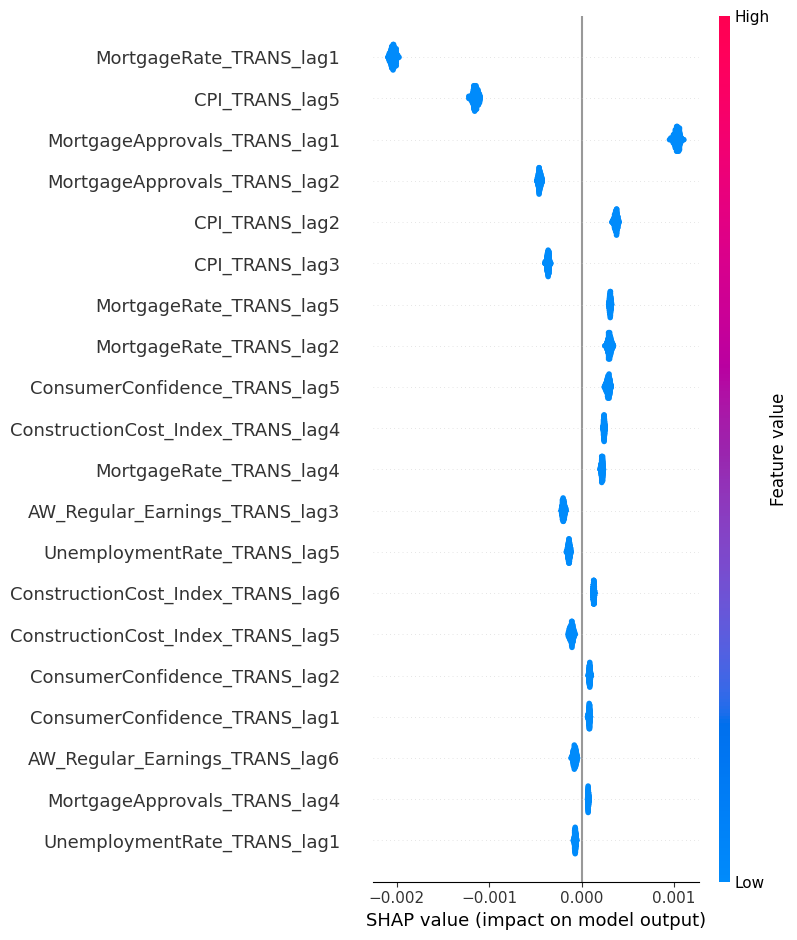

/tmp/ipython-input-2324784087.py:53: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_plot, plot_type="bar", max_display=20, show=True)


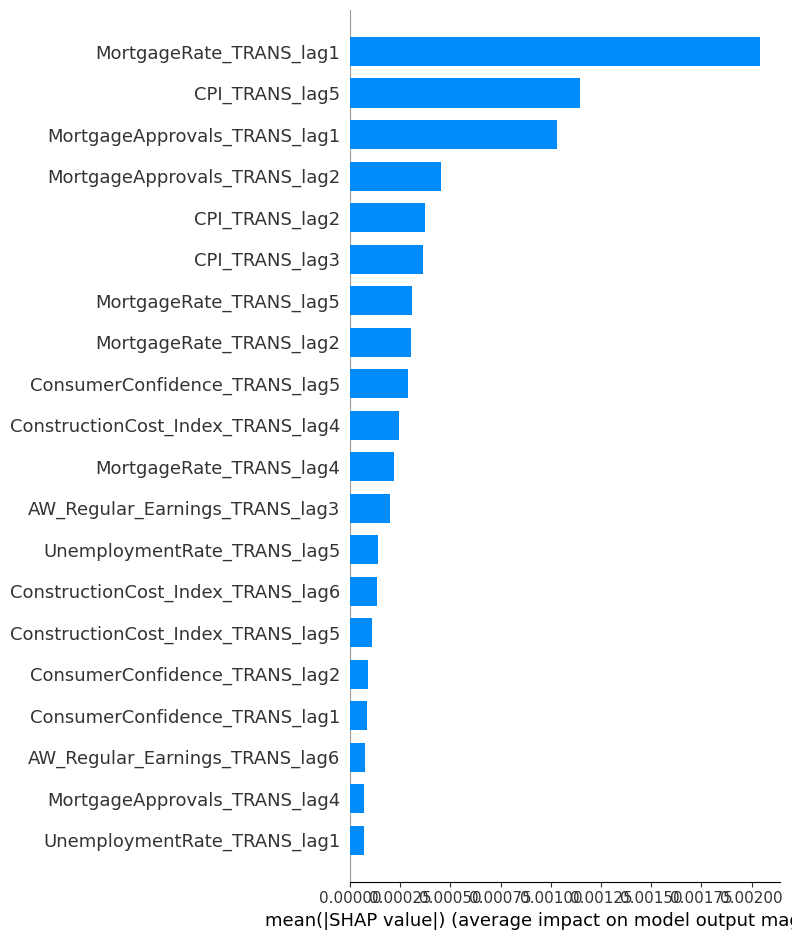


Top 20 mean |SHAP| features (last window):


,mean_abs_shap
MortgageRate_TRANS_lag1,0.00204
CPI_TRANS_lag5,0.00115
MortgageApprovals_TRANS_lag1,0.00103
MortgageApprovals_TRANS_lag2,0.00046
CPI_TRANS_lag2,0.00037
CPI_TRANS_lag3,0.00036
MortgageRate_TRANS_lag5,0.00031
MortgageRate_TRANS_lag2,0.00030
ConsumerConfidence_TRANS_lag5,0.00029
ConstructionCost_Index_TRANS_lag4,0.00024



Top 15 base variables by total mean |SHAP|:


,total_mean_abs_shap
MortgageRate_TRANS,0.00294
CPI_TRANS,0.00203
MortgageApprovals_TRANS,0.00164
ConsumerConfidence_TRANS,0.00061
ConstructionCost_Index_TRANS,0.00058
AW_Regular_Earnings_TRANS,0.00040
UnemploymentRate_TRANS,0.00031
BankRate_TRANS,0.00008


Saved: XGB_shap_feature_traditional_lastwindow.csv and XGB_shap_base_traditional_lastwindow.csv


In [ ]:
# Computing SHAP values- traditional specification
import shap

SPEC_KEY = "traditional"
spec_name = spec_labels.get(SPEC_KEY, SPEC_KEY)

feature_cols = FEATURE_SETS[SPEC_KEY]
missing = [c for c in feature_cols if c not in df_all.columns]
if missing:
    raise ValueError(f"Missing columns for spec '{SPEC_KEY}': {missing[:5]}...")

all_dates = sorted(df_all["Date"].unique())
(train_start, train_end), last_test = last_rolling_window_dates(
    all_dates, START_TEST, window_months=WINDOW_MONTHS
)

train_mask = (df_all["Date"] >= train_start) & (df_all["Date"] <= train_end)
test_mask  = (df_all["Date"] == last_test)

train_df = df_all.loc[train_mask]
test_df  = df_all.loc[test_mask]

X_tr, y_tr = train_df[feature_cols], train_df[TARGET]
X_te       = test_df[feature_cols]

print(f"SHAP for XGBoost — {spec_name} spec")
print(f"Training window: {train_start.date()} to {train_end.date()} (rows: {len(train_df)})")
print(f"Explaining predictions for last test month: {last_test.date()} (rows: {len(test_df)})")

xgb = XGBRegressor(
    n_estimators=500, learning_rate=0.05, max_depth=5,
    subsample=0.8, colsample_bytree=0.8,
    objective="reg:squarederror", random_state=42, n_jobs=-1
)
xgb.fit(X_tr, y_tr, verbose=False)

# Background sample for SHAP
X_bg = X_tr.sample(n=min(800, len(X_tr)), random_state=42)
X_plot = X_te.copy()

def model_predict(X):
    if isinstance(X, np.ndarray):
        X = pd.DataFrame(X, columns=feature_cols)
    return xgb.predict(X)

# Using permutation
explainer = shap.Explainer(model_predict, X_bg, algorithm="permutation")
shap_values = explainer(X_plot)

# SHAP plots
try:
    shap.summary_plot(shap_values, X_plot, max_display=20, show=True)
    shap.summary_plot(shap_values, X_plot, plot_type="bar", max_display=20, show=True)
except Exception as e:
    print("SHAP plotting warning:", e)

# Numeric summary
sv = shap_values.values if hasattr(shap_values, "values") else np.array(shap_values)
mean_abs = np.abs(sv).mean(axis=0)
mean_abs_series = pd.Series(mean_abs, index=X_plot.columns).sort_values(ascending=False)

print("\nTop 20 mean |SHAP| features (last window):")
display(mean_abs_series.head(20).to_frame("mean_abs_shap"))

mean_abs_base = (
    mean_abs_series
    .rename(index=base_of)
    .groupby(level=0)
    .sum()
    .sort_values(ascending=False)
)

print("\nTop 15 base variables by total mean |SHAP|:")
display(mean_abs_base.head(15).to_frame("total_mean_abs_shap"))

# Save
mean_abs_series.to_frame("mean_abs_shap").to_csv(f"XGB_shap_feature_{SPEC_KEY}_lastwindow.csv")
mean_abs_base.to_frame("total_mean_abs_shap").to_csv(f"XGB_shap_base_{SPEC_KEY}_lastwindow.csv")
print(f"Saved: XGB_shap_feature_{SPEC_KEY}_lastwindow.csv and XGB_shap_base_{SPEC_KEY}_lastwindow.csv")

SHAP for XGBoost — High-Frequency spec
Training window: 2020-06-01 to 2025-05-01 (rows: 24300)
Explaining predictions for last test month: 2025-06-01 (rows: 405)


PermutationExplainer explainer: 406it [04:15,  1.52it/s]
/tmp/ipython-input-1475514155.py:52: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_plot, max_display=20, show=True)


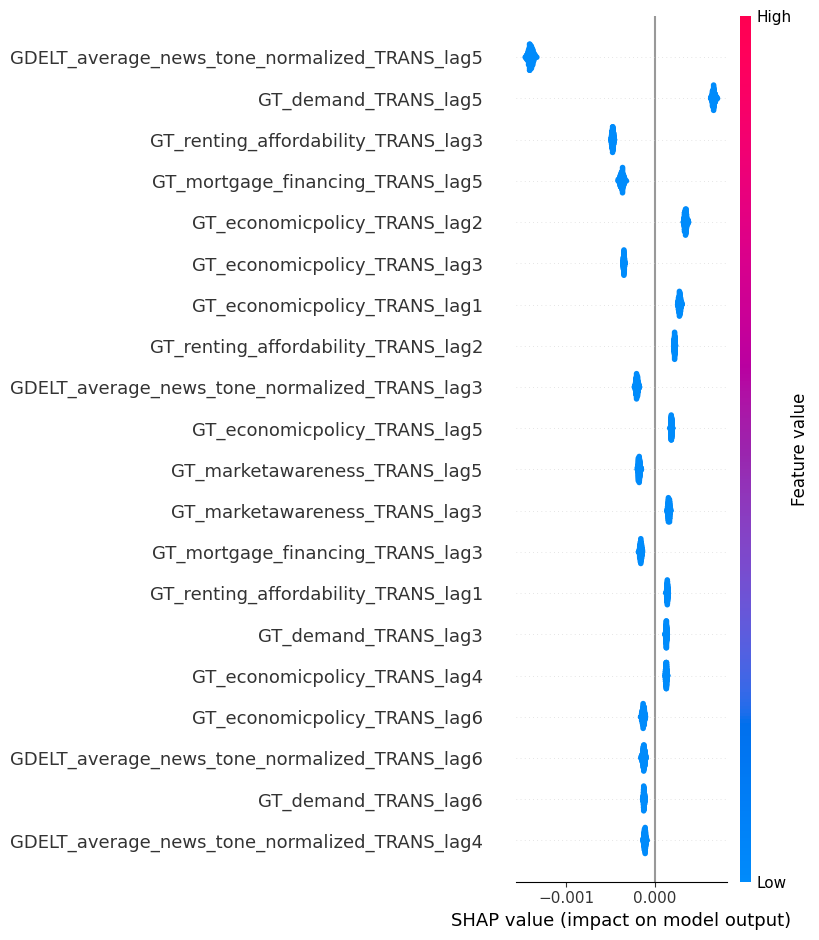

/tmp/ipython-input-1475514155.py:53: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_plot, plot_type="bar", max_display=20, show=True)


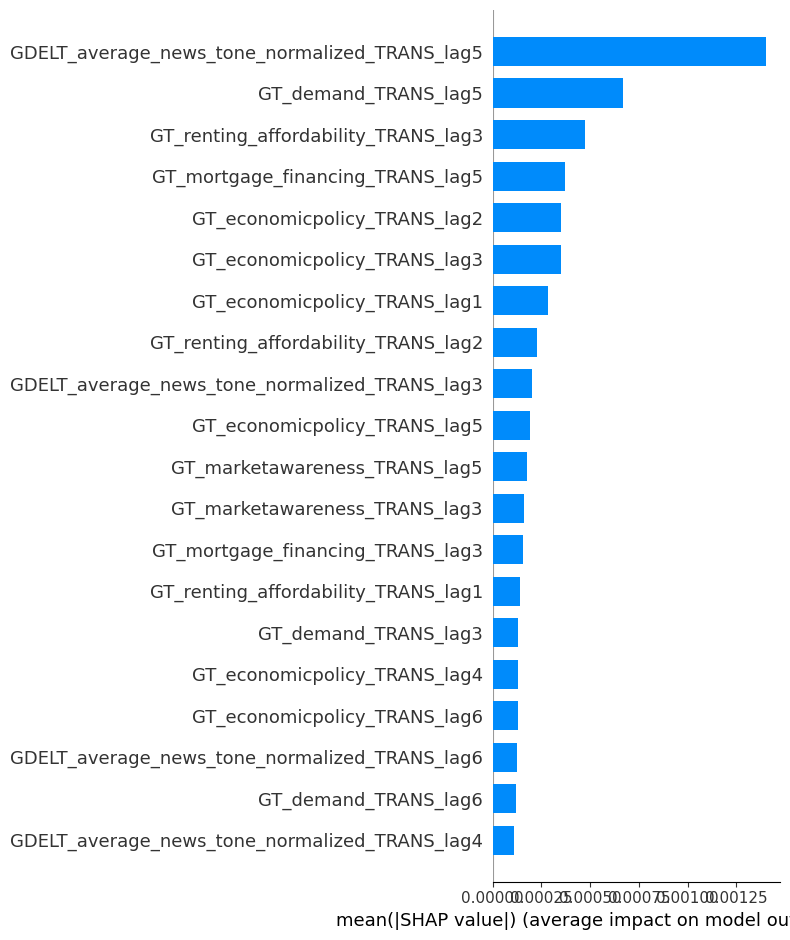


Top 20 mean |SHAP| features (last window):


,mean_abs_shap
GDELT_average_news_tone_normalized_TRANS_lag5,0.00140
GT_demand_TRANS_lag5,0.00067
GT_renting_affordability_TRANS_lag3,0.00047
GT_mortgage_financing_TRANS_lag5,0.00037
GT_economicpolicy_TRANS_lag2,0.00035
GT_economicpolicy_TRANS_lag3,0.00035
GT_economicpolicy_TRANS_lag1,0.00028
GT_renting_affordability_TRANS_lag2,0.00023
GDELT_average_news_tone_normalized_TRANS_lag3,0.00020
GT_economicpolicy_TRANS_lag5,0.00019



Top 15 base variables by total mean |SHAP|:


,total_mean_abs_shap
GDELT_average_news_tone_normalized_TRANS,0.00187
GT_economicpolicy_TRANS,0.00143
GT_demand_TRANS,0.00109
GT_renting_affordability_TRANS,0.00103
GT_mortgage_financing_TRANS,0.00075
GT_marketawareness_TRANS,0.00056


Saved: XGB_shap_feature_highfreq_lastwindow.csv and XGB_shap_base_highfreq_lastwindow.csv


In [ ]:
# Computing SHAP values- high-frequency specification
import shap

SPEC_KEY = "highfreq"
spec_name = spec_labels.get(SPEC_KEY, SPEC_KEY)

feature_cols = FEATURE_SETS[SPEC_KEY]
missing = [c for c in feature_cols if c not in df_all.columns]
if missing:
    raise ValueError(f"Missing columns for spec '{SPEC_KEY}': {missing[:5]}...")

all_dates = sorted(df_all["Date"].unique())
(train_start, train_end), last_test = last_rolling_window_dates(
    all_dates, START_TEST, window_months=WINDOW_MONTHS
)

train_mask = (df_all["Date"] >= train_start) & (df_all["Date"] <= train_end)
test_mask  = (df_all["Date"] == last_test)

train_df = df_all.loc[train_mask]
test_df  = df_all.loc[test_mask]

X_tr, y_tr = train_df[feature_cols], train_df[TARGET]
X_te       = test_df[feature_cols]

print(f"SHAP for XGBoost — {spec_name} spec")
print(f"Training window: {train_start.date()} to {train_end.date()} (rows: {len(train_df)})")
print(f"Explaining predictions for last test month: {last_test.date()} (rows: {len(test_df)})")

xgb = XGBRegressor(
    n_estimators=500, learning_rate=0.05, max_depth=5,
    subsample=0.8, colsample_bytree=0.8,
    objective="reg:squarederror", random_state=42, n_jobs=-1
)
xgb.fit(X_tr, y_tr, verbose=False)

# Background sample for SHAP
X_bg = X_tr.sample(n=min(800, len(X_tr)), random_state=42)
X_plot = X_te.copy()

def model_predict(X):
    if isinstance(X, np.ndarray):
        X = pd.DataFrame(X, columns=feature_cols)
    return xgb.predict(X)

# Using permutation
explainer = shap.Explainer(model_predict, X_bg, algorithm="permutation")
shap_values = explainer(X_plot)

# SHAP plots
try:
    shap.summary_plot(shap_values, X_plot, max_display=20, show=True)
    shap.summary_plot(shap_values, X_plot, plot_type="bar", max_display=20, show=True)
except Exception as e:
    print("SHAP plotting warning:", e)

# Numeric summary
sv = shap_values.values if hasattr(shap_values, "values") else np.array(shap_values)
mean_abs = np.abs(sv).mean(axis=0)
mean_abs_series = pd.Series(mean_abs, index=X_plot.columns).sort_values(ascending=False)

print("\nTop 20 mean |SHAP| features (last window):")
display(mean_abs_series.head(20).to_frame("mean_abs_shap"))

mean_abs_base = (
    mean_abs_series
    .rename(index=base_of)
    .groupby(level=0)
    .sum()
    .sort_values(ascending=False)
)

print("\nTop 15 base variables by total mean |SHAP|:")
display(mean_abs_base.head(15).to_frame("total_mean_abs_shap"))

# Save
mean_abs_series.to_frame("mean_abs_shap").to_csv(f"XGB_shap_feature_{SPEC_KEY}_lastwindow.csv")
mean_abs_base.to_frame("total_mean_abs_shap").to_csv(f"XGB_shap_base_{SPEC_KEY}_lastwindow.csv")
print(f"Saved: XGB_shap_feature_{SPEC_KEY}_lastwindow.csv and XGB_shap_base_{SPEC_KEY}_lastwindow.csv")

SHAP for XGBoost — Combined spec
Training window: 2020-06-01 to 2025-05-01 (rows: 24300)
Explaining predictions for last test month: 2025-06-01 (rows: 405)


PermutationExplainer explainer: 406it [03:47,  1.71it/s]
/tmp/ipython-input-1645309230.py:52: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_plot, max_display=20, show=True)


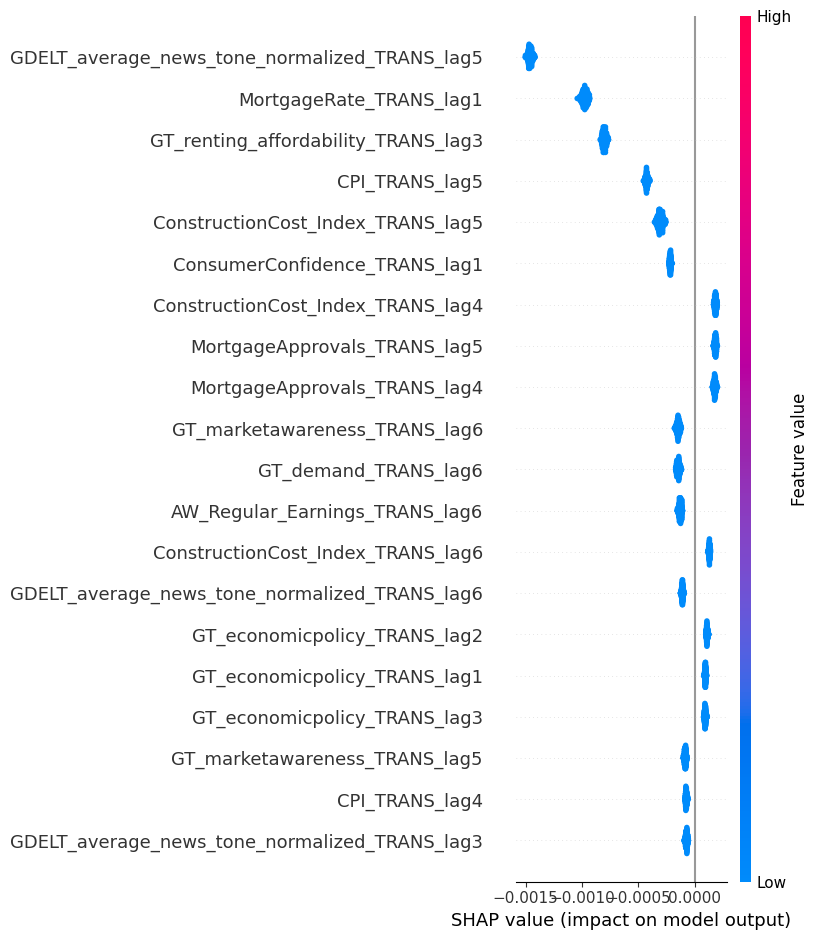

/tmp/ipython-input-1645309230.py:53: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_plot, plot_type="bar", max_display=20, show=True)


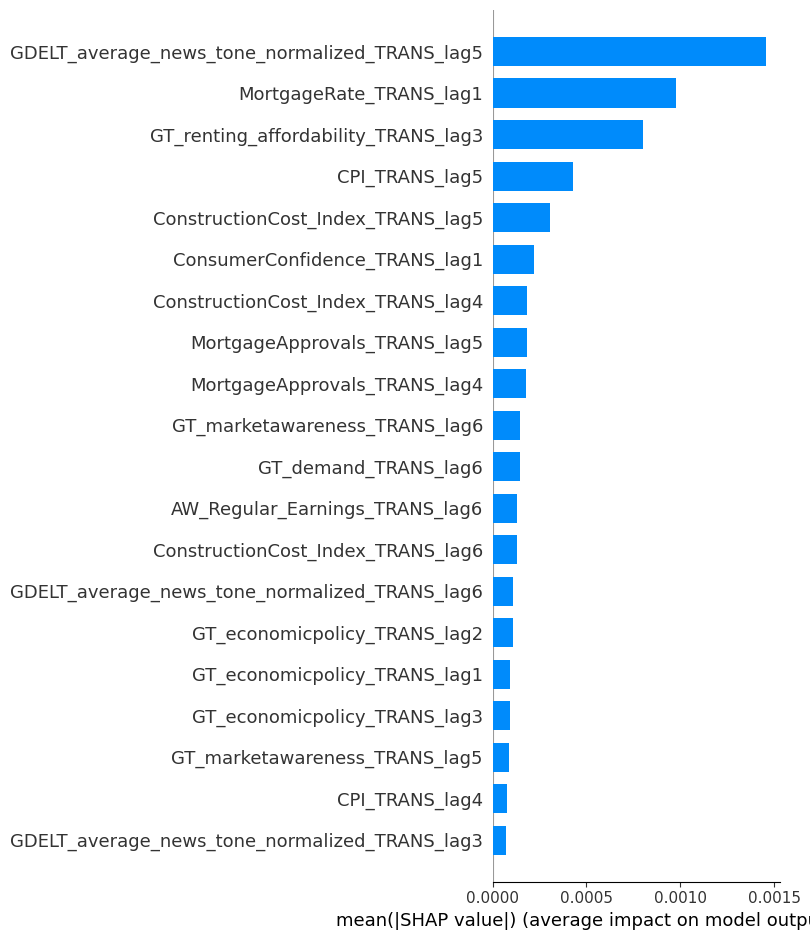


Top 20 mean |SHAP| features (last window):


,mean_abs_shap
GDELT_average_news_tone_normalized_TRANS_lag5,0.00146
MortgageRate_TRANS_lag1,0.00097
GT_renting_affordability_TRANS_lag3,0.00080
CPI_TRANS_lag5,0.00043
ConstructionCost_Index_TRANS_lag5,0.00031
ConsumerConfidence_TRANS_lag1,0.00022
ConstructionCost_Index_TRANS_lag4,0.00018
MortgageApprovals_TRANS_lag5,0.00018
MortgageApprovals_TRANS_lag4,0.00018
GT_marketawareness_TRANS_lag6,0.00015



Top 15 base variables by total mean |SHAP|:


,total_mean_abs_shap
GDELT_average_news_tone_normalized_TRANS,0.00176
MortgageRate_TRANS,0.00112
GT_renting_affordability_TRANS,0.00095
ConstructionCost_Index_TRANS,0.00071
CPI_TRANS,0.00065
MortgageApprovals_TRANS,0.00047
GT_economicpolicy_TRANS,0.00039
ConsumerConfidence_TRANS,0.00036
GT_marketawareness_TRANS,0.00034
AW_Regular_Earnings_TRANS,0.00032


Saved: XGB_shap_feature_combined_lastwindow.csv and XGB_shap_base_combined_lastwindow.csv


In [ ]:
# Computing SHAP values- combined specification
import shap

SPEC_KEY = "combined"
spec_name = spec_labels.get(SPEC_KEY, SPEC_KEY)

feature_cols = FEATURE_SETS[SPEC_KEY]
missing = [c for c in feature_cols if c not in df_all.columns]
if missing:
    raise ValueError(f"Missing columns for spec '{SPEC_KEY}': {missing[:5]}...")

all_dates = sorted(df_all["Date"].unique())
(train_start, train_end), last_test = last_rolling_window_dates(
    all_dates, START_TEST, window_months=WINDOW_MONTHS
)

train_mask = (df_all["Date"] >= train_start) & (df_all["Date"] <= train_end)
test_mask  = (df_all["Date"] == last_test)

train_df = df_all.loc[train_mask]
test_df  = df_all.loc[test_mask]

X_tr, y_tr = train_df[feature_cols], train_df[TARGET]
X_te       = test_df[feature_cols]

print(f"SHAP for XGBoost — {spec_name} spec")
print(f"Training window: {train_start.date()} to {train_end.date()} (rows: {len(train_df)})")
print(f"Explaining predictions for last test month: {last_test.date()} (rows: {len(test_df)})")

xgb = XGBRegressor(
    n_estimators=500, learning_rate=0.05, max_depth=5,
    subsample=0.8, colsample_bytree=0.8,
    objective="reg:squarederror", random_state=42, n_jobs=-1
)
xgb.fit(X_tr, y_tr, verbose=False)

# Background sample for SHAP
X_bg = X_tr.sample(n=min(800, len(X_tr)), random_state=42)
X_plot = X_te.copy()

def model_predict(X):
    if isinstance(X, np.ndarray):
        X = pd.DataFrame(X, columns=feature_cols)
    return xgb.predict(X)

# Using permutation
explainer = shap.Explainer(model_predict, X_bg, algorithm="permutation")
shap_values = explainer(X_plot)

# SHAP plots
try:
    shap.summary_plot(shap_values, X_plot, max_display=20, show=True)
    shap.summary_plot(shap_values, X_plot, plot_type="bar", max_display=20, show=True)
except Exception as e:
    print("SHAP plotting warning:", e)

# Numeric summary
sv = shap_values.values if hasattr(shap_values, "values") else np.array(shap_values)
mean_abs = np.abs(sv).mean(axis=0)
mean_abs_series = pd.Series(mean_abs, index=X_plot.columns).sort_values(ascending=False)

print("\nTop 20 mean |SHAP| features (last window):")
display(mean_abs_series.head(20).to_frame("mean_abs_shap"))

mean_abs_base = (
    mean_abs_series
    .rename(index=base_of)
    .groupby(level=0)
    .sum()
    .sort_values(ascending=False)
)

print("\nTop 15 base variables by total mean |SHAP|:")
display(mean_abs_base.head(15).to_frame("total_mean_abs_shap"))

# Save
mean_abs_series.to_frame("mean_abs_shap").to_csv(f"XGB_shap_feature_{SPEC_KEY}_lastwindow.csv")
mean_abs_base.to_frame("total_mean_abs_shap").to_csv(f"XGB_shap_base_{SPEC_KEY}_lastwindow.csv")
print(f"Saved: XGB_shap_feature_{SPEC_KEY}_lastwindow.csv and XGB_shap_base_{SPEC_KEY}_lastwindow.csv")

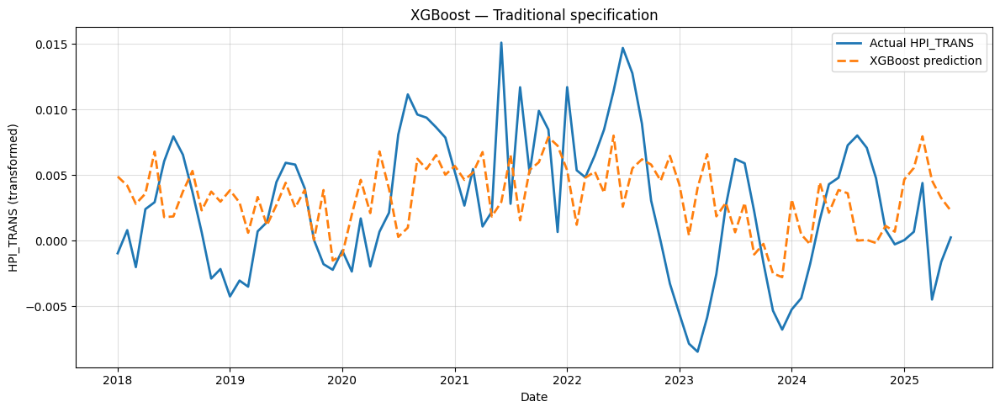

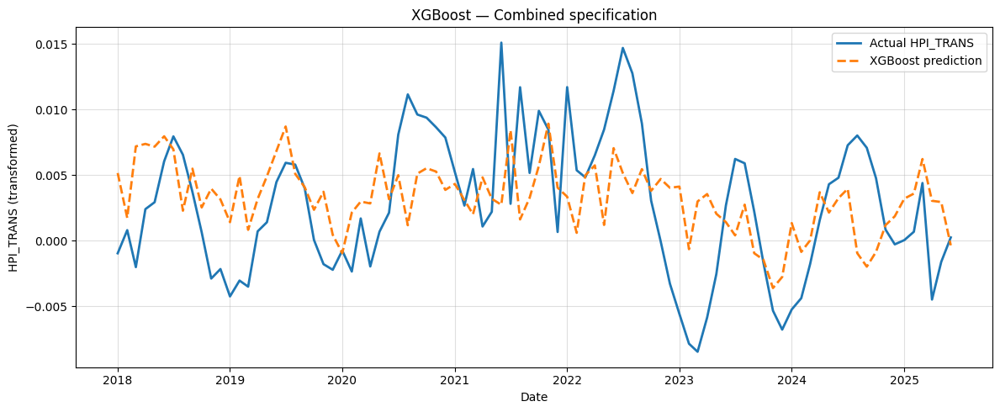

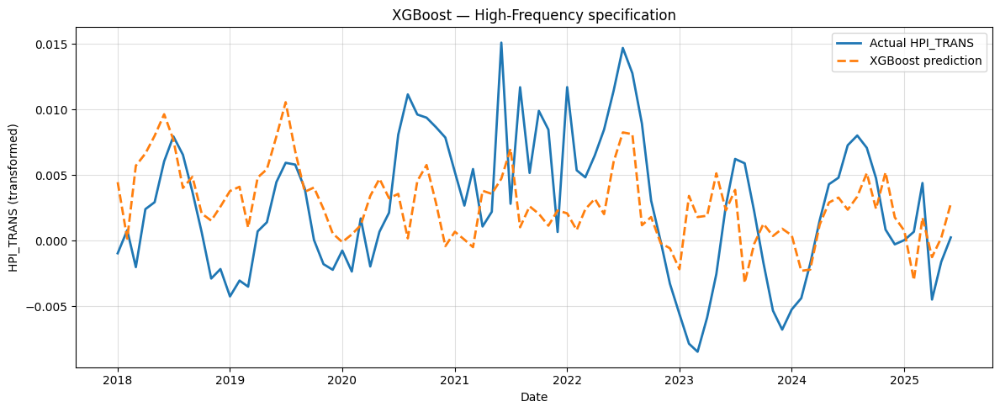

In [ ]:
# Plotting Actual vs Predicted for XGBoost for the three specifications

WINDOW_MONTHS = 60

spec_files = {
    "Traditional":    "UK_nowcast_XGB_traditional_rolling60m.csv",
    "High-Frequency": "UK_nowcast_XGB_highfreq_rolling60m.csv",
    "Combined":       "UK_nowcast_XGB_combined_rolling60m.csv",
}

def load_xgb_nowcast(path, spec_name):
    """Load a saved XGBoost nowcast file and standardise column names."""
    df = pd.read_csv(path, parse_dates=["Date"])
    df = df.set_index("Date").sort_index()

    cols = df.columns.tolist()

    # identifying predicted and actual columns
    pred_candidates = [c for c in cols if "pred" in c.lower()]
    true_candidates = [
        c for c in cols
        if ("true" in c.lower()) or ("hpi" in c.lower() and "pred" not in c.lower())
    ]

    if not pred_candidates:
        raise ValueError(f"No prediction column found in {path}")
    if not true_candidates:
        raise ValueError(f"No actual HPI column found in {path}")

    pred_col = pred_candidates[0]
    true_col = true_candidates[0]

    df = df[[true_col, pred_col]].rename(columns={
        true_col: "y_true",
        pred_col: "y_pred"
    })
    df["Spec"] = spec_name
    return df


# Loading all three specifications
xgb_list = []
for spec_name, fname in spec_files.items():
    xgb_list.append(load_xgb_nowcast(fname, spec_name))

xgb_all = pd.concat(xgb_list).sort_index()

# limit to 2018–2025
xgb_all = xgb_all.loc["2018-01-01":"2025-12-31"]


# PLOTTING
def plot_xgb_nowcasts(df):
    for spec in df["Spec"].unique():
        sub = df[df["Spec"] == spec]

        plt.figure(figsize=(12, 5))
        plt.plot(sub.index, sub["y_true"], label="Actual HPI_TRANS", linewidth=2)
        plt.plot(sub.index, sub["y_pred"], "--", label="XGBoost prediction", linewidth=2)

        plt.title(f"XGBoost — {spec} specification")
        plt.xlabel("Date")
        plt.ylabel("HPI_TRANS (transformed)")
        plt.grid(True, alpha=0.4)
        plt.legend()
        plt.tight_layout()
        plt.show()


# Generate plots
plot_xgb_nowcasts(xgb_all)

Random Forest

In [ ]:

# Random Forest

from sklearn.ensemble import RandomForestRegressor

# Loading the final_ml dataset
try:
    df = final_ml.copy()
except NameError:
    df = pd.read_csv("regional_nowcast_features_lag1to6.csv")

df["Date"] = pd.to_datetime(df["Date"])
df = df.sort_values(["Date", "RegionName"]).reset_index(drop=True)

TARGET = "HPI_TRANS"
all_dates = sorted(df["Date"].unique())

START_TEST    = pd.Timestamp("2018-01-01")
WINDOW_MONTHS = 60

rf_results   = []
rf_nowcasts  = {}
spec_labels  = {"traditional": "Traditional",
                "highfreq": "High-Frequency",
                "combined": "Combined"}

for spec_key, feature_cols in FEATURE_SETS.items():
    print(f"\n=== Random Forest — {spec_labels.get(spec_key, spec_key)} specification ===")

    # checking that all columns present
    missing = [c for c in feature_cols if c not in df.columns]
    if missing:
        raise ValueError(f"Missing features for '{spec_key}': {missing[:5]}...")

    rf = RandomForestRegressor(
        n_estimators=600,
        max_depth=None,
        min_samples_leaf=3,
        max_features="sqrt",
        random_state=42,
        n_jobs=-1
    )

    uk_true, uk_pred, dates_used = [], [], []
    train_times, pred_times = [], []

    t0 = time.time()

    for (train_start, train_end), test_date in rolling_panel_splits(
        all_dates, start_test=START_TEST, window_months=WINDOW_MONTHS
    ):
        tr_mask = (df["Date"] >= train_start) & (df["Date"] <= train_end)
        te_mask = (df["Date"] == test_date)

        train_df = df.loc[tr_mask]
        test_df  = df.loc[te_mask]

        # Need at least 24 distinct months in training and a non-empty test month
        if train_df["Date"].nunique() < 24 or test_df.empty:
            continue

        X_tr, y_tr = train_df[feature_cols], train_df[TARGET]
        X_te, y_te = test_df[feature_cols], test_df[TARGET]

        # Timed training
        t_train_start = time.time()
        rf.fit(X_tr, y_tr)
        t_train_end = time.time()
        train_times.append(t_train_end - t_train_start)

        # Timed prediction
        t_pred_start = time.time()
        preds_region = rf.predict(X_te)
        t_pred_end = time.time()
        pred_times.append(t_pred_end - t_pred_start)

        # Aggregate from regions to UK
        uk_pred.append(float(np.mean(preds_region)))
        uk_true.append(float(np.mean(y_te.values)))
        dates_used.append(test_date)

    total_time = time.time() - t0
    n_forecasts = len(uk_true)

    # Evaluation metrics for Forecast Accuracy
    rmse, mae = eval_metrics(uk_true, uk_pred)
    print(f"Random Forest [{spec_labels.get(spec_key, spec_key)}] — RMSE={rmse:.5f}, MAE={mae:.5f}")

    # Computational efficiency
    if n_forecasts > 0:
        avg_train = float(np.mean(train_times))
        avg_pred  = float(np.mean(pred_times))
        avg_total = float(total_time / n_forecasts)
    else:
        avg_train = avg_pred = avg_total = np.nan

    print("Computational efficiency:")
    print(f"  Total rolling-window time:       {total_time:.2f} sec")
    print(f"  Avg training time per forecast:  {avg_train:.6f} sec")
    print(f"  Avg prediction time per forecast:{avg_pred:.6f} sec")
    print(f"  Avg total time per forecast:     {avg_total:.6f} sec")

    # Save UK-level nowcast
    nowcast_df = pd.DataFrame({
        "HPI_TRANS_actual_UK_mean": uk_true,
        "HPI_TRANS_pred_RF": uk_pred
    }, index=pd.to_datetime(dates_used))
    nowcast_df.index.name = "Date"

    fname = f"UK_nowcast_RF_{spec_labels.get(spec_key, spec_key)}_rolling{WINDOW_MONTHS}m.csv"
    nowcast_df.to_csv(fname)
    print(f"Saved: {fname}")

    rf_nowcasts[spec_key] = nowcast_df

    rf_results.append({
        "Model": "Random Forest",
        "Specification": spec_labels.get(spec_key, spec_key),
        "Window": f"Rolling-{WINDOW_MONTHS}m",
        "RMSE": rmse,
        "MAE": mae,
        "TotalTime_sec": total_time,
        "AvgTrain_sec": avg_train,
        "AvgPred_sec": avg_pred,
        "AvgTotal_sec": avg_total,
        "n_forecasts": n_forecasts
    })

# Summary table
rf_summary = pd.DataFrame(rf_results).sort_values("RMSE").reset_index(drop=True)
display(rf_summary)

rf_summary.to_csv(f"RF_Evaluation_Summary_Rolling{WINDOW_MONTHS}m.csv", index=False)
print(f"Saved: RF_Evaluation_Summary_Rolling{WINDOW_MONTHS}m.csv")


=== Random Forest — Traditional specification ===
Random Forest [Traditional] — RMSE=0.00510, MAE=0.00421
Computational efficiency:
  Total rolling-window time:       869.06 sec
  Avg training time per forecast:  9.399233 sec
  Avg prediction time per forecast:0.237360 sec
  Avg total time per forecast:     9.656197 sec
Saved: UK_nowcast_RF_Traditional_rolling60m.csv

=== Random Forest — High-Frequency specification ===
Random Forest [High-Frequency] — RMSE=0.00491, MAE=0.00410
Computational efficiency:
  Total rolling-window time:       901.31 sec
  Avg training time per forecast:  9.770864 sec
  Avg prediction time per forecast:0.228040 sec
  Avg total time per forecast:     10.014596 sec
Saved: UK_nowcast_RF_High-Frequency_rolling60m.csv

=== Random Forest — Combined specification ===
Random Forest [Combined] — RMSE=0.00486, MAE=0.00404
Computational efficiency:
  Total rolling-window time:       1253.66 sec
  Avg training time per forecast:  13.680789 sec
  Avg prediction time per

,Model,Specification,Window,RMSE,MAE,TotalTime_sec,AvgTrain_sec,AvgPred_sec,AvgTotal_sec,n_forecasts
0,Random Forest,Combined,Rolling-60m,0.00486,0.00404,"1,253.66300",13.68079,0.22804,13.92959,90
1,Random Forest,High-Frequency,Rolling-60m,0.00491,0.00410,901.31367,9.77086,0.22804,10.01460,90
2,Random Forest,Traditional,Rolling-60m,0.00510,0.00421,869.05775,9.39923,0.23736,9.65620,90


Saved: RF_Evaluation_Summary_Rolling60m.csv


Analysing Feature Importance for Random Forest


=== Random Forest Gini Importance — traditional specification ===

Top 15 lagged features:


,feature,gini_importance,base
0,MortgageRate_TRANS_lag1,0.06309,MortgageRate_TRANS
1,CPI_TRANS_lag5,0.06226,CPI_TRANS
2,ConstructionCost_Index_TRANS_lag6,0.05643,ConstructionCost_Index_TRANS
3,CPI_TRANS_lag3,0.05611,CPI_TRANS
4,MortgageRate_TRANS_lag2,0.04575,MortgageRate_TRANS
5,CPI_TRANS_lag2,0.04502,CPI_TRANS
6,MortgageRate_TRANS_lag3,0.04236,MortgageRate_TRANS
7,ConstructionCost_Index_TRANS_lag5,0.03281,ConstructionCost_Index_TRANS
8,ConstructionCost_Index_TRANS_lag2,0.02719,ConstructionCost_Index_TRANS
9,MortgageRate_TRANS_lag6,0.02718,MortgageRate_TRANS



Top 15 base variables:


,base,total_gini
6,MortgageRate_TRANS,0.22227
2,CPI_TRANS,0.21148
3,ConstructionCost_Index_TRANS,0.17387
5,MortgageApprovals_TRANS,0.11829
4,ConsumerConfidence_TRANS,0.09182
0,AW_Regular_Earnings_TRANS,0.08239
7,UnemploymentRate_TRANS,0.05725
1,BankRate_TRANS,0.04263


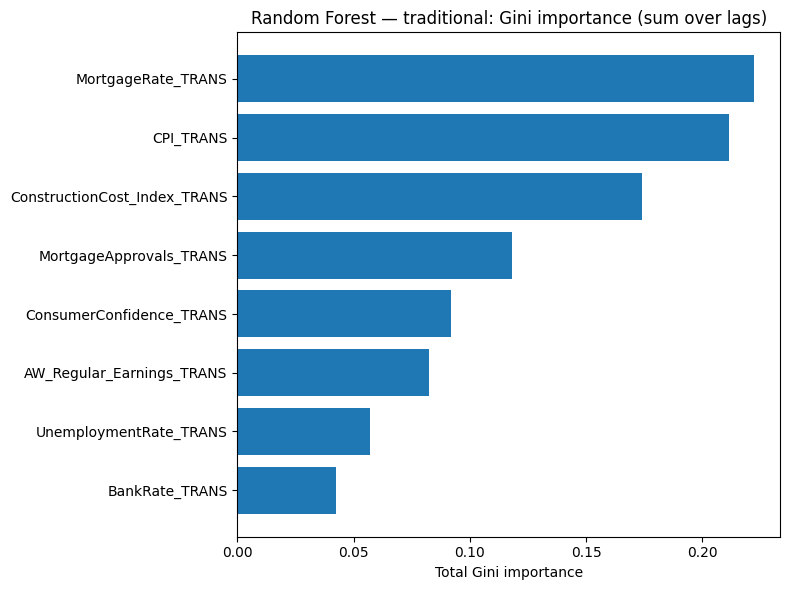


=== Random Forest Gini Importance — highfreq specification ===

Top 15 lagged features:


,feature,gini_importance,base
0,GDELT_average_news_tone_normalized_TRANS_lag5,0.12515,GDELT_average_news_tone_normalized_TRANS
1,GT_economicpolicy_TRANS_lag2,0.05832,GT_economicpolicy_TRANS
2,GT_economicpolicy_TRANS_lag4,0.05237,GT_economicpolicy_TRANS
3,GDELT_average_news_tone_normalized_TRANS_lag6,0.05181,GDELT_average_news_tone_normalized_TRANS
4,GT_renting_affordability_TRANS_lag6,0.05002,GT_renting_affordability_TRANS
5,GT_renting_affordability_TRANS_lag3,0.04220,GT_renting_affordability_TRANS
6,GDELT_average_news_tone_normalized_TRANS_lag3,0.04134,GDELT_average_news_tone_normalized_TRANS
7,GDELT_average_news_tone_normalized_TRANS_lag4,0.04097,GDELT_average_news_tone_normalized_TRANS
8,GT_mortgage_financing_TRANS_lag4,0.04041,GT_mortgage_financing_TRANS
9,GT_economicpolicy_TRANS_lag1,0.03676,GT_economicpolicy_TRANS



Top 15 base variables:


,base,total_gini
0,GDELT_average_news_tone_normalized_TRANS,0.29548
2,GT_economicpolicy_TRANS,0.21229
5,GT_renting_affordability_TRANS,0.17210
4,GT_mortgage_financing_TRANS,0.14974
3,GT_marketawareness_TRANS,0.08783
1,GT_demand_TRANS,0.08256


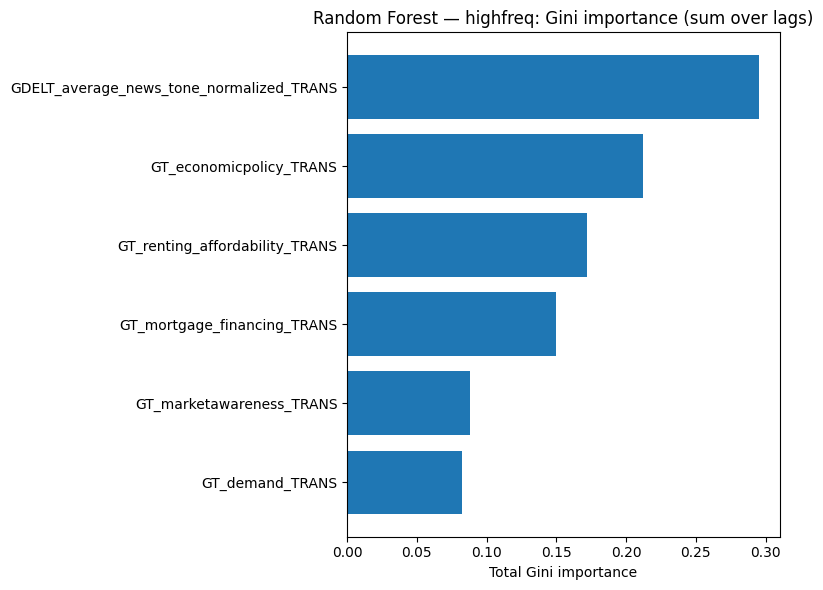


=== Random Forest Gini Importance — combined specification ===

Top 15 lagged features:


,feature,gini_importance,base
0,GDELT_average_news_tone_normalized_TRANS_lag5,0.07733,GDELT_average_news_tone_normalized_TRANS
1,CPI_TRANS_lag5,0.04726,CPI_TRANS
2,ConstructionCost_Index_TRANS_lag6,0.04385,ConstructionCost_Index_TRANS
3,MortgageRate_TRANS_lag1,0.03982,MortgageRate_TRANS
4,CPI_TRANS_lag3,0.03767,CPI_TRANS
5,MortgageRate_TRANS_lag2,0.03222,MortgageRate_TRANS
6,CPI_TRANS_lag2,0.02914,CPI_TRANS
7,GDELT_average_news_tone_normalized_TRANS_lag6,0.02864,GDELT_average_news_tone_normalized_TRANS
8,GDELT_average_news_tone_normalized_TRANS_lag4,0.02246,GDELT_average_news_tone_normalized_TRANS
9,ConstructionCost_Index_TRANS_lag5,0.02222,ConstructionCost_Index_TRANS



Top 15 base variables:


,base,total_gini
5,GDELT_average_news_tone_normalized_TRANS,0.16355
2,CPI_TRANS,0.13475
12,MortgageRate_TRANS,0.13050
3,ConstructionCost_Index_TRANS,0.11042
7,GT_economicpolicy_TRANS,0.08638
11,MortgageApprovals_TRANS,0.06687
10,GT_renting_affordability_TRANS,0.06551
9,GT_mortgage_financing_TRANS,0.04909
4,ConsumerConfidence_TRANS,0.04226
6,GT_demand_TRANS,0.03549


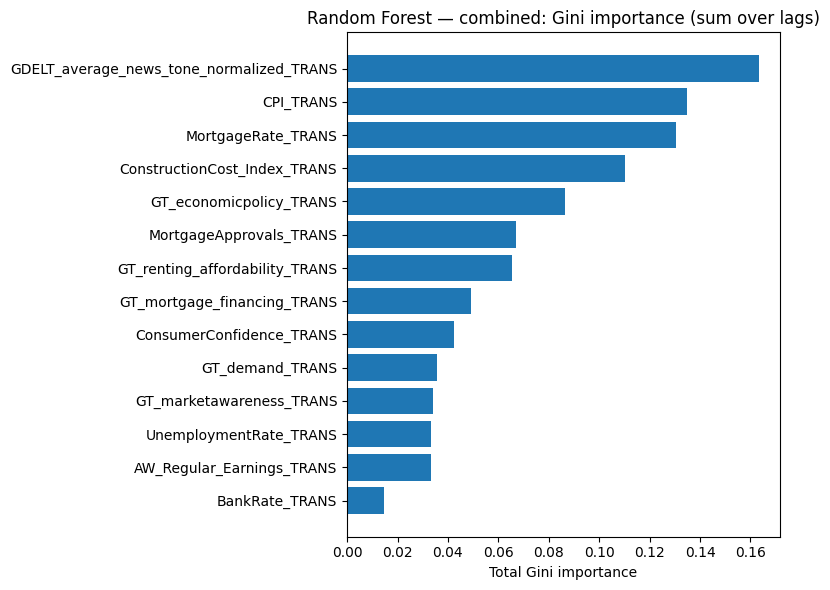


Saved Gini importance files:
 - RF_gini_features_traditional.csv
 - RF_gini_base_traditional.csv
 - RF_gini_features_highfreq.csv
 - RF_gini_base_highfreq.csv
 - RF_gini_features_combined.csv
 - RF_gini_base_combined.csv


In [ ]:

# Gini Importance

# Loading the final_ml dataset
try:
    df_rf = final_ml.copy()
except NameError:
    df_rf = pd.read_csv("regional_nowcast_features_lag1to6.csv")

df_rf["Date"] = pd.to_datetime(df_rf["Date"])
df_rf = df_rf.sort_values(["Date", "RegionName"]).reset_index(drop=True)

TARGET        = "HPI_TRANS"
START_TEST    = pd.Timestamp("2018-01-01")
WINDOW_MONTHS = 60
all_dates     = sorted(df_rf["Date"].unique())

# last rolling window
def last_rolling_window(dates, start_test, window_months=60):
    test_dates = [d for d in dates if d >= start_test]
    last_test  = max(test_dates)
    train_end  = last_test - pd.offsets.MonthBegin(1)
    train_start = train_end - pd.DateOffset(months=window_months) + pd.offsets.MonthBegin(1)
    return (train_start, train_end), last_test

# Convert feature name to base variable
def base_name(feat):
    m = re.search(r"^(.*)_lag\d+$", feat)
    return m.group(1) if m else feat

saved_gini_files = []

for spec_key, feature_cols in FEATURE_SETS.items():
    print(f"\n=== Random Forest Gini Importance — {spec_key} specification ===")

    # Last rolling window
    (train_start, train_end), test_date = last_rolling_window(all_dates, START_TEST, WINDOW_MONTHS)

    train_mask = (df_rf["Date"] >= train_start) & (df_rf["Date"] <= train_end)
    train_df   = df_rf.loc[train_mask]

    if train_df["Date"].nunique() < 24:
        print(f"Not enough data for spec '{spec_key}'. Skipping.")
        continue

    X_tr, y_tr = train_df[feature_cols], train_df[TARGET]

    # Fiting RF
    rf = RandomForestRegressor(
        n_estimators=600,
        min_samples_leaf=3,
        max_features="sqrt",
        random_state=42,
        n_jobs=-1
    )
    rf.fit(X_tr, y_tr)

    # Gini importance dataframe
    gini = pd.DataFrame({
        "feature": feature_cols,
        "gini_importance": rf.feature_importances_
    }).sort_values("gini_importance", ascending=False).reset_index(drop=True)

    gini["base"] = gini["feature"].apply(base_name)

    # Aggregate at base-variable level
    gini_base = (
        gini.groupby("base", as_index=False)
            .agg(total_gini=("gini_importance", "sum"))
            .sort_values("total_gini", ascending=False)
    )

    print("\nTop 15 lagged features:")
    display(gini.head(15))

    print("\nTop 15 base variables:")
    display(gini_base.head(15))

    # Bar plot
    plt.figure(figsize=(8, 6))
    topB = gini_base.head(15).iloc[::-1]
    plt.barh(topB["base"], topB["total_gini"])
    plt.title(f"Random Forest — {spec_key}: Gini importance (sum over lags)")
    plt.xlabel("Total Gini importance")
    plt.tight_layout()
    plt.show()

    # Save files
    gini_feat_file = f"RF_gini_features_{spec_key}.csv"
    gini_base_file = f"RF_gini_base_{spec_key}.csv"
    gini.to_csv(gini_feat_file, index=False)
    gini_base.to_csv(gini_base_file, index=False)
    saved_gini_files.extend([gini_feat_file, gini_base_file])

print("\nSaved Gini importance files:")
for f in saved_gini_files:
    print(" -", f)


=== Random Forest SHAP Importance — traditional specification ===
Computing SHAP for traditional (background=2000, explain=405)


 99%|===================| 400/405 [00:32<00:00]       


Top 15 lagged features:


,feature,mean_abs_shap,base
0,MortgageRate_TRANS_lag1,0.00097,MortgageRate_TRANS
1,CPI_TRANS_lag2,0.00067,CPI_TRANS
2,CPI_TRANS_lag5,0.00036,CPI_TRANS
3,CPI_TRANS_lag3,0.00030,CPI_TRANS
4,ConstructionCost_Index_TRANS_lag4,0.00019,ConstructionCost_Index_TRANS
5,ConsumerConfidence_TRANS_lag5,0.00017,ConsumerConfidence_TRANS
6,MortgageApprovals_TRANS_lag2,0.00017,MortgageApprovals_TRANS
7,ConstructionCost_Index_TRANS_lag3,0.00015,ConstructionCost_Index_TRANS
8,AW_Regular_Earnings_TRANS_lag6,0.00015,AW_Regular_Earnings_TRANS
9,ConstructionCost_Index_TRANS_lag6,0.00014,ConstructionCost_Index_TRANS



Top 15 base variables:


,base,total_abs_shap
2,CPI_TRANS,0.00143
6,MortgageRate_TRANS,0.00136
3,ConstructionCost_Index_TRANS,0.00073
5,MortgageApprovals_TRANS,0.00040
4,ConsumerConfidence_TRANS,0.00038
7,UnemploymentRate_TRANS,0.00027
0,AW_Regular_Earnings_TRANS,0.00025
1,BankRate_TRANS,0.00014


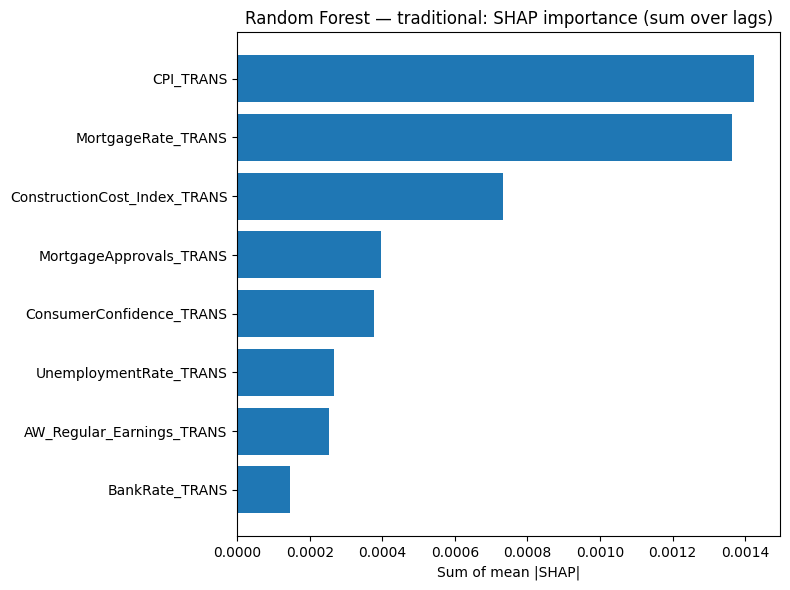


=== Random Forest SHAP Importance — highfreq specification ===
Computing SHAP for highfreq (background=2000, explain=405)


 98%|===================| 397/405 [00:37<00:00]       


Top 15 lagged features:


,feature,mean_abs_shap,base
0,GDELT_average_news_tone_normalized_TRANS_lag5,0.00084,GDELT_average_news_tone_normalized_TRANS
1,GT_demand_TRANS_lag5,0.00048,GT_demand_TRANS
2,GT_renting_affordability_TRANS_lag5,0.00043,GT_renting_affordability_TRANS
3,GT_economicpolicy_TRANS_lag2,0.00037,GT_economicpolicy_TRANS
4,GDELT_average_news_tone_normalized_TRANS_lag6,0.00037,GDELT_average_news_tone_normalized_TRANS
5,GT_renting_affordability_TRANS_lag3,0.00035,GT_renting_affordability_TRANS
6,GT_economicpolicy_TRANS_lag1,0.00031,GT_economicpolicy_TRANS
7,GDELT_average_news_tone_normalized_TRANS_lag3,0.00029,GDELT_average_news_tone_normalized_TRANS
8,GT_mortgage_financing_TRANS_lag3,0.00027,GT_mortgage_financing_TRANS
9,GT_marketawareness_TRANS_lag5,0.00026,GT_marketawareness_TRANS



Top 15 base variables:


,base,total_abs_shap
0,GDELT_average_news_tone_normalized_TRANS,0.00179
2,GT_economicpolicy_TRANS,0.00122
5,GT_renting_affordability_TRANS,0.00120
1,GT_demand_TRANS,0.00066
4,GT_mortgage_financing_TRANS,0.00065
3,GT_marketawareness_TRANS,0.00044


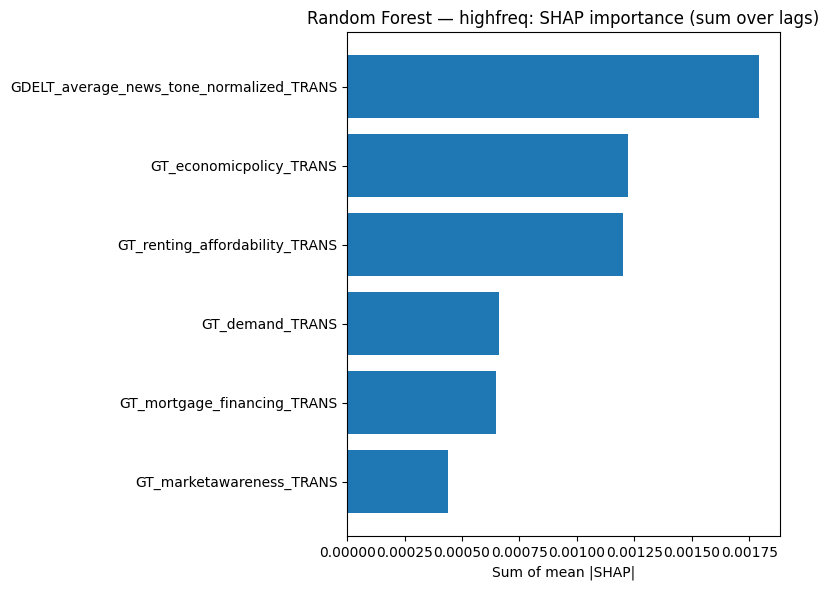


=== Random Forest SHAP Importance — combined specification ===
Computing SHAP for combined (background=2000, explain=405)


100%|===================| 403/405 [00:34<00:00]       


Top 15 lagged features:


,feature,mean_abs_shap,base
0,MortgageRate_TRANS_lag1,0.00067,MortgageRate_TRANS
1,GDELT_average_news_tone_normalized_TRANS_lag5,0.00049,GDELT_average_news_tone_normalized_TRANS
2,CPI_TRANS_lag2,0.00036,CPI_TRANS
3,CPI_TRANS_lag5,0.00034,CPI_TRANS
4,GDELT_average_news_tone_normalized_TRANS_lag6,0.00030,GDELT_average_news_tone_normalized_TRANS
5,GT_renting_affordability_TRANS_lag3,0.00025,GT_renting_affordability_TRANS
6,CPI_TRANS_lag3,0.00021,CPI_TRANS
7,GT_renting_affordability_TRANS_lag5,0.00020,GT_renting_affordability_TRANS
8,GT_economicpolicy_TRANS_lag2,0.00015,GT_economicpolicy_TRANS
9,GT_economicpolicy_TRANS_lag1,0.00015,GT_economicpolicy_TRANS



Top 15 base variables:


,base,total_abs_shap
5,GDELT_average_news_tone_normalized_TRANS,0.00122
2,CPI_TRANS,0.00098
12,MortgageRate_TRANS,0.00083
10,GT_renting_affordability_TRANS,0.00065
3,ConstructionCost_Index_TRANS,0.00057
7,GT_economicpolicy_TRANS,0.00047
6,GT_demand_TRANS,0.00028
11,MortgageApprovals_TRANS,0.00022
4,ConsumerConfidence_TRANS,0.00018
9,GT_mortgage_financing_TRANS,0.00017


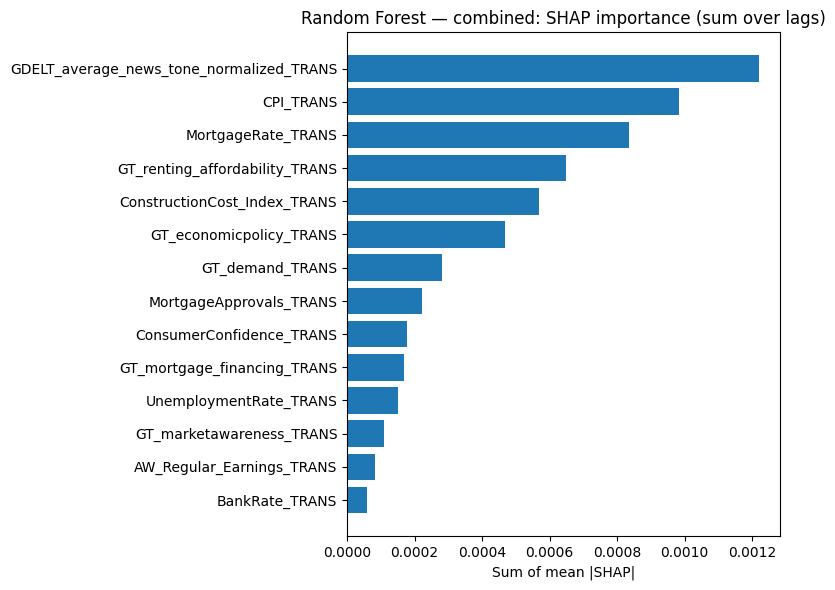


Saved SHAP importance files:
 - RF_shap_features_traditional_lastwindow.csv
 - RF_shap_base_traditional_lastwindow.csv
 - RF_shap_features_highfreq_lastwindow.csv
 - RF_shap_base_highfreq_lastwindow.csv
 - RF_shap_features_combined_lastwindow.csv
 - RF_shap_base_combined_lastwindow.csv


In [ ]:

# SHAP Importance

# Loading final_ml dataset
try:
    df_rf = final_ml.copy()
except NameError:
    df_rf = pd.read_csv("regional_nowcast_features_lag1to6.csv")

df_rf["Date"] = pd.to_datetime(df_rf["Date"])
df_rf = df_rf.sort_values(["Date", "RegionName"]).reset_index(drop=True)

TARGET        = "HPI_TRANS"
START_TEST    = pd.Timestamp("2018-01-01")
WINDOW_MONTHS = 60
all_dates     = sorted(df_rf["Date"].unique())

def last_rolling_window(dates, start_test, window_months=60):
    test_dates = [d for d in dates if d >= start_test]
    last_test  = max(test_dates)
    train_end  = last_test - pd.offsets.MonthBegin(1)
    train_start = train_end - pd.DateOffset(months=window_months) + pd.offsets.MonthBegin(1)
    return (train_start, train_end), last_test

def base_name(feat):
    m = re.search(r"^(.*)_lag\d+$", feat)
    return m.group(1) if m else feat

saved_shap_files = []

for spec_key, feature_cols in FEATURE_SETS.items():
    print(f"\n=== Random Forest SHAP Importance — {spec_key} specification ===")

    (train_start, train_end), test_date = last_rolling_window(all_dates, START_TEST, WINDOW_MONTHS)

    train_mask = (df_rf["Date"] >= train_start) & (df_rf["Date"] <= train_end)
    test_mask  = (df_rf["Date"] == test_date)

    train_df = df_rf.loc[train_mask]
    test_df  = df_rf.loc[test_mask]

    if train_df["Date"].nunique() < 24 or test_df.empty:
        print(f"Skipping {spec_key} — insufficient data")
        continue

    X_tr, y_tr = train_df[feature_cols], train_df[TARGET]
    X_te       = test_df[feature_cols]

    # Fitting RF
    rf = RandomForestRegressor(
        n_estimators=600,
        min_samples_leaf=3,
        max_features="sqrt",
        random_state=42,
        n_jobs=-1
    ).fit(X_tr, y_tr)

    # Background sample for SHAP
    bg_size = min(2000, len(X_tr))
    X_bg    = X_tr.sample(n=bg_size, random_state=42)

    # Limiting explanation sample to keep SHAP fast
    X_explain = X_te.copy()
    if len(X_explain) > 800:
        X_explain = X_explain.sample(n=800, random_state=42)

    print(f"Computing SHAP for {spec_key} "
          f"(background={len(X_bg)}, explain={len(X_explain)})")

    masker    = shap.maskers.Independent(X_bg)
    explainer = shap.Explainer(rf, masker)
    shap_values = explainer(X_explain, check_additivity=False).values

    # Mean absolute SHAP per feature
    mean_abs = np.abs(shap_values).mean(axis=0)
    shap_feat = (
        pd.Series(mean_abs, index=feature_cols, name="mean_abs_shap")
          .sort_values(ascending=False)
          .reset_index()
          .rename(columns={"index": "feature"})
    )
    shap_feat["base"] = shap_feat["feature"].apply(base_name)

    shap_base = (
        shap_feat.groupby("base", as_index=False)
                 .agg(total_abs_shap=("mean_abs_shap", "sum"))
                 .sort_values("total_abs_shap", ascending=False)
    )

    print("\nTop 15 lagged features:")
    display(shap_feat.head(15))

    print("\nTop 15 base variables:")
    display(shap_base.head(15))

    # Bar plot
    top_base = shap_base.head(15).iloc[::-1]
    plt.figure(figsize=(8, 6))
    plt.barh(top_base["base"], top_base["total_abs_shap"])
    plt.title(f"Random Forest — {spec_key}: SHAP importance (sum over lags)")
    plt.xlabel("Sum of mean |SHAP|")
    plt.tight_layout()
    plt.show()

    # Save files
    shap_feat_file = f"RF_shap_features_{spec_key}_lastwindow.csv"
    shap_base_file = f"RF_shap_base_{spec_key}_lastwindow.csv"
    shap_feat.to_csv(shap_feat_file, index=False)
    shap_base.to_csv(shap_base_file, index=False)
    saved_shap_files.extend([shap_feat_file, shap_base_file])

print("\nSaved SHAP importance files:")
for f in saved_shap_files:
    print(" -", f)

Traditional — RMSE=0.00510, MAE=0.00421


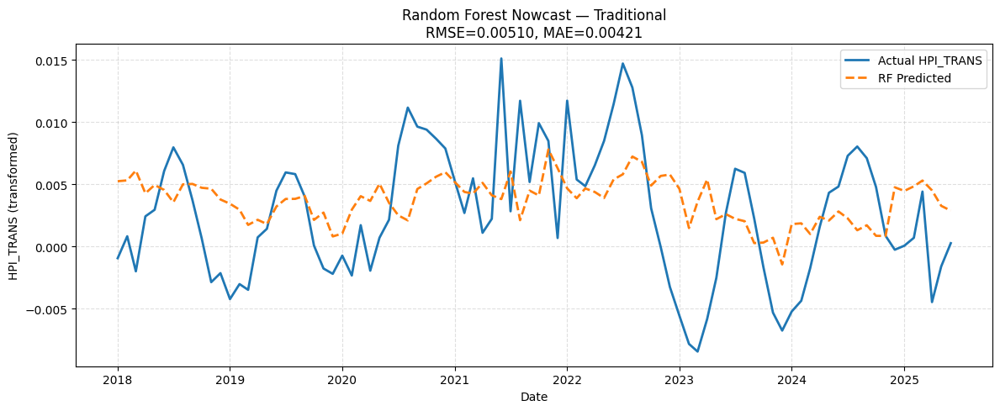

High-Frequency — RMSE=0.00491, MAE=0.00410


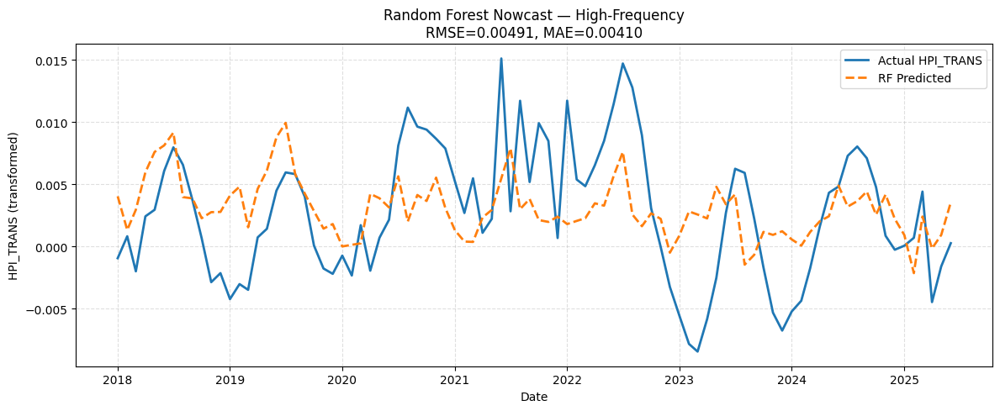

Combined — RMSE=0.00486, MAE=0.00404


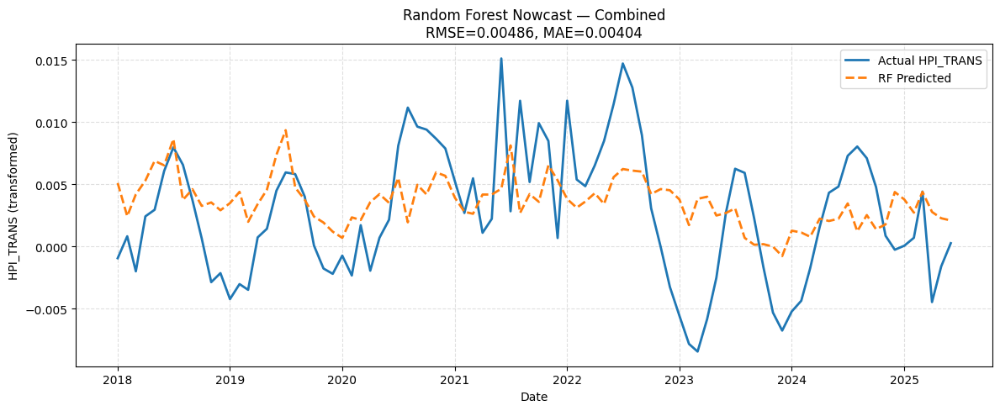

In [ ]:
# Plot of Actual vs Predicted- Random Forest for all specifications
WINDOW_MONTHS = 60
SPECS = ["Traditional", "High-Frequency", "Combined"]

def load_rf_nowcast(spec):
    """
    Load RF nowcast file for a given specification and
    standardise column names to 'Actual' and 'Predicted'.
    """
    fname = f"UK_nowcast_RF_{spec}_rolling{WINDOW_MONTHS}m.csv"
    df = pd.read_csv(fname, parse_dates=["Date"])
    df = df.set_index("Date").sort_index()

    # Identify columns
    pred_col = [c for c in df.columns if "pred" in c.lower()][0]
    true_col = [c for c in df.columns if "true" in c.lower() or "hpi_trans" in c.lower()][0]

    df = df[[true_col, pred_col]].rename(columns={
        true_col: "Actual",
        pred_col: "Predicted"
    })
    return df

def rmse_mae(y_true, y_pred):
    """Simple RMSE and MAE helper."""
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    rmse = float(np.sqrt(np.mean((y_true - y_pred) ** 2)))
    mae  = float(np.mean(np.abs(y_true - y_pred)))
    return rmse, mae

for spec in SPECS:
    df_spec = load_rf_nowcast(spec)

    # Optionally restrict to modelling period
    df_spec = df_spec.loc["2018-01-01":]

    rmse, mae = rmse_mae(df_spec["Actual"], df_spec["Predicted"])
    print(f"{spec} — RMSE={rmse:.5f}, MAE={mae:.5f}")

    plt.figure(figsize=(12, 5))
    plt.plot(df_spec.index, df_spec["Actual"], label="Actual HPI_TRANS", linewidth=2)
    plt.plot(df_spec.index, df_spec["Predicted"], "--", label="RF Predicted", linewidth=2)
    plt.title(f"Random Forest Nowcast — {spec}\nRMSE={rmse:.5f}, MAE={mae:.5f}")
    plt.xlabel("Date")
    plt.ylabel("HPI_TRANS (transformed)")
    plt.grid(True, linestyle="--", alpha=0.4)
    plt.legend()
    plt.tight_layout()
    plt.show()

In [ ]:
# ML model results summary
results_all_ml = [
    # === LINEAR ML MODELS (ROLLING 60m) ===
    {"Model": "Ridge", "Spec": "Traditional", "Mode": "Rolling-60m", "RMSE": 0.03522, "MAE": 0.01867},
    {"Model": "Ridge", "Spec": "High-Frequency", "Mode": "Rolling-60m", "RMSE": 0.00760, "MAE": 0.00599},
    {"Model": "Ridge", "Spec": "Combined", "Mode": "Rolling-60m", "RMSE": 0.00993, "MAE": 0.0070},
    {"Model": "Lasso", "Spec": "Traditional", "Mode": "Rolling-60m", "RMSE": 0.00559, "MAE": 0.00458},
    {"Model": "Lasso", "Spec": "High-Frequency", "Mode": "Rolling-60m", "RMSE": 0.00533, "MAE": 0.00436},
    {"Model": "Lasso", "Spec": "Combined", "Mode": "Rolling-60m", "RMSE": 0.00558, "MAE": 0.00456},

    # === TREE-BASED ML MODELS (ROLLING 60m) ===
    {"Model": "XGBoost", "Spec": "Traditional", "Mode": "Rolling-60m", "RMSE": 0.00524, "MAE": 0.00421},
    {"Model": "XGBoost", "Spec": "High-Frequency", "Mode": "Rolling-60m", "RMSE": 0.00502, "MAE": 0.00418},
    {"Model": "XGBoost", "Spec": "Combined", "Mode": "Rolling-60m", "RMSE": 0.00509, "MAE": 0.00415},
    {"Model": "RandomForest", "Spec": "Traditional", "Mode": "Rolling-60m", "RMSE": 0.00510, "MAE": 0.00421},
    {"Model": "RandomForest", "Spec": "High-Frequency", "Mode": "Rolling-60m", "RMSE": 0.00491, "MAE": 0.00410},
    {"Model": "RandomForest", "Spec": "Combined", "Mode": "Rolling-60m", "RMSE": 0.00486, "MAE": 0.00404}
]

# Creating a dataframe
summary_df_ml = pd.DataFrame(results_all_ml)
summary_df_ml = summary_df_ml.sort_values(by="RMSE").reset_index(drop=True)

# Display neatly
pd.options.display.float_format = "{:,.5f}".format
display(summary_df_ml)

# Save to CSV
summary_df_ml.to_csv("ML_Model_Evaluation_Summary.csv", index=False)
print("Saved: ML_Model_Evaluation_Summary.csv")


,Model,Spec,Mode,RMSE,MAE
0,RandomForest,Combined,Rolling-60m,0.00486,0.00404
1,RandomForest,High-Frequency,Rolling-60m,0.00491,0.00410
2,XGBoost,High-Frequency,Rolling-60m,0.00502,0.00418
3,XGBoost,Combined,Rolling-60m,0.00509,0.00415
4,RandomForest,Traditional,Rolling-60m,0.00510,0.00421
5,XGBoost,Traditional,Rolling-60m,0.00524,0.00421
6,Lasso,High-Frequency,Rolling-60m,0.00533,0.00436
7,Lasso,Combined,Rolling-60m,0.00558,0.00456
8,Lasso,Traditional,Rolling-60m,0.00559,0.00458
9,Ridge,High-Frequency,Rolling-60m,0.00760,0.00599


Saved: ML_Model_Evaluation_Summary.csv


In [ ]:
# Summary of all models

results_all = [
    # === ECONOMETRIC MODELS ===
    {"Model": "ARIMA (2,0,5)", "Spec": "—", "Mode": "Expanding", "RMSE": 0.01221, "MAE": 0.00703},
    {"Model": "SARIMA ((1,0,0)(0,0,0,12))", "Spec": "—", "Mode": "Expanding", "RMSE": 0.01428, "MAE": 0.00838},
    {"Model": "VAR", "Spec": "Traditional", "Mode": "Expanding", "RMSE": 0.01419, "MAE": 0.00860},
    {"Model": "VAR", "Spec": "High-Frequency", "Mode": "Expanding", "RMSE": 0.01337, "MAE": 0.00833},
    {"Model": "VAR", "Spec": "Combined", "Mode": "Expanding", "RMSE": 0.01697, "MAE": 0.01222},

    # === LINEAR ML MODELS (ROLLING 60m) ===
    {"Model": "Ridge", "Spec": "Traditional", "Mode": "Rolling-60m", "RMSE": 0.03522, "MAE": 0.01867},
    {"Model": "Ridge", "Spec": "High-Frequency", "Mode": "Rolling-60m", "RMSE": 0.00760, "MAE": 0.00599},
    {"Model": "Ridge", "Spec": "Combined", "Mode": "Rolling-60m", "RMSE": 0.00993, "MAE": 0.00703},
    {"Model": "Lasso", "Spec": "Traditional", "Mode": "Rolling-60m", "RMSE": 0.00559, "MAE": 0.00458},
    {"Model": "Lasso", "Spec": "High-Frequency", "Mode": "Rolling-60m", "RMSE": 0.00533, "MAE": 0.00436},
    {"Model": "Lasso", "Spec": "Combined", "Mode": "Rolling-60m", "RMSE": 0.00558, "MAE": 0.00456},

    # === TREE-BASED ML MODELS (ROLLING 60m) ===
    {"Model": "XGBoost", "Spec": "Traditional", "Mode": "Rolling-60m", "RMSE": 0.00524, "MAE": 0.00421},
    {"Model": "XGBoost", "Spec": "High-Frequency", "Mode": "Rolling-60m", "RMSE": 0.00502, "MAE": 0.00418},
    {"Model": "XGBoost", "Spec": "Combined", "Mode": "Rolling-60m", "RMSE": 0.00509, "MAE": 0.00415},
    {"Model": "RandomForest", "Spec": "Traditional", "Mode": "Rolling-60m", "RMSE": 0.00510, "MAE": 0.00421},
    {"Model": "RandomForest", "Spec": "High-Frequency", "Mode": "Rolling-60m", "RMSE": 0.00491, "MAE": 0.00410},
    {"Model": "RandomForest", "Spec": "Combined", "Mode": "Rolling-60m", "RMSE": 0.00486, "MAE": 0.00404}
]

summary_df = pd.DataFrame(results_all)
summary_df = summary_df.sort_values(by="RMSE").reset_index(drop=True)
pd.options.display.float_format = "{:,.5f}".format
display(summary_df)

# Save to CSV
summary_df.to_csv("Unified_Model_Evaluation_Summary.csv", index=False)
print("Saved: Unified_Model_Evaluation_Summary.csv")


,Model,Spec,Mode,RMSE,MAE
0,RandomForest,Combined,Rolling-60m,0.00486,0.00404
1,RandomForest,High-Frequency,Rolling-60m,0.00491,0.00410
2,XGBoost,High-Frequency,Rolling-60m,0.00502,0.00418
3,XGBoost,Combined,Rolling-60m,0.00509,0.00415
4,RandomForest,Traditional,Rolling-60m,0.00510,0.00421
5,XGBoost,Traditional,Rolling-60m,0.00524,0.00421
6,Lasso,High-Frequency,Rolling-60m,0.00533,0.00436
7,Lasso,Combined,Rolling-60m,0.00558,0.00456
8,Lasso,Traditional,Rolling-60m,0.00559,0.00458
9,Ridge,High-Frequency,Rolling-60m,0.00760,0.00599


Saved: Unified_Model_Evaluation_Summary.csv


Diebold Mariano Test

Running the Diebold Mariano Test for Random Forest model's specifications

In [ ]:
# Defining the Diebold-Mariano function
from scipy import stats
def diebold_mariano(y_true, y_pred_1, y_pred_2, loss="SE"):

    y_true   = np.asarray(y_true)
    y_pred_1 = np.asarray(y_pred_1)
    y_pred_2 = np.asarray(y_pred_2)

    # Removing missing values
    mask = (~np.isnan(y_true) &
            ~np.isnan(y_pred_1) &
            ~np.isnan(y_pred_2))
    y_true, y_pred_1, y_pred_2 = y_true[mask], y_pred_1[mask], y_pred_2[mask]

    # Loss differential
    if loss.upper() == "SE":
        d = (y_true - y_pred_1)**2 - (y_true - y_pred_2)**2
    elif loss.upper() == "AE":
        d = np.abs(y_true - y_pred_1) - np.abs(y_true - y_pred_2)
    else:
        raise ValueError("loss must be 'SE' or 'AE'")

    d_bar = np.mean(d)
    var_d = np.var(d, ddof=1)
    T = len(d)

    dm_stat = d_bar / np.sqrt(var_d / T)
    p_val = 2 * (1 - stats.norm.cdf(abs(dm_stat)))

    return dm_stat, p_val

In [ ]:
# Loading the RF files
def load_rf(spec, window=60):
    fname = f"UK_nowcast_RF_{spec}_rolling{window}m.csv"
    df = pd.read_csv(fname, parse_dates=["Date"]).set_index("Date").sort_index()

    # Identify true and predicted columns
    true_col = [c for c in df.columns if "true" in c.lower() or "actual" in c.lower()][0]
    pred_col = [c for c in df.columns if "pred" in c.lower()][0]

    df = df[[true_col, pred_col]].rename(columns={
        true_col: "Actual",
        pred_col: "Pred"
    })
    return df

    # Loading RF results
trad = load_rf("Traditional")
hf   = load_rf("High-Frequency")
comb = load_rf("Combined")

# Align the timelines
df_all = trad.join(hf["Pred"], rsuffix="_HF").join(comb["Pred"], rsuffix="_Comb")

# Extract series
y = df_all["Actual"].values
pred_trad = df_all["Pred"].values
pred_hf   = df_all["Pred_HF"].values
pred_comb = df_all["Pred_Comb"].values

# DM: High-Frequency vs Traditional
dm_hf, p_hf = diebold_mariano(y, pred_hf, pred_trad)
print("DM Test — High-Frequency vs Traditional")
print(f"Statistic: {dm_hf:.4f},   p-value: {p_hf:.4f}\n")

# DM: Combined vs Traditional
dm_comb, p_comb = diebold_mariano(y, pred_comb, pred_trad)
print("DM Test — Combined vs Traditional")
print(f"Statistic: {dm_comb:.4f},   p-value: {p_comb:.4f}")

DM Test — High-Frequency vs Traditional
Statistic: -0.7476,   p-value: 0.4547

DM Test — Combined vs Traditional
Statistic: -2.3967,   p-value: 0.0165


Running the Diebold Mariano Test for XGBoost's specification

In [ ]:
# Loading the XGBoost files
def load_xgb(spec, window=60):
    fname = f"UK_nowcast_XGB_{spec}_rolling{window}m.csv"
    df = pd.read_csv(fname, parse_dates=["Date"]).set_index("Date").sort_index()

    if "UK_HPI_true_mean_of_regions" in df.columns:
        true_col = "UK_HPI_true_mean_of_regions"
    else:
        # Check for columns containing 'true' or 'actual'
        true_candidates = [c for c in df.columns if "true" in c.lower() or "actual" in c.lower()]
        if not true_candidates:
            raise ValueError(f"No actual HPI column found in {fname}")
        true_col = true_candidates[0]

    # Predicted column
    pred_col = [c for c in df.columns if "pred" in c.lower()][0]

    df = df[[true_col, pred_col]].rename(columns={
        true_col: "Actual",
        pred_col: "Pred"
    })
    return df


# Loading XGBoost results for each specification
trad = load_xgb("traditional")
hf   = load_xgb("highfreq")
comb = load_xgb("combined")

# Align the timelines across specs
df_all = trad[["Actual", "Pred"]].rename(columns={"Pred": "Pred_trad"})
df_all = df_all.join(hf["Pred"].rename("Pred_hf"), how="inner")
df_all = df_all.join(comb["Pred"].rename("Pred_comb"), how="inner")

# Extract numpy arrays
y         = df_all["Actual"].values
pred_trad = df_all["Pred_trad"].values
pred_hf   = df_all["Pred_hf"].values
pred_comb = df_all["Pred_comb"].values

# XGBoost: High-frequency vs traditional
dm_hf, p_hf = diebold_mariano(y, pred_hf, pred_trad, loss="SE")
print("XGBoost — High-Frequency vs Traditional")
print(f" DM statistic : {dm_hf:.4f}")
print(f" p-value      : {p_hf:.4f}\n")

# XGBoost: Combined vs traditional
dm_comb, p_comb = diebold_mariano(y, pred_comb, pred_trad, loss="SE")
print("XGBoost — Combined vs Traditional")
print(f" DM statistic : {dm_comb:.4f}")
print(f" p-value      : {p_comb:.4f}")

XGBoost — High-Frequency vs Traditional
 DM statistic : -0.6603
 p-value      : 0.5091

XGBoost — Combined vs Traditional
 DM statistic : -0.8273
 p-value      : 0.4081


Running the Diebold Mariano test on RF vs XG specifications

In [ ]:
# Load RF results
rf_trad = pd.read_csv("UK_nowcast_RF_Traditional_rolling60m.csv", parse_dates=["Date"]).set_index("Date")
rf_hf   = pd.read_csv("UK_nowcast_RF_High-Frequency_rolling60m.csv", parse_dates=["Date"]).set_index("Date")
rf_comb = pd.read_csv("UK_nowcast_RF_Combined_rolling60m.csv", parse_dates=["Date"]).set_index("Date")

# Load XGB results
xgb_trad = pd.read_csv("UK_nowcast_XGB_traditional_rolling60m.csv", parse_dates=["Date"]).set_index("Date")
xgb_hf   = pd.read_csv("UK_nowcast_XGB_highfreq_rolling60m.csv", parse_dates=["Date"]).set_index("Date")
xgb_comb = pd.read_csv("UK_nowcast_XGB_combined_rolling60m.csv", parse_dates=["Date"]).set_index("Date")

print("RF and XGB forecasts loaded successfully.")

RF and XGB forecasts loaded successfully.


In [ ]:
def align_rf_xgb(rf_df, xgb_df):

    rf_cols = list(rf_df.columns)
    rf_pred_col = [c for c in rf_cols if "pred" in c.lower()][0]
    rf_actual_col = [c for c in rf_cols if "true" in c.lower() or "actual" in c.lower()]
    rf_actual_col = rf_actual_col[0] if rf_actual_col else [c for c in rf_cols if c != rf_pred_col][0]

    xgb_cols = list(xgb_df.columns)
    xgb_pred_col = [c for c in xgb_cols if "pred" in c.lower()][0]

    out = pd.DataFrame(index=rf_df.index)
    out["Actual"]   = rf_df[rf_actual_col]
    out["Pred_RF"]  = rf_df[rf_pred_col]
    out["Pred_XGB"] = xgb_df[xgb_pred_col]
    return out.dropna().sort_index()

spec_data = {
    "Traditional": (rf_trad, xgb_trad),
    "High-Frequency": (rf_hf, xgb_hf),
    "Combined": (rf_comb, xgb_comb)
}

for spec, (rf_df, xgb_df) in spec_data.items():
    aligned = align_rf_xgb(rf_df, xgb_df)

    y_true = aligned["Actual"].values
    y_rf   = aligned["Pred_RF"].values
    y_xgb  = aligned["Pred_XGB"].values

    dm_stat, p_val = diebold_mariano(y_true, y_xgb, y_rf, loss="SE")

    print(f"\nDiebold–Mariano Test: XGBoost vs Random Forest — {spec}")
    print(f" DM statistic: {dm_stat:.4f}")
    print(f" p-value     : {p_val:.4f}")


Diebold–Mariano Test: XGBoost vs Random Forest — Traditional
 DM statistic: 0.9636
 p-value     : 0.3352

Diebold–Mariano Test: XGBoost vs Random Forest — High-Frequency
 DM statistic: 0.6931
 p-value     : 0.4882

Diebold–Mariano Test: XGBoost vs Random Forest — Combined
 DM statistic: 1.4003
 p-value     : 0.1614


Regime Dependent error analysis

In [ ]:
# Loading predictions and constructing errors
# Loading RF model predictions
rf_trad = load_rf_nowcast("Traditional")
rf_hf   = load_rf_nowcast("High-Frequency")
rf_comb = load_rf_nowcast("Combined")

# Extracting true UK HPI values
y_true = rf_trad["Actual"]

# Extracting predicted values
pred_trad = rf_trad["Predicted"]
pred_hf   = rf_hf["Predicted"]
pred_comb = rf_comb["Predicted"]

# Computing forecast errors
err_trad = y_true - pred_trad
err_hf   = y_true - pred_hf
err_comb = y_true - pred_comb

print("Shapes:", err_trad.shape, err_hf.shape, err_comb.shape)


Shapes: (90,) (90,) (90,)


In [ ]:
# Construction of the volatility based regime
# 6-month rolling volatility of the true HPI series
vol = y_true.rolling(6).std()

# Quantile cut-offs
q_low  = vol.quantile(0.25)
q_high = vol.quantile(0.75)

# Assign regimes
regimes = pd.Series(index=vol.index, dtype="object")
regimes[vol <= q_low]  = "low"
regimes[(vol > q_low) & (vol < q_high)] = "mid"
regimes[vol >= q_high] = "high"

# Restrict to the forecasting sample only
regimes = regimes.loc[y_true.index]
regime_series = regimes.values

In [ ]:
for reg in ["low", "mid", "high"]:

    idx = np.where(regime_series == reg)[0]

    if len(idx) < 5:
        print(f"\n=== Regime {reg.upper()} (not enough observations) ===")
        continue

    y = y_true.values[idx]

    # Using predictions in DM test
    dm_hf,   p_hf   = diebold_mariano(y, pred_hf.values[idx],   pred_trad.values[idx])
    dm_comb, p_comb = diebold_mariano(y, pred_comb.values[idx], pred_trad.values[idx])

    print(f"\n*********Regime: {reg.upper()} ***********")
    print(f"High-Frequency RF vs Traditional RF:")
    print(f"  DM stat = {dm_hf:.3f},  p-value = {p_hf:.3f}")

    print(f"\nCombined RF vs Traditional RF:")
    print(f"  DM stat = {dm_comb:.3f},  p-value = {p_comb:.3f}")


==================== Regime: LOW ====================
High-Frequency RF vs Traditional RF:
  DM stat = 0.953,  p-value = 0.341

Combined RF vs Traditional RF:
  DM stat = -0.515,  p-value = 0.607

==================== Regime: MID ====================
High-Frequency RF vs Traditional RF:
  DM stat = -0.721,  p-value = 0.471

Combined RF vs Traditional RF:
  DM stat = -1.862,  p-value = 0.063

==================== Regime: HIGH ====================
High-Frequency RF vs Traditional RF:
  DM stat = -0.501,  p-value = 0.617

Combined RF vs Traditional RF:
  DM stat = -1.094,  p-value = 0.274


Regime Dependent Error Analysis: XGBoost

In [ ]:
WINDOW_MONTHS = 60

# Loading and standardising XGBoost nowcast files
def load_xgb_nowcast(spec, window=WINDOW_MONTHS):
    fname = f"UK_nowcast_XGB_{spec}_rolling{window}m.csv"
    df = (
        pd.read_csv(fname, parse_dates=["Date"])
          .set_index("Date")
          .sort_index()
    )

    # Identify true and predicted columns automatically
    true_candidates = [c for c in df.columns if "true" in c.lower() or "actual" in c.lower()]
    if not true_candidates:
        raise ValueError(f"No actual HPI column found in {fname}. Columns: {df.columns.tolist()}")
    true_col = true_candidates[0]

    pred_col = [c for c in df.columns if "pred" in c.lower()][0]

    df = df.rename(columns={
        true_col: "Actual",
        pred_col: "Predicted"
    })
    return df

# Load XGBoost predictions for each specification
xgb_trad = load_xgb_nowcast("traditional")
xgb_hf   = load_xgb_nowcast("highfreq")
xgb_comb = load_xgb_nowcast("combined")

# Use the same true UK HPI series across specs
y_true_xgb = xgb_trad["Actual"]

# Extract predicted values
pred_trad_xgb = xgb_trad["Predicted"]
pred_hf_xgb   = xgb_hf["Predicted"]
pred_comb_xgb = xgb_comb["Predicted"]

# Compute forecast errors
err_trad_xgb = y_true_xgb - pred_trad_xgb
err_hf_xgb   = y_true_xgb - pred_hf_xgb
err_comb_xgb = y_true_xgb - pred_comb_xgb

print("Shapes (XGB errors):",
      err_trad_xgb.shape,
      err_hf_xgb.shape,
      err_comb_xgb.shape)


Shapes (XGB errors): (90,) (90,) (90,)


In [ ]:
# Construction of the volatility based regime
# 6-month rolling volatility of the true HPI series
vol = y_true.rolling(6).std()

# Quantile cut-offs
q_low  = vol.quantile(0.25)
q_high = vol.quantile(0.75)

# Assign regimes
regimes = pd.Series(index=vol.index, dtype="object")
regimes[vol <= q_low]  = "low"
regimes[(vol > q_low) & (vol < q_high)] = "mid"
regimes[vol >= q_high] = "high"

# Restrict to the forecasting sample only
regimes = regimes.loc[y_true.index]
regime_series = regimes.values

In [ ]:
for reg in ["low", "mid", "high"]:
    idx = np.where(regime_series == reg)[0]

    if len(idx) < 5:
        print(f"\n=== Regime {reg.upper()} (not enough observations for DM test) ===")
        continue

    y_reg = y_true_xgb.values[idx]

    dm_hf_xgb, p_hf_xgb = diebold_mariano(
        y_reg,
        pred_hf_xgb.values[idx],
        pred_trad_xgb.values[idx],
        loss="SE"
    )

    dm_comb_xgb, p_comb_xgb = diebold_mariano(
        y_reg,
        pred_comb_xgb.values[idx],
        pred_trad_xgb.values[idx],
        loss="SE"
    )

    print(f"\n***************Regime: {reg.upper()} (XGBoost) *****************")
    print("High-Frequency XGB vs Traditional XGB:")
    print(f"  DM statistic = {dm_hf_xgb:.3f}, p-value = {p_hf_xgb:.3f}")

    print("\nCombined XGB vs Traditional XGB:")
    print(f"  DM statistic = {dm_comb_xgb:.3f}, p-value = {p_comb_xgb:.3f}")


==================== Regime: LOW (XGBoost) ====================
High-Frequency XGB vs Traditional XGB:
  DM statistic = 1.125, p-value = 0.261

Combined XGB vs Traditional XGB:
  DM statistic = 1.821, p-value = 0.069

==================== Regime: MID (XGBoost) ====================
High-Frequency XGB vs Traditional XGB:
  DM statistic = -1.845, p-value = 0.065

Combined XGB vs Traditional XGB:
  DM statistic = -1.547, p-value = 0.122

==================== Regime: HIGH (XGBoost) ====================
High-Frequency XGB vs Traditional XGB:
  DM statistic = 0.018, p-value = 0.986

Combined XGB vs Traditional XGB:
  DM statistic = -1.339, p-value = 0.180
